<a href="https://colab.research.google.com/github/michalkrzyzanowski2001/week19/blob/main/week19task.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import SimpleRNN
from keras.layers import LSTM
from keras.layers import GRU
from sklearn.metrics import mean_squared_error

In [ ]:
dataset = pd.read_csv('airline-passengers (1).csv')
dataset['Month'] = pd.to_datetime(dataset['Month'])
dataset.set_index(['Month'], inplace=True)
dataset

,Passengers
Month,
1949-01-01,112
1949-02-01,118
1949-03-01,132
1949-04-01,129
1949-05-01,121
...,...
1960-08-01,606
1960-09-01,508
1960-10-01,461


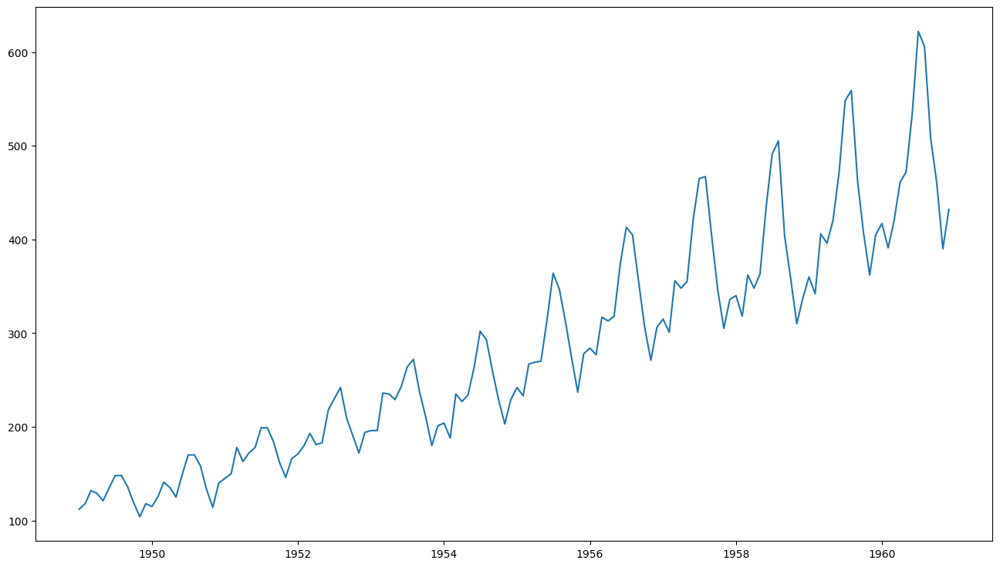

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(dataset['Passengers'])
plt.show()

In [ ]:
train_size = int(len(dataset) * 0.70)
scaler = MinMaxScaler(feature_range=(0, 1))
look_back = 3
def create_dataset(df, train_size, lback=look_back, scaler_function=scaler):
    test_size = len(df) - train_size
    train, test = df[0:train_size,:].copy(), df[train_size:len(df),:].copy()
    train = scaler_function.fit_transform(train)
    test = scaler_function.transform(test)
    X_train, X_test, y_train, y_test = [], [], [], []

    # Tworzenie zbioru treninowego
    for i in range(len(train)-lback-1):
        a = train[i:(i+lback), 0]
        X_train.append(a)
        y_train.append(train[i + lback, 0])

    # Tworzenie zbioru testowego
    for i in range(len(test)-lback-1):
        a = test[i:(i+lback), 0]
        X_test.append(a)
        y_test.append(test[i + lback, 0])

    X_train, X_test = np.array(X_train), np.array(X_test)
    X_train, X_test = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1])), np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
    y_train, y_test = np.array(y_train), np.array(y_test)
    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = create_dataset(df=np.array(dataset), train_size=train_size, lback=look_back)

In [ ]:
X_train[:3]

array([[[0.02588997, 0.04530744, 0.09061489]],

       [[0.04530744, 0.09061489, 0.08090615]],

       [[0.09061489, 0.08090615, 0.05501618]]])

In [ ]:
y_train[:3]

array([0.08090615, 0.05501618, 0.10032362])

In [ ]:
model_rnn = Sequential()
model_rnn.add(SimpleRNN(5, input_shape=(1, look_back)))
model_rnn.add(Dense(1))
model_rnn.compile(loss='mean_squared_error', optimizer='adam')
model_rnn.fit(X_train, y_train, epochs=200, batch_size=1, verbose=1)

Epoch 1/200
96/96 [==============================] - 3s 3ms/step - loss: 0.1020
Epoch 2/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0249
Epoch 3/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 4/200
96/96 [==============================] - 1s 8ms/step - loss: 0.0161
Epoch 5/200
96/96 [==============================] - 1s 6ms/step - loss: 0.0139
Epoch 6/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0128
Epoch 7/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0115
Epoch 8/200
96/96 [==============================] - 1s 6ms/step - loss: 0.0109
Epoch 9/200
96/96 [==============================] - 0s 5ms/step - loss: 0.0112
Epoch 10/200
96/96 [==============================] - 1s 5ms/step - loss: 0.0103
Epoch 11/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0098
Epoch 12/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0100
Epoch 13/200
96/96 [=================

2/2 [==============================] - 0s 11ms/step


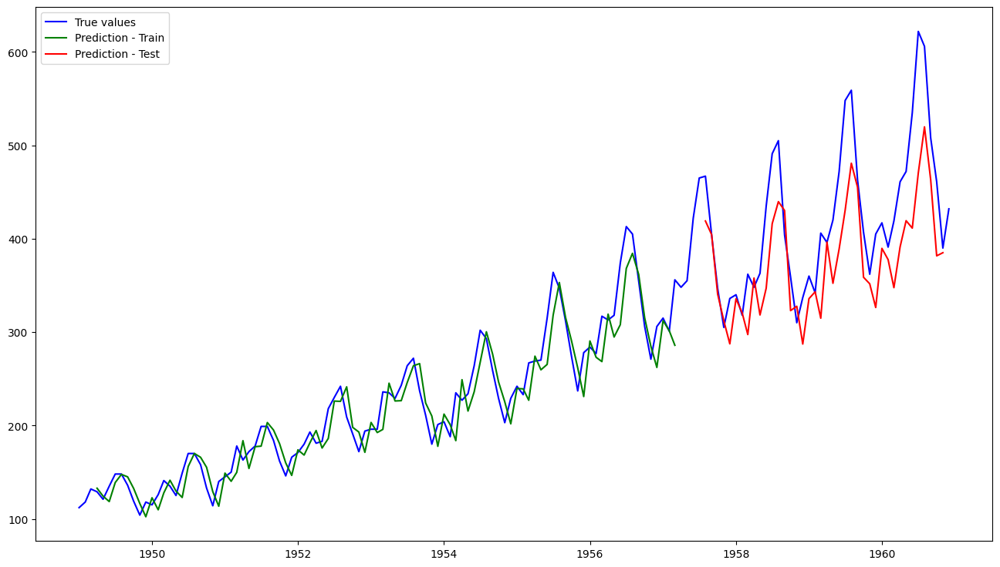


RMSE TEST: 61.25909603422791


In [ ]:
def backtests(model, lback=look_back):

    # predykcja - train
    prediction_train = scaler.inverse_transform(model.predict(X_train))
    prediction_train = pd.Series(prediction_train.flatten(),
                                index=dataset.index[lback:len(prediction_train)+lback])

    # predykcja - test
    prediction_test = scaler.inverse_transform(model.predict(X_test))
    prediction_test = pd.Series(prediction_test.flatten(),
                                index=dataset.index[len(prediction_train)+(2*lback)+1:len(dataset)-1])

    # wizualizacja prognozy
    plt.figure(figsize=(16,9))
    plt.plot(dataset['Passengers'], color='blue', label='True values')
    plt.plot(prediction_train, color='green', label='Prediction - Train')
    plt.plot(prediction_test, color='red', label='Prediction - Test')
    plt.legend(loc='upper left')
    plt.show()

    # obliczenie RMSE
    rmse = mean_squared_error(dataset.loc[prediction_test.index, :], prediction_test) ** 0.5
    print(f'\nRMSE TEST: {rmse}')

backtests(model_rnn)

Epoch 1/200
96/96 [==============================] - 6s 3ms/step - loss: 0.1885
Epoch 2/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0994
Epoch 3/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0514
Epoch 4/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0332
Epoch 5/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0280
Epoch 6/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0248
Epoch 7/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0223
Epoch 8/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0201
Epoch 9/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0178
Epoch 10/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0162
Epoch 11/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0146
Epoch 12/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0136
Epoch 13/200
96/96 [=================

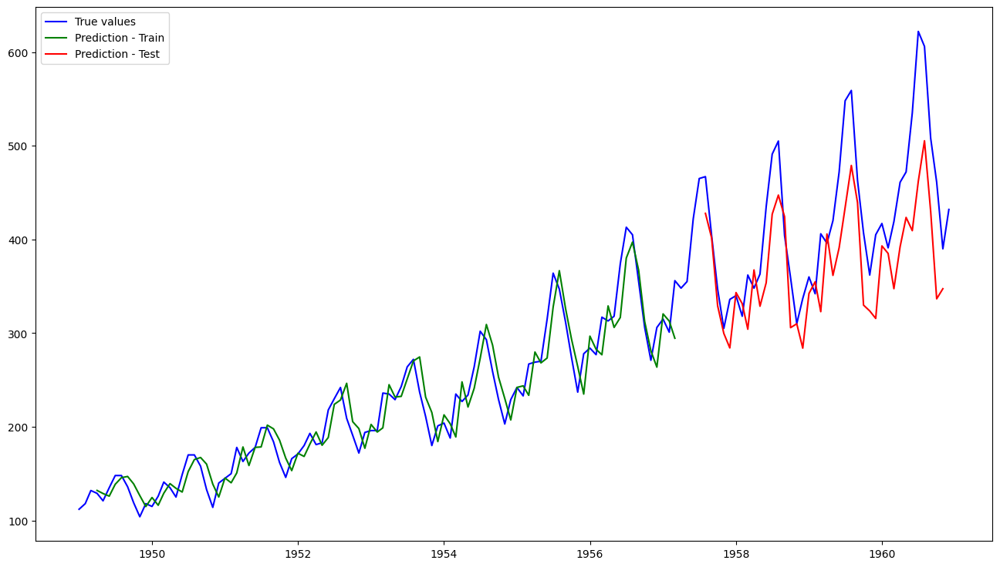


RMSE TEST: 65.2466976476141


In [ ]:
model_lstm = Sequential()
model_lstm.add(LSTM(5, input_shape=(1, look_back)))
model_lstm.add(Dense(1))
model_lstm.compile(loss='mean_squared_error', optimizer='adam')
model_lstm.fit(X_train, y_train, epochs=200, batch_size=1, verbose=1)
backtests(model_lstm)

Epoch 1/200
96/96 [==============================] - 5s 4ms/step - loss: 0.0282
Epoch 2/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0138
Epoch 3/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0119
Epoch 4/200
96/96 [==============================] - 0s 4ms/step - loss: 0.0104
Epoch 5/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0093
Epoch 6/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0084
Epoch 7/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0088
Epoch 8/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0082
Epoch 9/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0078
Epoch 10/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0074
Epoch 11/200
96/96 [==============================] - 0s 3ms/step - loss: 0.0073
Epoch 12/200
96/96 [==============================] - 0s 2ms/step - loss: 0.0070
Epoch 13/200
96/96 [=================

3/3 [==============================] - 0s 5ms/step


2/2 [==============================] - 0s 7ms/step


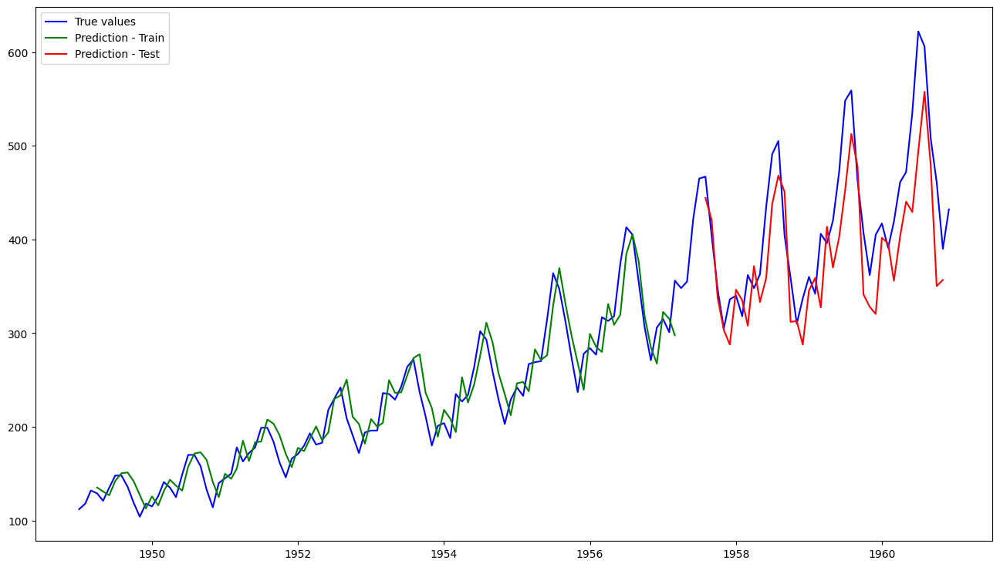


RMSE TEST: 53.83502965379259


In [ ]:
model_gru = Sequential()
model_gru.add(GRU(5, input_shape=(1, look_back)))
model_gru.add(Dense(1))
model_gru.compile(loss='mean_squared_error', optimizer='adam')
model_gru.fit(X_train, y_train, epochs=200, batch_size=1, verbose=1)
backtests(model_gru)

In [ ]:
X_train.shape

(96, 1, 3)

In [ ]:
X_test.shape

(40, 1, 3)

Epoch 1/100
98/98 [==============================] - 3s 4ms/step - loss: 0.1941
Epoch 2/100
98/98 [==============================] - 0s 4ms/step - loss: 0.1347
Epoch 3/100
98/98 [==============================] - 0s 4ms/step - loss: 0.1003
Epoch 4/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0813
Epoch 5/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0708
Epoch 6/100
98/98 [==============================] - 0s 2ms/step - loss: 0.0650
Epoch 7/100
98/98 [==============================] - 0s 2ms/step - loss: 0.0621
Epoch 8/100
98/98 [==============================] - 0s 2ms/step - loss: 0.0605
Epoch 9/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0594
Epoch 10/100
98/98 [==============================] - 0s 2ms/step - loss: 0.0586
Epoch 11/100
98/98 [==============================] - 0s 2ms/step - loss: 0.0581
Epoch 12/100
98/98 [==============================] - 0s 2ms/step - loss: 0.0577
Epoch 13/100
98/98 [=================

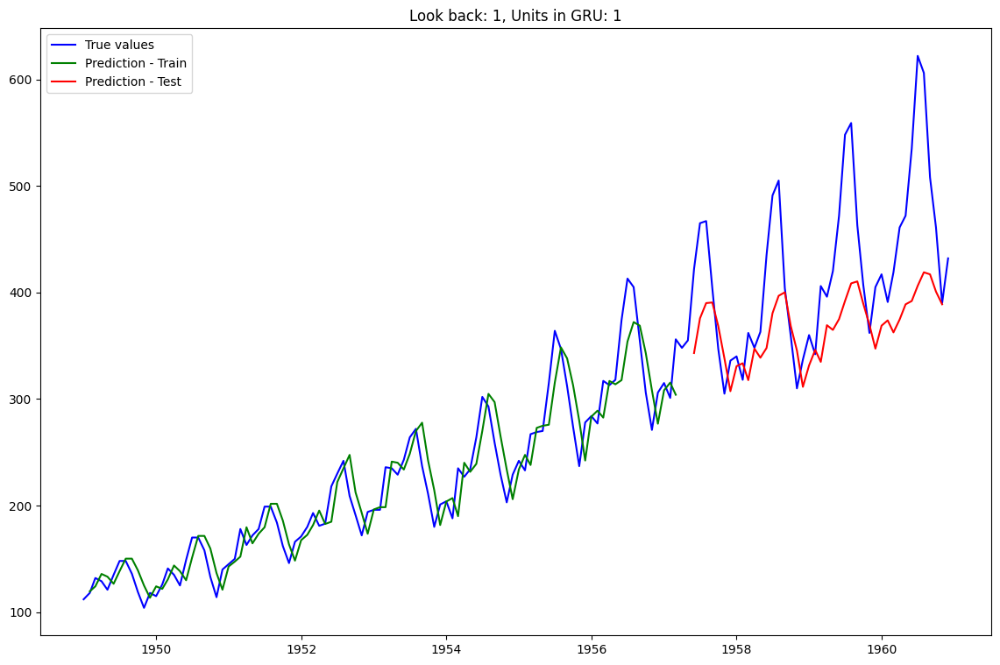

Epoch 1/100
97/97 [==============================] - 2s 2ms/step - loss: 0.0123
Epoch 2/100
97/97 [==============================] - 0s 2ms/step - loss: 0.0107
Epoch 3/100
97/97 [==============================] - 0s 2ms/step - loss: 0.0108
Epoch 4/100
97/97 [==============================] - 0s 2ms/step - loss: 0.0104
Epoch 5/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0105
Epoch 6/100
97/97 [==============================] - 0s 2ms/step - loss: 0.0105
Epoch 7/100
97/97 [==============================] - 0s 2ms/step - loss: 0.0103
Epoch 8/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0104
Epoch 9/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0103
Epoch 10/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 11/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0102
Epoch 12/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0100
Epoch 13/100
97/97 [=================

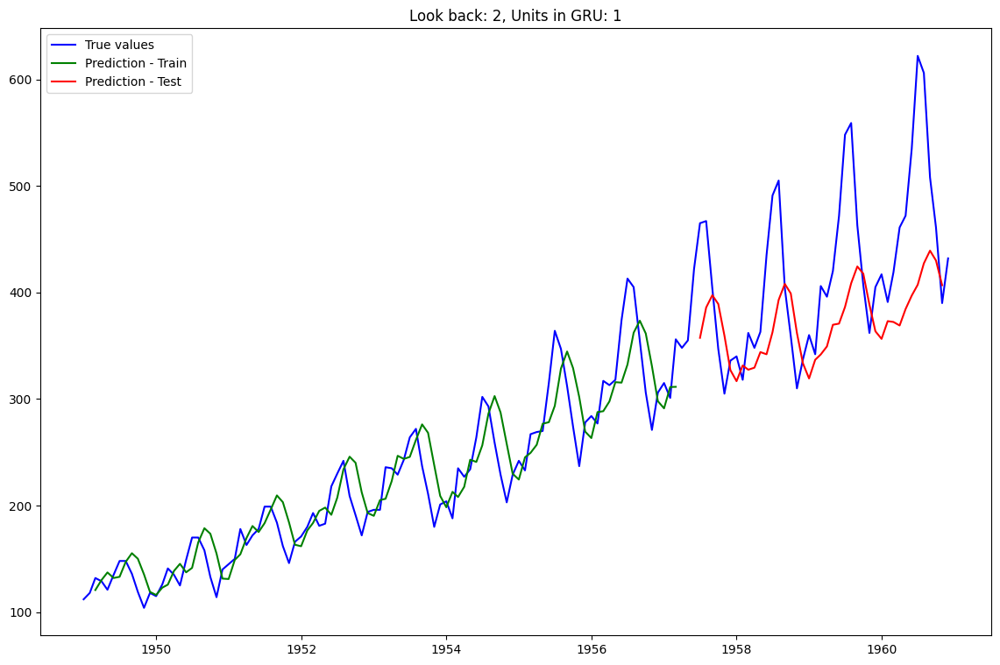

Epoch 1/100
96/96 [==============================] - 2s 2ms/step - loss: 0.1592
Epoch 2/100
96/96 [==============================] - 0s 2ms/step - loss: 0.0683
Epoch 3/100
96/96 [==============================] - 0s 2ms/step - loss: 0.0376
Epoch 4/100
96/96 [==============================] - 0s 2ms/step - loss: 0.0318
Epoch 5/100
96/96 [==============================] - 0s 2ms/step - loss: 0.0294
Epoch 6/100
96/96 [==============================] - 0s 2ms/step - loss: 0.0268
Epoch 7/100
96/96 [==============================] - 0s 2ms/step - loss: 0.0251
Epoch 8/100
96/96 [==============================] - 0s 2ms/step - loss: 0.0231
Epoch 9/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0217
Epoch 10/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0202
Epoch 11/100
96/96 [==============================] - 0s 2ms/step - loss: 0.0189
Epoch 12/100
96/96 [==============================] - 0s 2ms/step - loss: 0.0180
Epoch 13/100
96/96 [=================

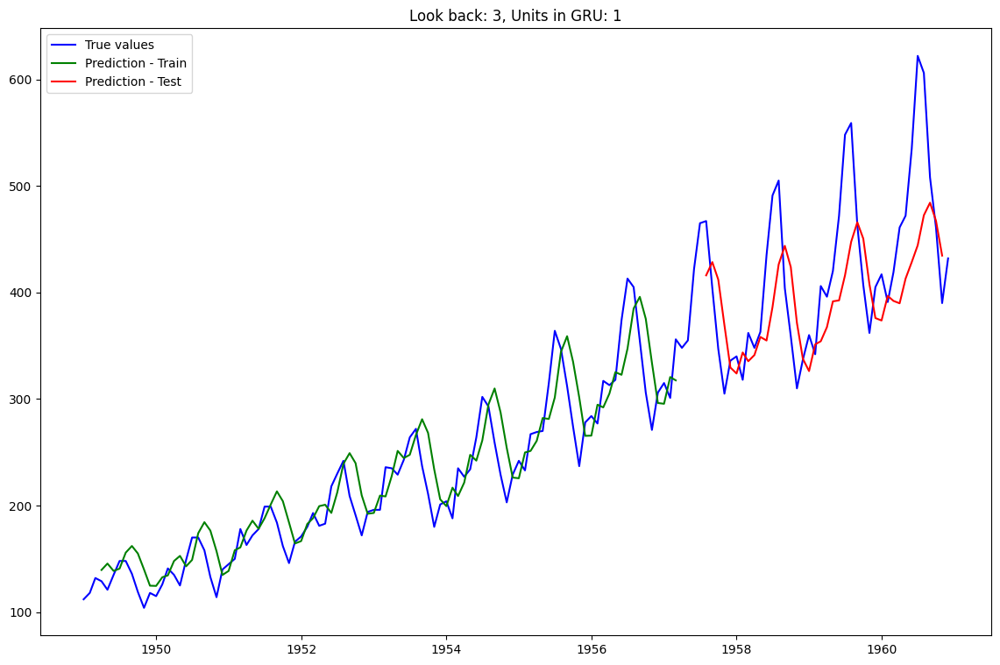

Epoch 1/100
95/95 [==============================] - 2s 4ms/step - loss: 0.5362
Epoch 2/100
95/95 [==============================] - 0s 3ms/step - loss: 0.2898
Epoch 3/100
95/95 [==============================] - 0s 3ms/step - loss: 0.1601
Epoch 4/100
95/95 [==============================] - 0s 4ms/step - loss: 0.1010
Epoch 5/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0750
Epoch 6/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0633
Epoch 7/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0565
Epoch 8/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0518
Epoch 9/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0480
Epoch 10/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0442
Epoch 11/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0409
Epoch 12/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0378
Epoch 13/100
95/95 [=================

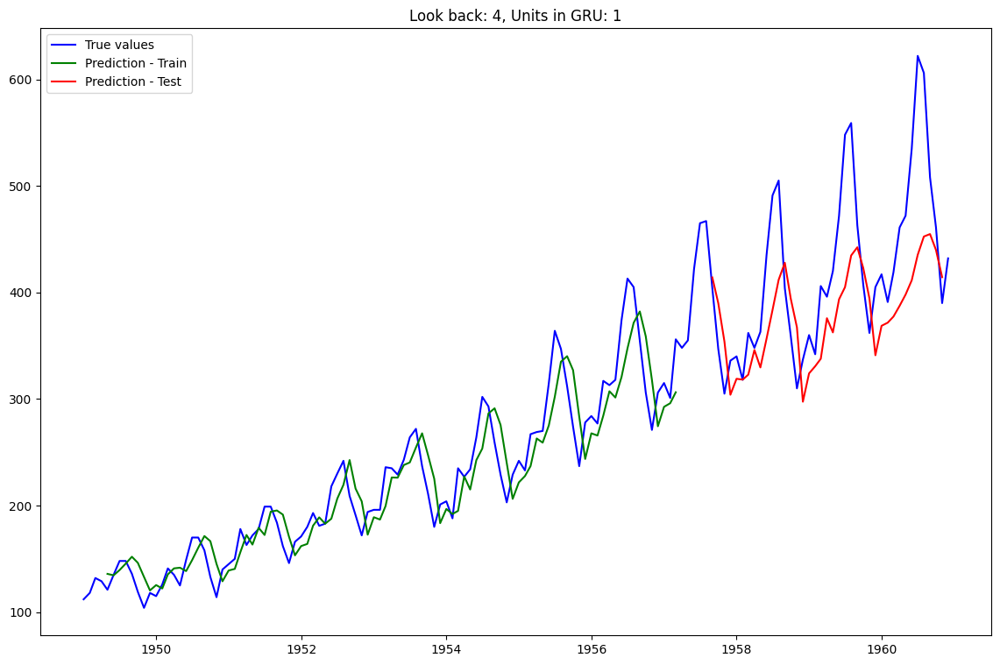

Epoch 1/100
94/94 [==============================] - 2s 2ms/step - loss: 0.0797
Epoch 2/100
94/94 [==============================] - 0s 2ms/step - loss: 0.0356
Epoch 3/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0318
Epoch 4/100
94/94 [==============================] - 0s 2ms/step - loss: 0.0308
Epoch 5/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0292
Epoch 6/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0283
Epoch 7/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0270
Epoch 8/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0260
Epoch 9/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0257
Epoch 10/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0249
Epoch 11/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0240
Epoch 12/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0234
Epoch 13/100
94/94 [=================

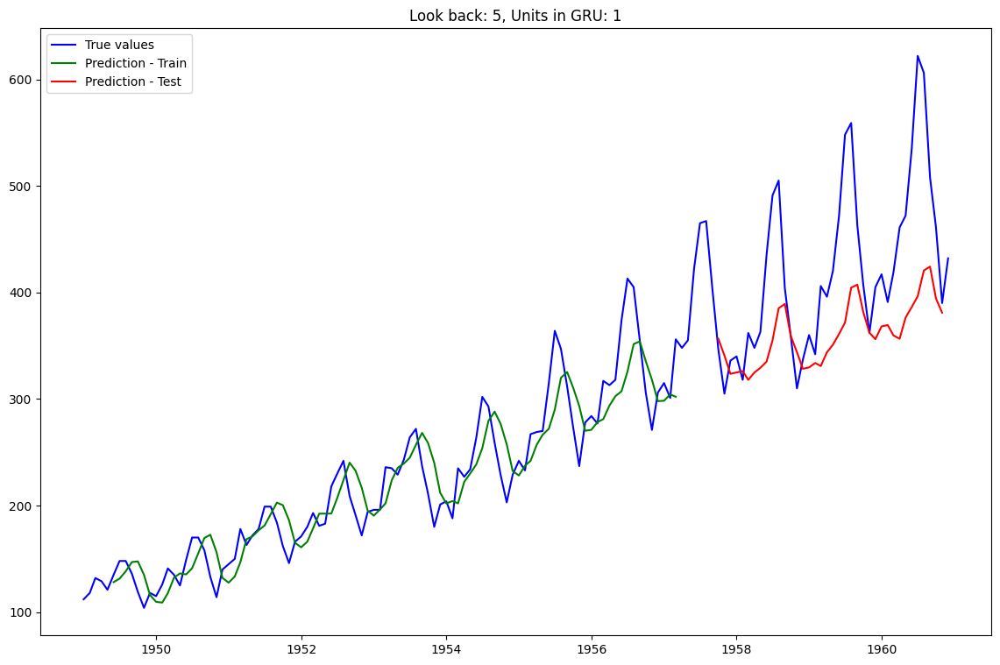

Epoch 1/100
93/93 [==============================] - 2s 3ms/step - loss: 0.0825
Epoch 2/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0455
Epoch 3/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0332
Epoch 4/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0283
Epoch 5/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0254
Epoch 6/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0230
Epoch 7/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0212
Epoch 8/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 9/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0188
Epoch 10/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0176
Epoch 11/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0170
Epoch 12/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0166
Epoch 13/100
93/93 [=================

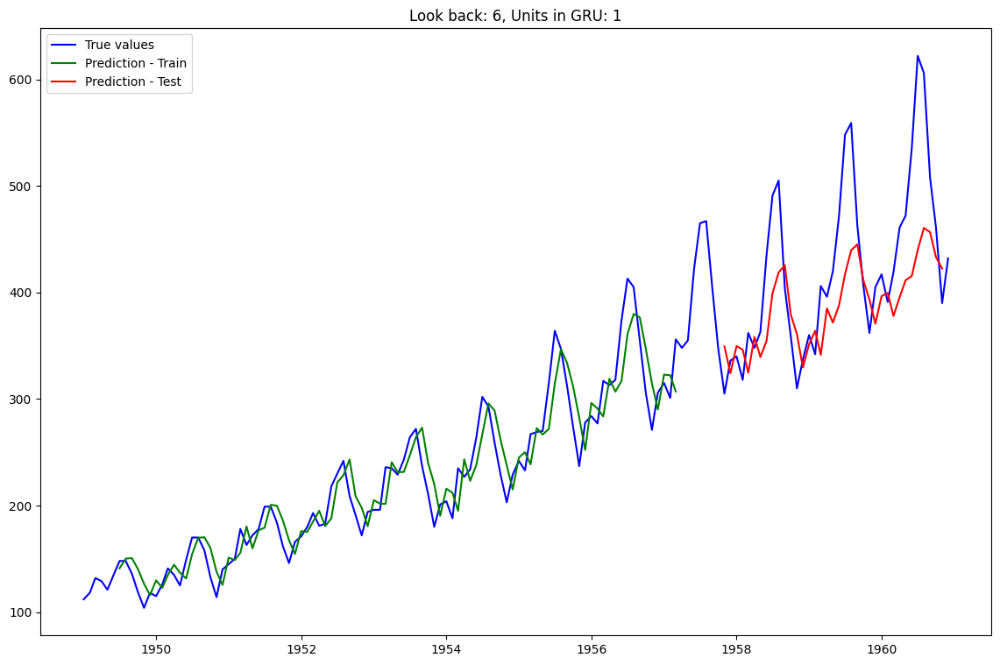

Epoch 1/100
92/92 [==============================] - 2s 2ms/step - loss: 0.1683
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0964
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0523
Epoch 4/100
92/92 [==============================] - 0s 2ms/step - loss: 0.0376
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0329
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0305
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0290
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0275
Epoch 9/100
92/92 [==============================] - 0s 2ms/step - loss: 0.0259
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0247
Epoch 11/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0230
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0216
Epoch 13/100
92/92 [=================

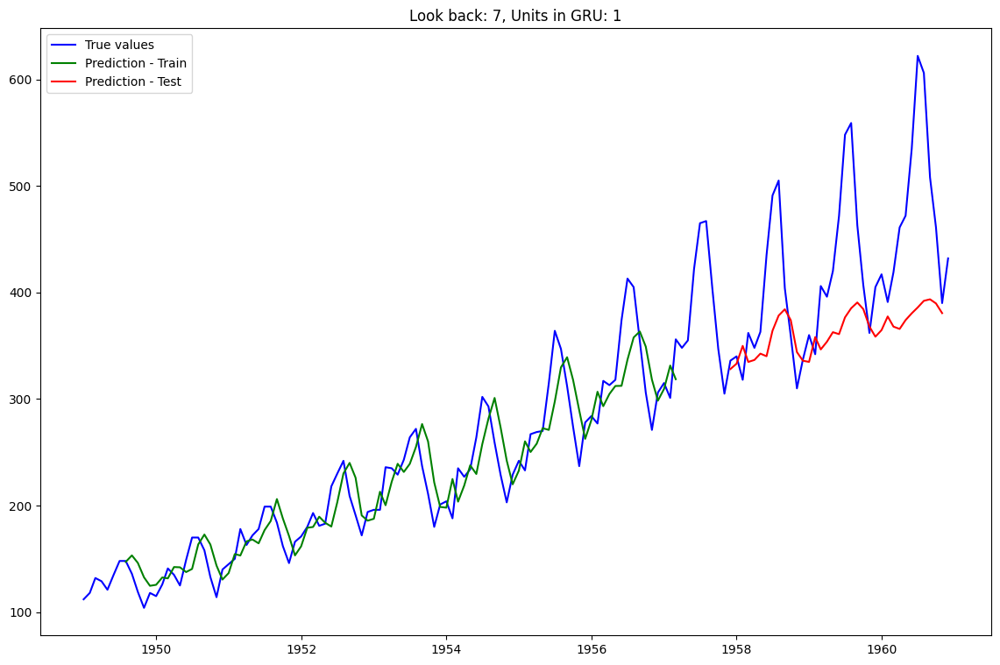

Epoch 1/100
91/91 [==============================] - 2s 2ms/step - loss: 0.0797
Epoch 2/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0291
Epoch 3/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0227
Epoch 4/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0217
Epoch 5/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0211
Epoch 6/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0202
Epoch 7/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0198
Epoch 8/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0191
Epoch 9/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0186
Epoch 10/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 11/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0180
Epoch 12/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0176
Epoch 13/100
91/91 [=================

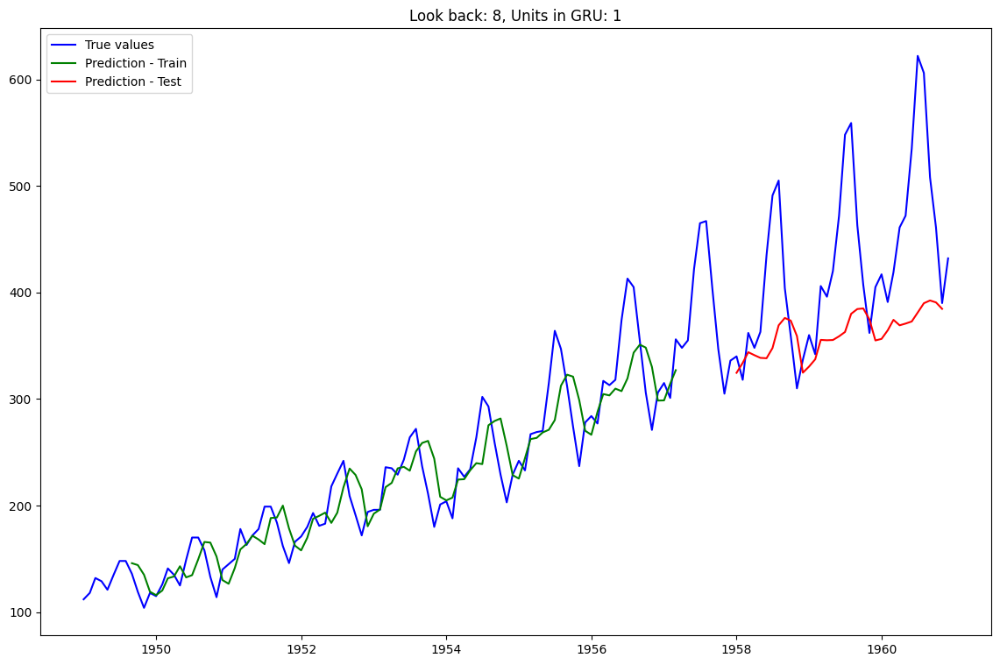

Epoch 1/100
90/90 [==============================] - 3s 3ms/step - loss: 0.1474
Epoch 2/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0591
Epoch 3/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0315
Epoch 4/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0257
Epoch 5/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0222
Epoch 6/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0193
Epoch 7/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0171
Epoch 8/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0158
Epoch 9/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0147
Epoch 10/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0140
Epoch 11/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0132
Epoch 12/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0127
Epoch 13/100
90/90 [=================

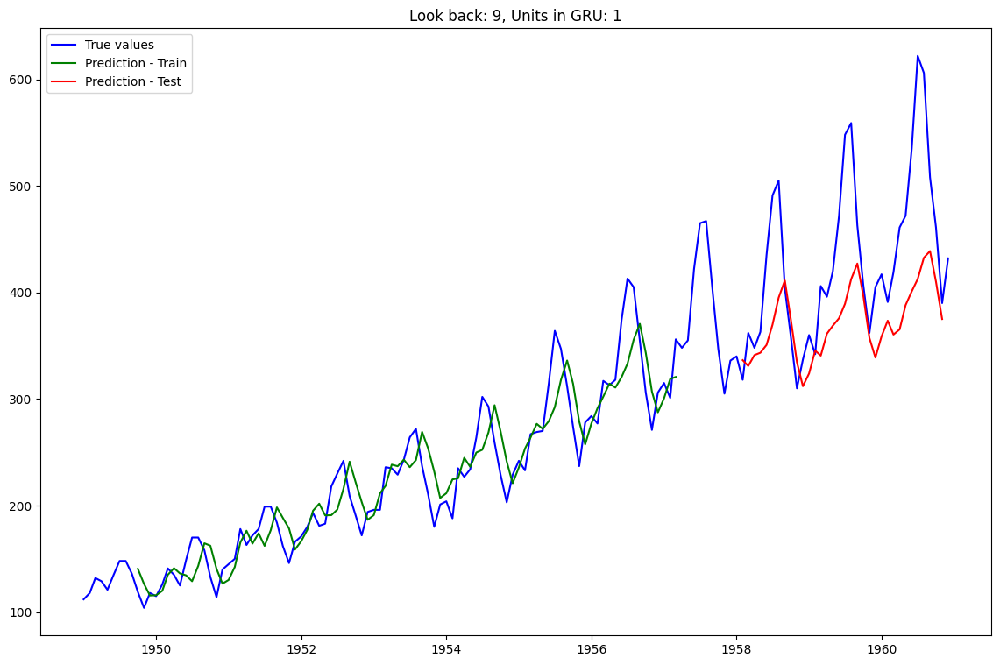

Epoch 1/100
89/89 [==============================] - 3s 2ms/step - loss: 0.2958
Epoch 2/100
89/89 [==============================] - 0s 3ms/step - loss: 0.1445
Epoch 3/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0769
Epoch 4/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0478
Epoch 5/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0377
Epoch 6/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0331
Epoch 7/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0299
Epoch 8/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0269
Epoch 9/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0242
Epoch 10/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0219
Epoch 11/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0196
Epoch 12/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0177
Epoch 13/100
89/89 [=================

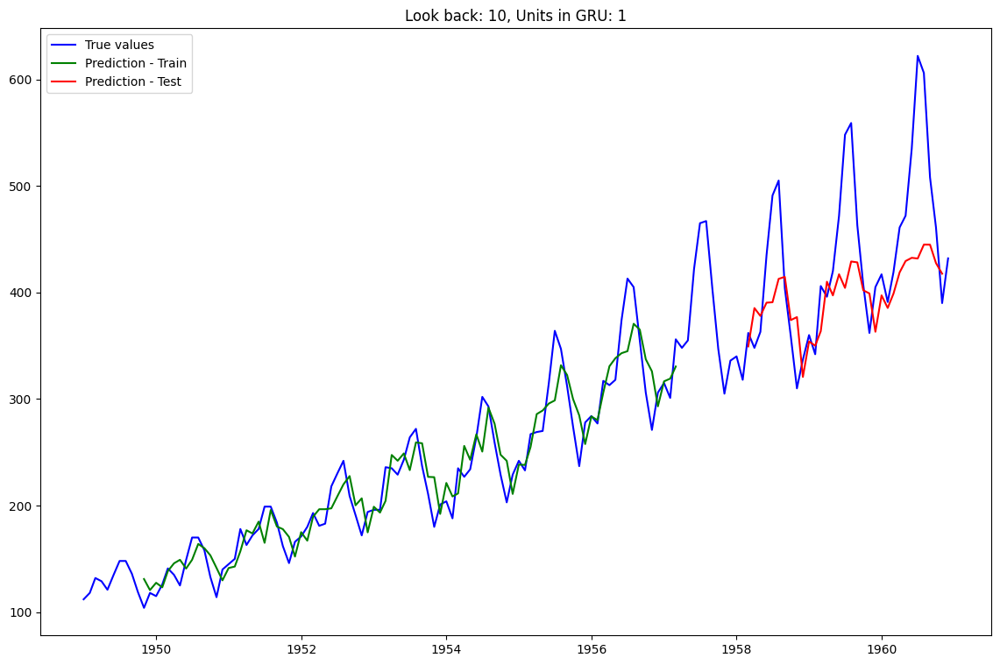

Epoch 1/100
88/88 [==============================] - 2s 3ms/step - loss: 0.0179
Epoch 2/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0153
Epoch 3/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0140
Epoch 4/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0131
Epoch 5/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0128
Epoch 6/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0123
Epoch 7/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0120
Epoch 8/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 9/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0110
Epoch 10/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0107
Epoch 11/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0107
Epoch 12/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 13/100
88/88 [=================

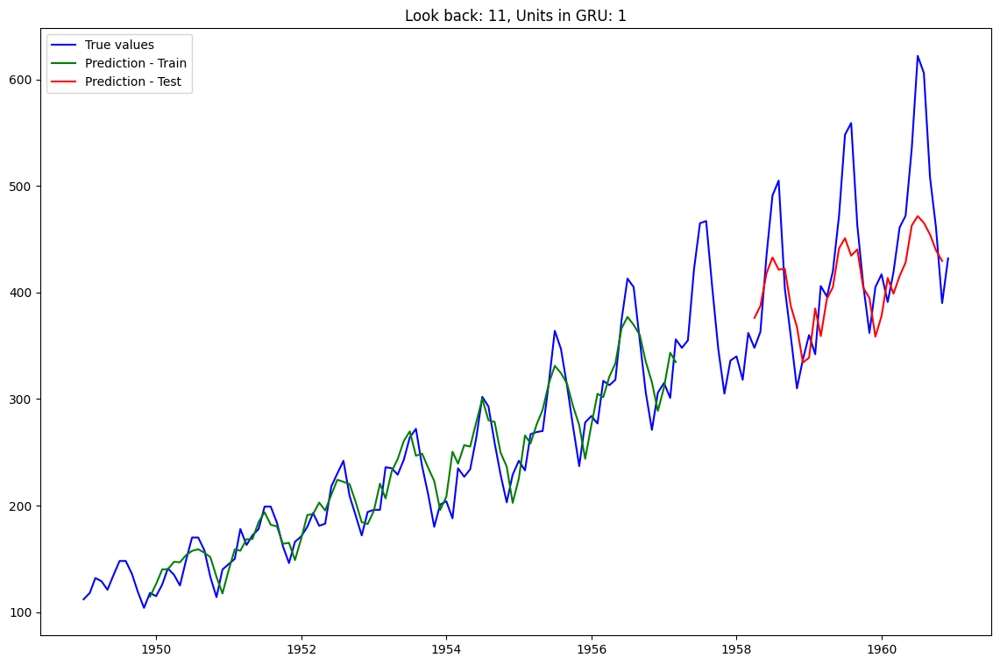

Epoch 1/100
87/87 [==============================] - 3s 3ms/step - loss: 0.4598
Epoch 2/100
87/87 [==============================] - 0s 3ms/step - loss: 0.1655
Epoch 3/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0687
Epoch 4/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0450
Epoch 5/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0386
Epoch 6/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0350
Epoch 7/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0319
Epoch 8/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0289
Epoch 9/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0263
Epoch 10/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0236
Epoch 11/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0217
Epoch 12/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0194
Epoch 13/100
87/87 [=================

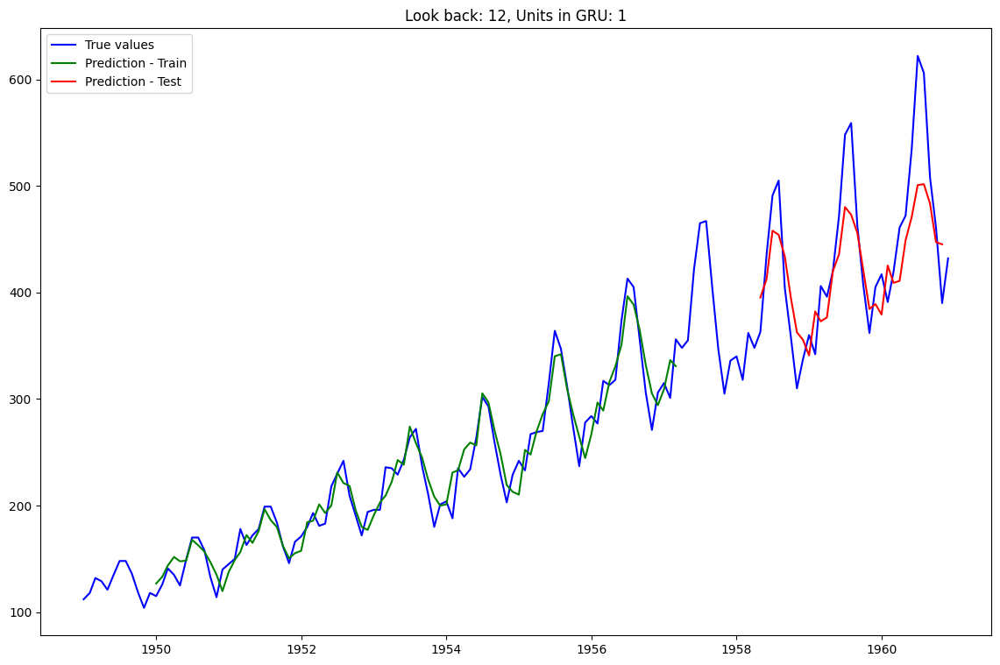

Epoch 1/100
98/98 [==============================] - 2s 3ms/step - loss: 0.0408
Epoch 2/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0213
Epoch 3/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0177
Epoch 4/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0151
Epoch 5/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0127
Epoch 6/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0109
Epoch 7/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0093
Epoch 8/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 9/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0072
Epoch 10/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0067
Epoch 11/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 12/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0062
Epoch 13/100
98/98 [=================

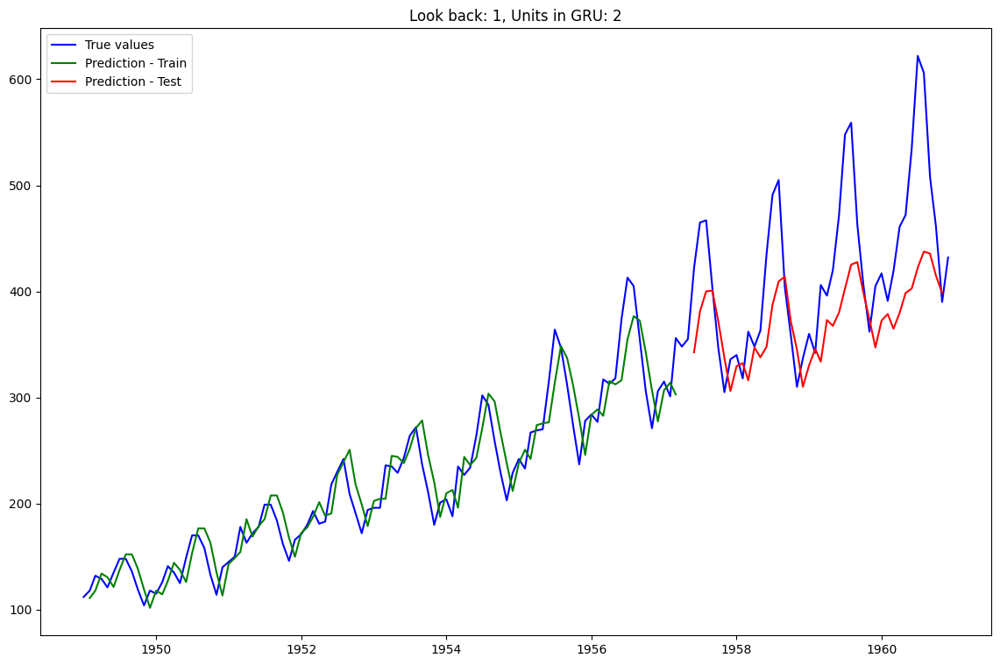

Epoch 1/100
97/97 [==============================] - 2s 3ms/step - loss: 0.0958
Epoch 2/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0420
Epoch 3/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0268
Epoch 4/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0229
Epoch 5/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0206
Epoch 6/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 7/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0162
Epoch 8/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0145
Epoch 9/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0132
Epoch 10/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0121
Epoch 11/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0110
Epoch 12/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0106
Epoch 13/100
97/97 [=================

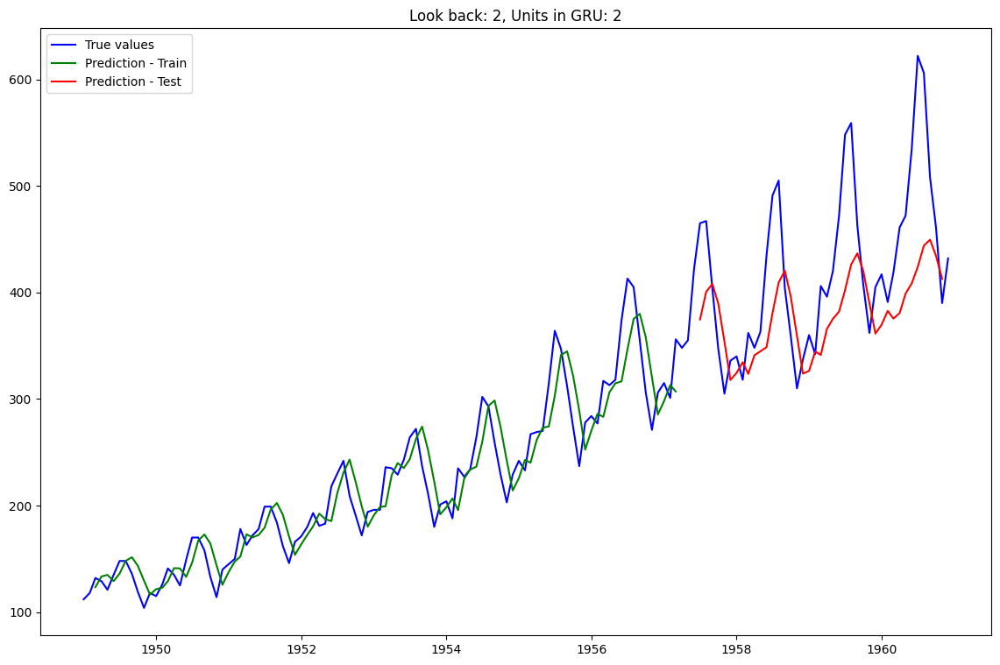

Epoch 1/100
96/96 [==============================] - 2s 3ms/step - loss: 0.1234
Epoch 2/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0476
Epoch 3/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0317
Epoch 4/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0268
Epoch 5/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0236
Epoch 6/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0204
Epoch 7/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0180
Epoch 8/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0158
Epoch 9/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0143
Epoch 10/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0128
Epoch 11/100
96/96 [==============================] - 0s 5ms/step - loss: 0.0118
Epoch 12/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 13/100
96/96 [=================

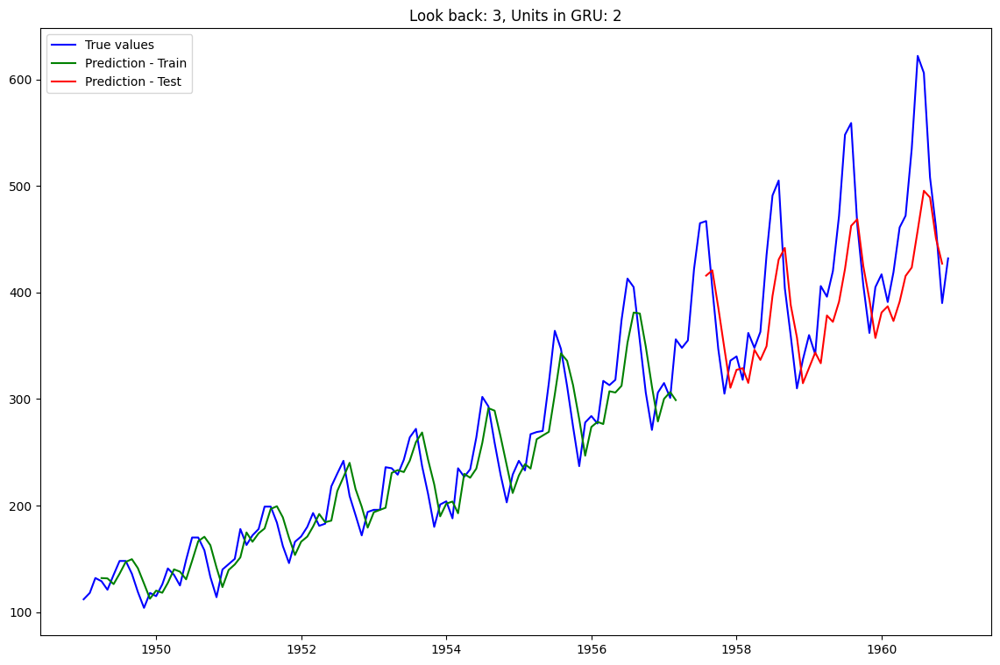

Epoch 1/100
95/95 [==============================] - 2s 3ms/step - loss: 0.0775
Epoch 2/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0255
Epoch 3/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0199
Epoch 4/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0178
Epoch 5/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0167
Epoch 6/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0155
Epoch 7/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0147
Epoch 8/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0138
Epoch 9/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0133
Epoch 10/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0127
Epoch 11/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0123
Epoch 12/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0117
Epoch 13/100
95/95 [=================

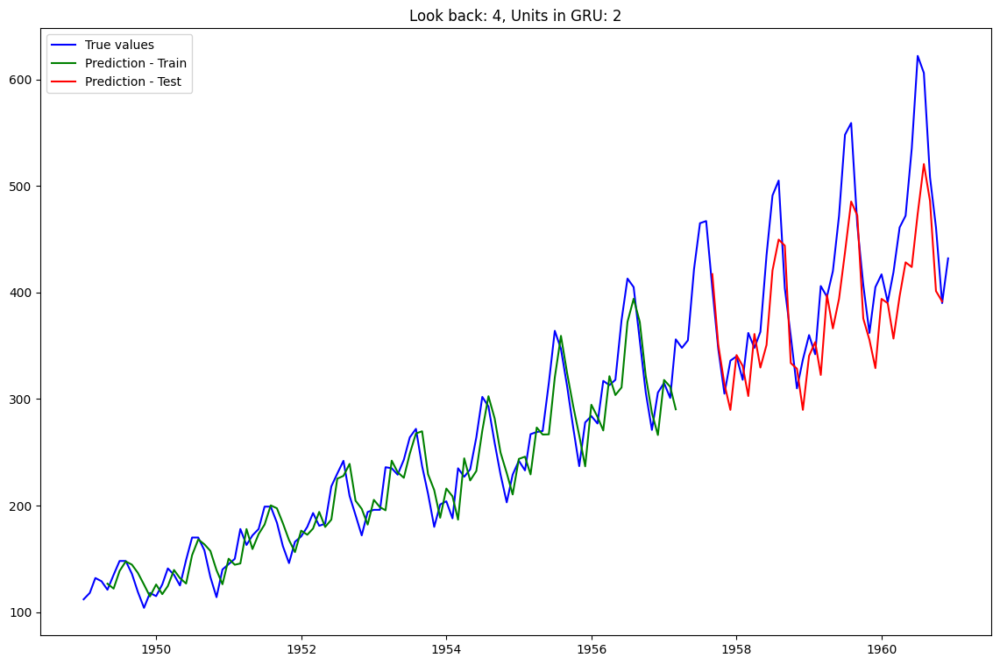

Epoch 1/100
94/94 [==============================] - 2s 3ms/step - loss: 0.1188
Epoch 2/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0486
Epoch 3/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0282
Epoch 4/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0239
Epoch 5/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0221
Epoch 6/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0207
Epoch 7/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0194
Epoch 8/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0184
Epoch 9/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0174
Epoch 10/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0165
Epoch 11/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0159
Epoch 12/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0153
Epoch 13/100
94/94 [=================

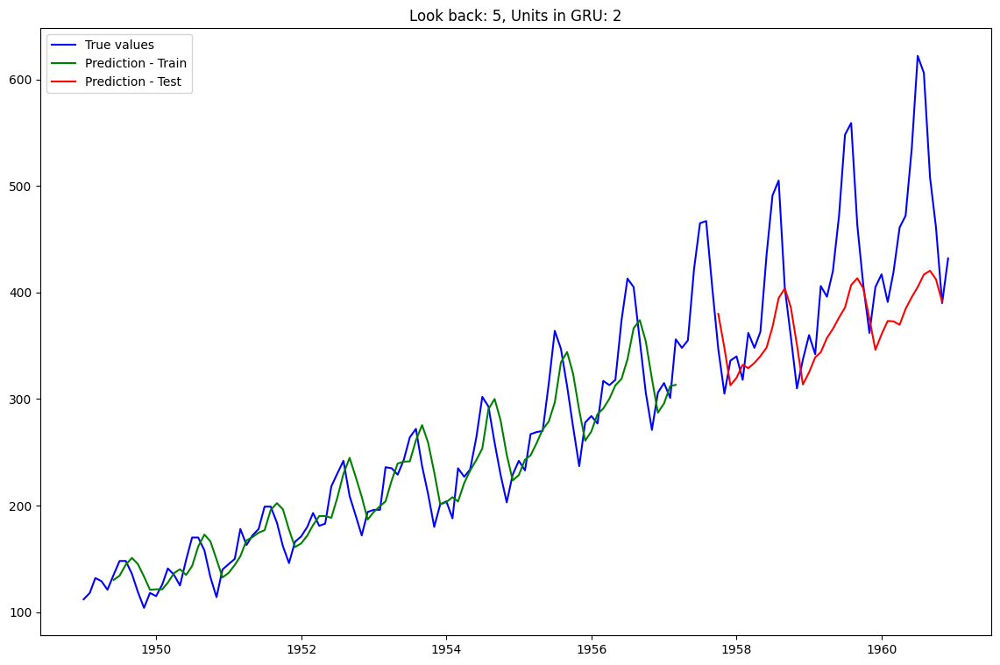

Epoch 1/100
93/93 [==============================] - 4s 4ms/step - loss: 0.1526
Epoch 2/100
93/93 [==============================] - 0s 5ms/step - loss: 0.0414
Epoch 3/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0286
Epoch 4/100
93/93 [==============================] - 0s 5ms/step - loss: 0.0252
Epoch 5/100
93/93 [==============================] - 0s 5ms/step - loss: 0.0226
Epoch 6/100
93/93 [==============================] - 0s 5ms/step - loss: 0.0207
Epoch 7/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0191
Epoch 8/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0179
Epoch 9/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0172
Epoch 10/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0165
Epoch 11/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0157
Epoch 12/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0154
Epoch 13/100
93/93 [=================

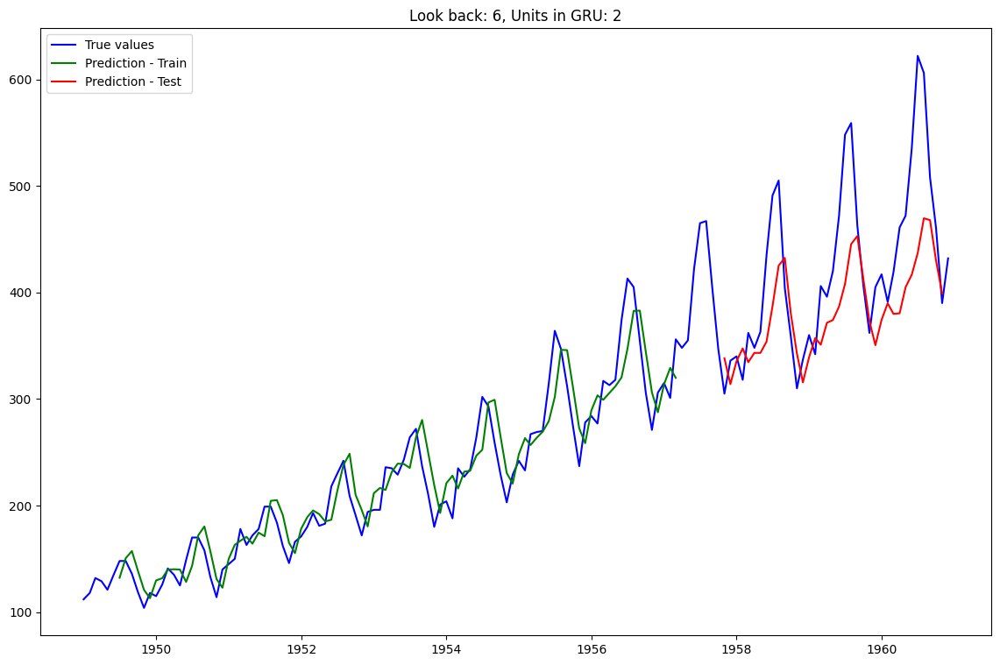

Epoch 1/100
92/92 [==============================] - 2s 3ms/step - loss: 0.1982
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0594
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0273
Epoch 4/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0229
Epoch 5/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0206
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 7/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0174
Epoch 8/100
92/92 [==============================] - 0s 5ms/step - loss: 0.0161
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0149
Epoch 10/100
92/92 [==============================] - 0s 5ms/step - loss: 0.0145
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0137
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0132
Epoch 13/100
92/92 [=================

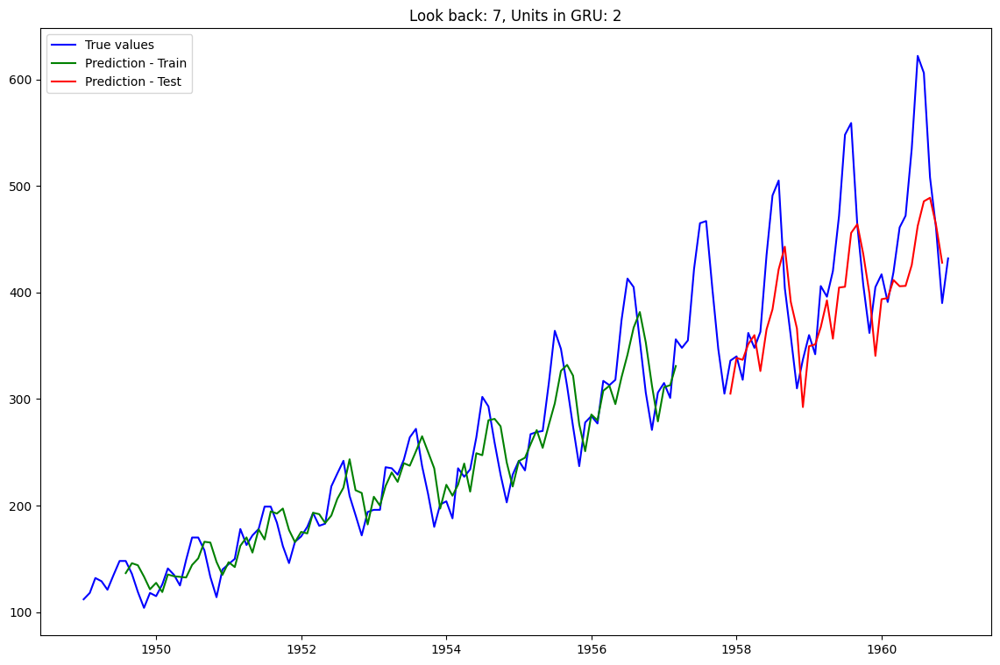

Epoch 1/100
91/91 [==============================] - 3s 5ms/step - loss: 0.3012
Epoch 2/100
91/91 [==============================] - 0s 4ms/step - loss: 0.1063
Epoch 3/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0526
Epoch 4/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0427
Epoch 5/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0396
Epoch 6/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0367
Epoch 7/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0347
Epoch 8/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0321
Epoch 9/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0302
Epoch 10/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0282
Epoch 11/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0268
Epoch 12/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0255
Epoch 13/100
91/91 [=================

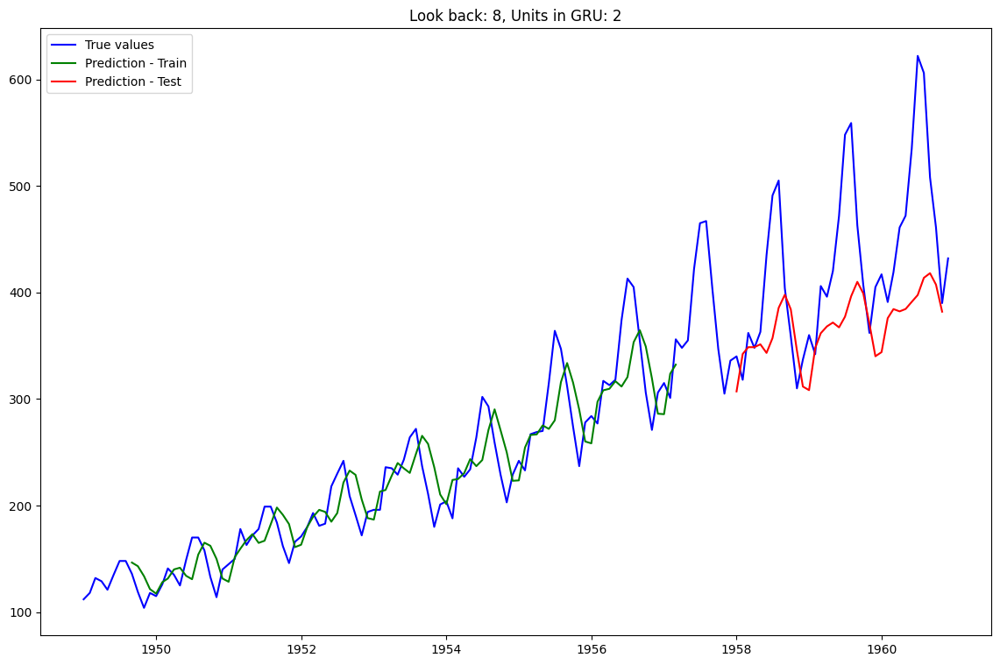

Epoch 1/100
90/90 [==============================] - 2s 3ms/step - loss: 0.0981
Epoch 2/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0300
Epoch 3/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0255
Epoch 4/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0237
Epoch 5/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0225
Epoch 6/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0212
Epoch 7/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0201
Epoch 8/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0192
Epoch 9/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0185
Epoch 10/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0177
Epoch 11/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0171
Epoch 12/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0166
Epoch 13/100
90/90 [=================

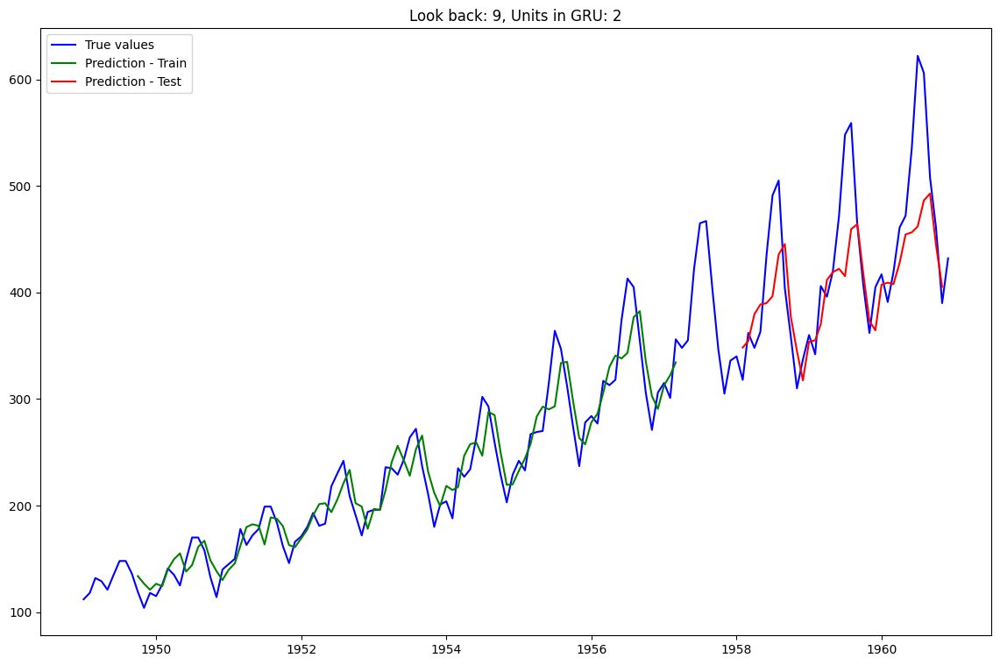

Epoch 1/100
89/89 [==============================] - 3s 4ms/step - loss: 0.0667
Epoch 2/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0219
Epoch 3/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0184
Epoch 4/100
89/89 [==============================] - 0s 5ms/step - loss: 0.0167
Epoch 5/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0153
Epoch 6/100
89/89 [==============================] - 1s 6ms/step - loss: 0.0143
Epoch 7/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0135
Epoch 8/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0127
Epoch 9/100
89/89 [==============================] - 0s 5ms/step - loss: 0.0124
Epoch 10/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0119
Epoch 11/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0119
Epoch 12/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0111
Epoch 13/100
89/89 [=================

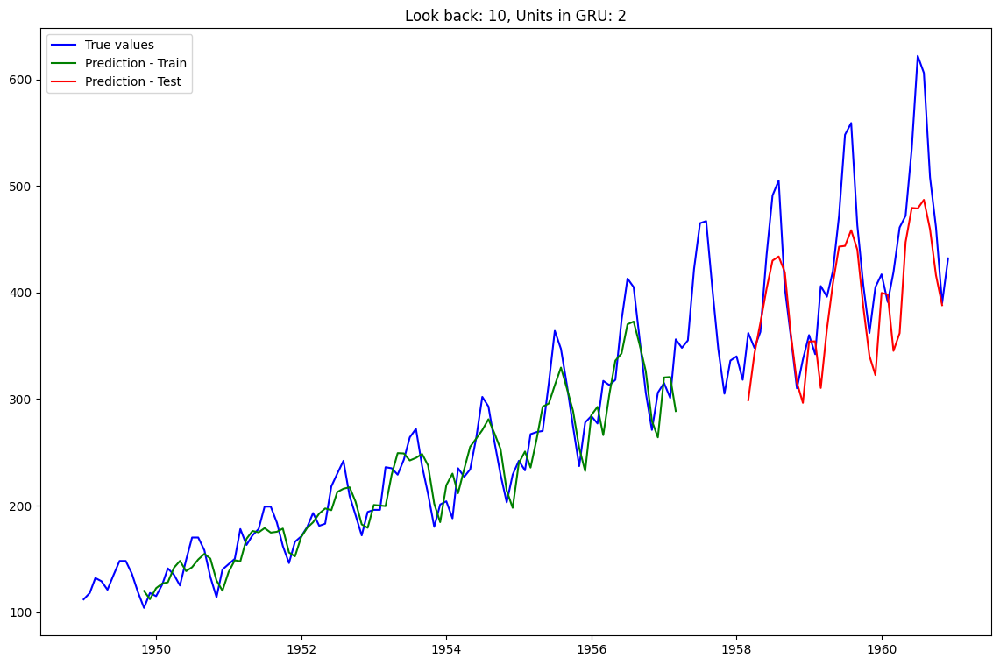

Epoch 1/100
88/88 [==============================] - 2s 4ms/step - loss: 0.1188
Epoch 2/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0537
Epoch 3/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0281
Epoch 4/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0208
Epoch 5/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0169
Epoch 6/100
88/88 [==============================] - 0s 5ms/step - loss: 0.0139
Epoch 7/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0117
Epoch 8/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0101
Epoch 9/100
88/88 [==============================] - 0s 5ms/step - loss: 0.0092
Epoch 10/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0084
Epoch 11/100
88/88 [==============================] - 0s 5ms/step - loss: 0.0080
Epoch 12/100
88/88 [==============================] - 0s 5ms/step - loss: 0.0076
Epoch 13/100
88/88 [=================

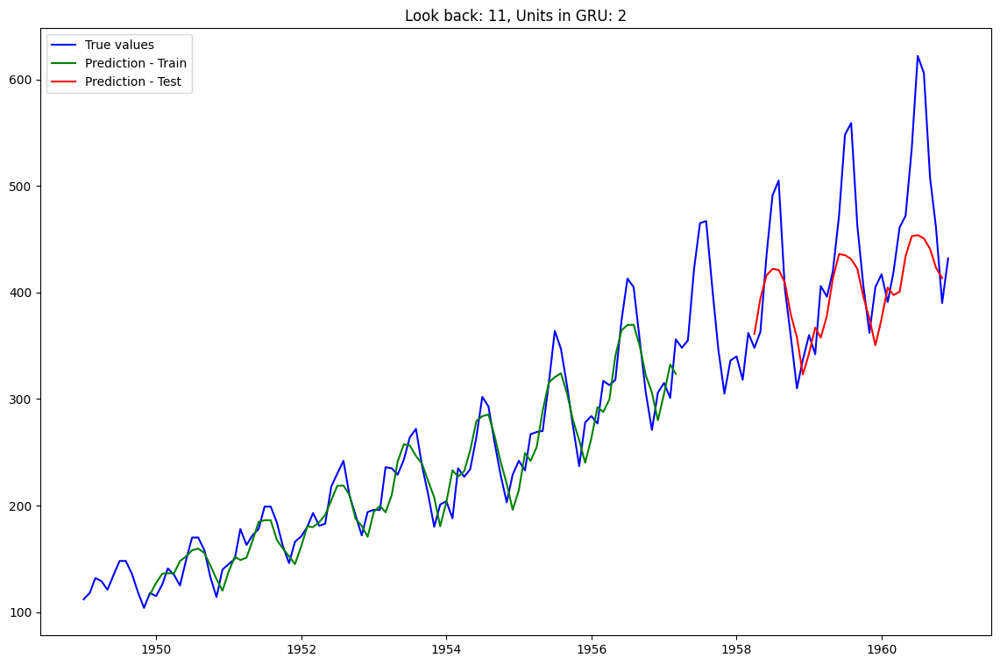

Epoch 1/100
87/87 [==============================] - 2s 3ms/step - loss: 0.0141
Epoch 2/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0127
Epoch 3/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0117
Epoch 4/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0107
Epoch 5/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0100
Epoch 6/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0092
Epoch 7/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0085
Epoch 8/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0075
Epoch 9/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0073
Epoch 10/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 11/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0059
Epoch 12/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0053
Epoch 13/100
87/87 [=================

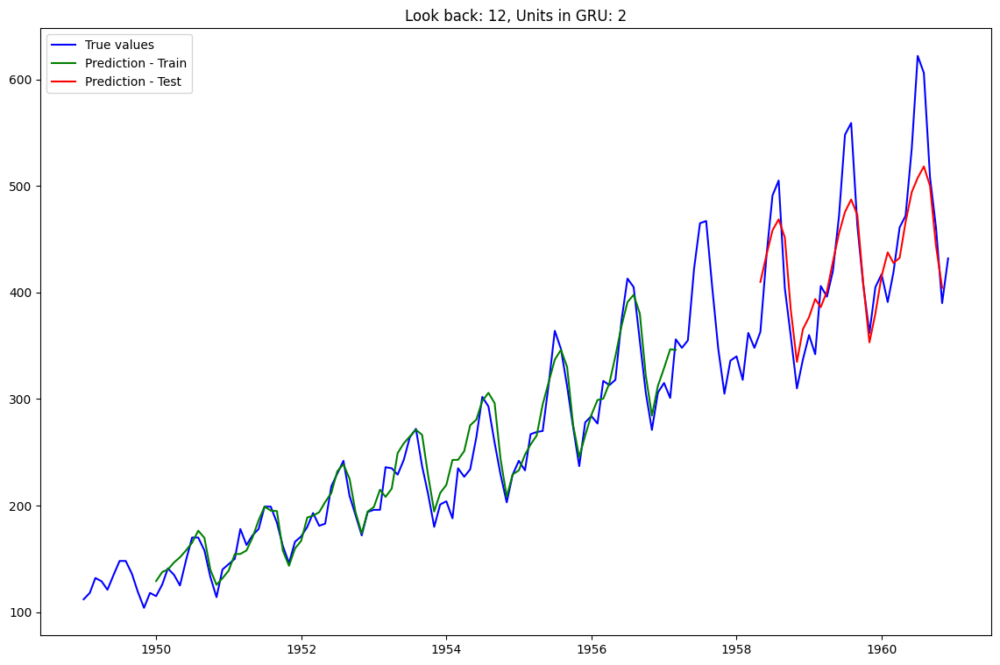

Epoch 1/100
98/98 [==============================] - 3s 4ms/step - loss: 0.4446
Epoch 2/100
98/98 [==============================] - 0s 3ms/step - loss: 0.2366
Epoch 3/100
98/98 [==============================] - 0s 3ms/step - loss: 0.1605
Epoch 4/100
98/98 [==============================] - 0s 3ms/step - loss: 0.1314
Epoch 5/100
98/98 [==============================] - 0s 3ms/step - loss: 0.1182
Epoch 6/100
98/98 [==============================] - 0s 3ms/step - loss: 0.1094
Epoch 7/100
98/98 [==============================] - 0s 4ms/step - loss: 0.1023
Epoch 8/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0963
Epoch 9/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0910
Epoch 10/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0867
Epoch 11/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0825
Epoch 12/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0788
Epoch 13/100
98/98 [=================

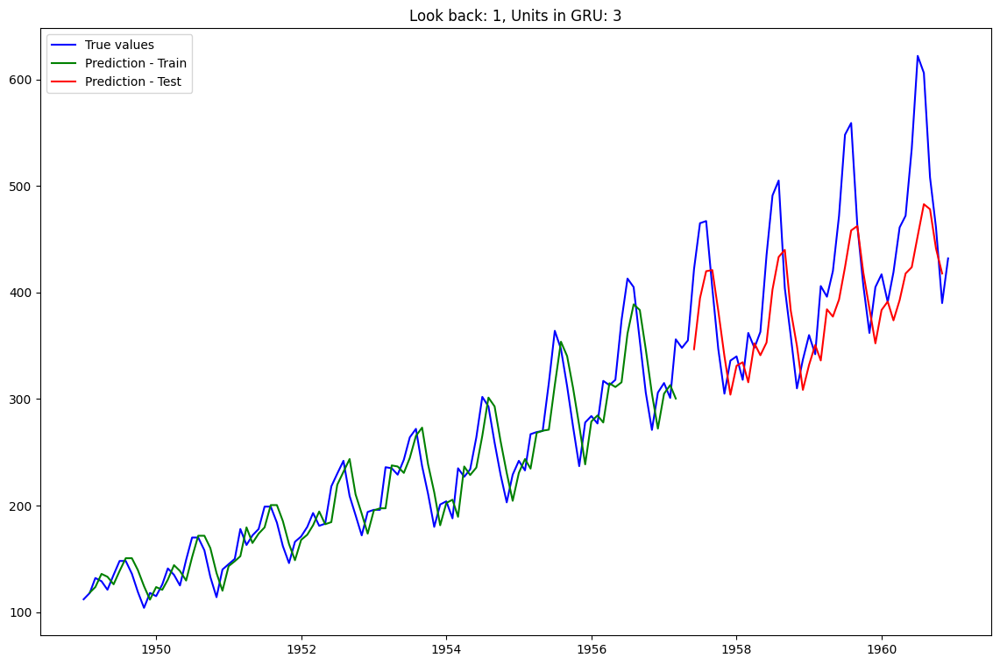

Epoch 1/100
97/97 [==============================] - 3s 3ms/step - loss: 0.0580
Epoch 2/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0204
Epoch 3/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0165
Epoch 4/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0136
Epoch 5/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0113
Epoch 6/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0095
Epoch 7/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 8/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0076
Epoch 9/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0070
Epoch 10/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0069
Epoch 11/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0068
Epoch 12/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0067
Epoch 13/100
97/97 [=================

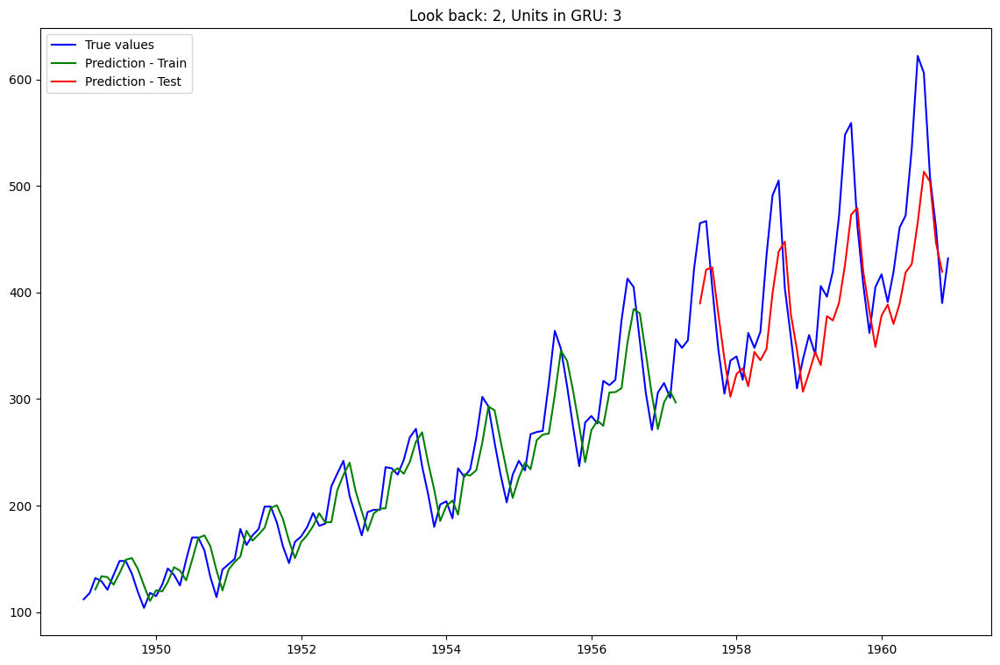

Epoch 1/100
96/96 [==============================] - 3s 4ms/step - loss: 0.1537
Epoch 2/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0513
Epoch 3/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0325
Epoch 4/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0262
Epoch 5/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0214
Epoch 6/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0172
Epoch 7/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0143
Epoch 8/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0117
Epoch 9/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0098
Epoch 10/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 11/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0081
Epoch 12/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0076
Epoch 13/100
96/96 [=================

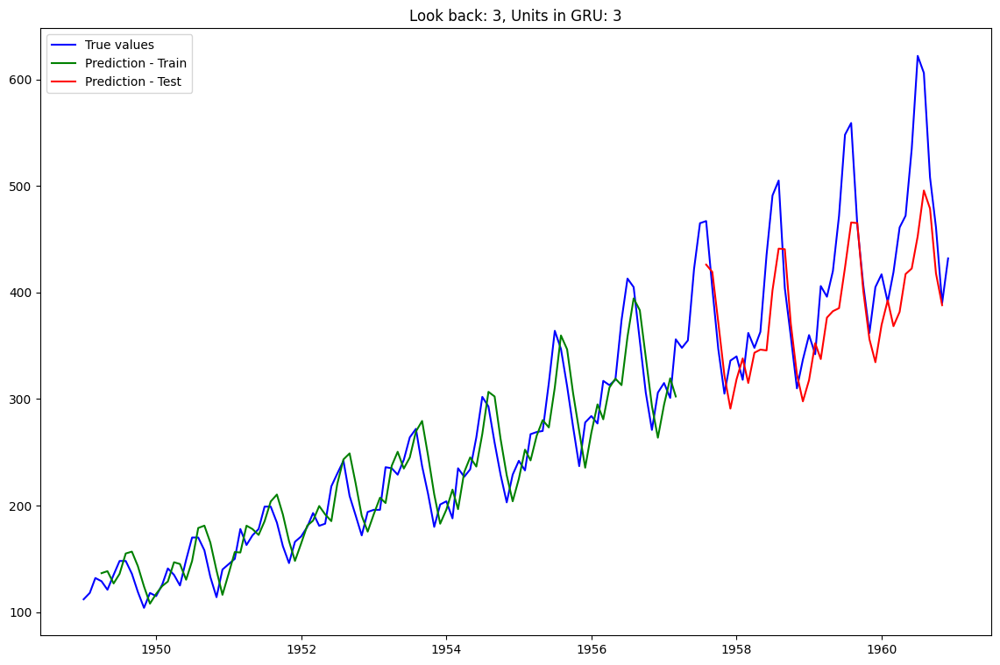

Epoch 1/100
95/95 [==============================] - 3s 3ms/step - loss: 0.1468
Epoch 2/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0566
Epoch 3/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0326
Epoch 4/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0274
Epoch 5/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0248
Epoch 6/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0227
Epoch 7/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0211
Epoch 8/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0192
Epoch 9/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0180
Epoch 10/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0167
Epoch 11/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0157
Epoch 12/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0148
Epoch 13/100
95/95 [=================

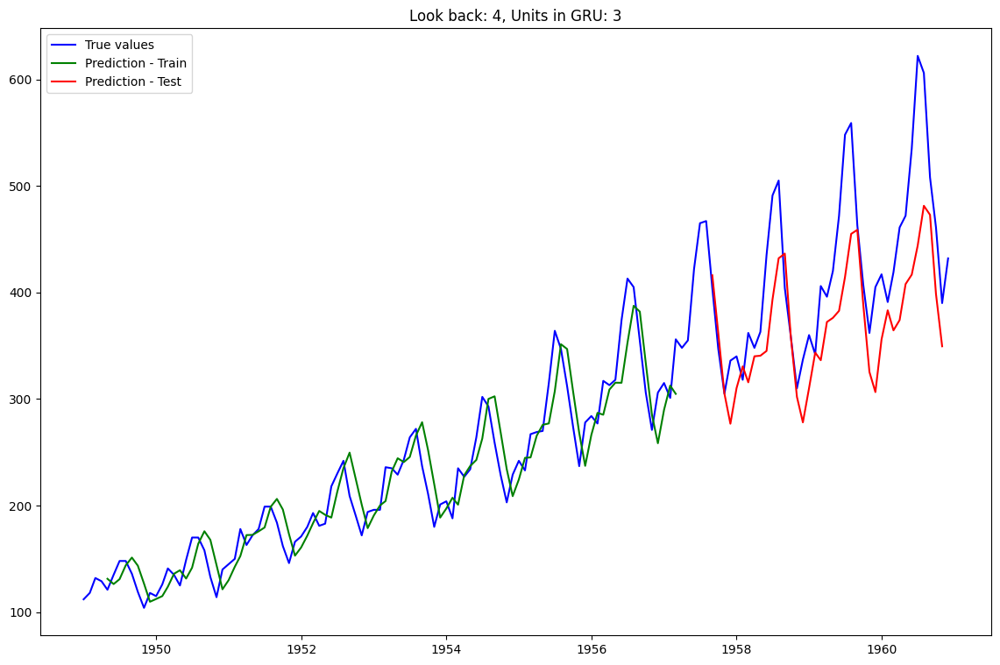

Epoch 1/100
94/94 [==============================] - 2s 3ms/step - loss: 0.1285
Epoch 2/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0573
Epoch 3/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0338
Epoch 4/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0293
Epoch 5/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0271
Epoch 6/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0248
Epoch 7/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0233
Epoch 8/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0217
Epoch 9/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0204
Epoch 10/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0199
Epoch 11/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0187
Epoch 12/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 13/100
94/94 [=================

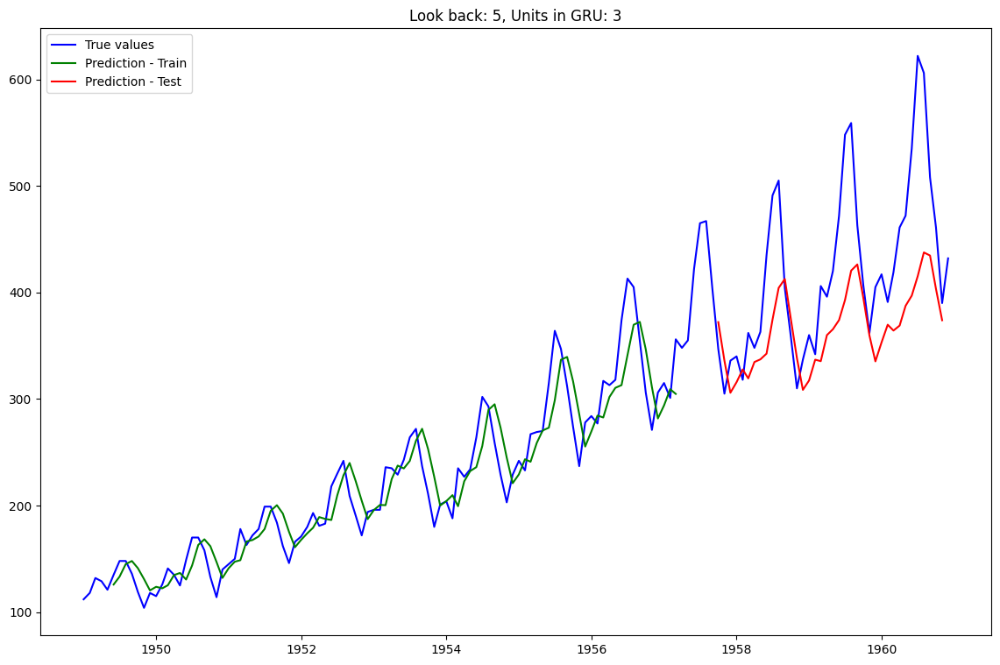

Epoch 1/100
93/93 [==============================] - 3s 3ms/step - loss: 0.2186
Epoch 2/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0882
Epoch 3/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0476
Epoch 4/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0369
Epoch 5/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0311
Epoch 6/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0264
Epoch 7/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0230
Epoch 8/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0202
Epoch 9/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 10/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0169
Epoch 11/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0159
Epoch 12/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0151
Epoch 13/100
93/93 [=================

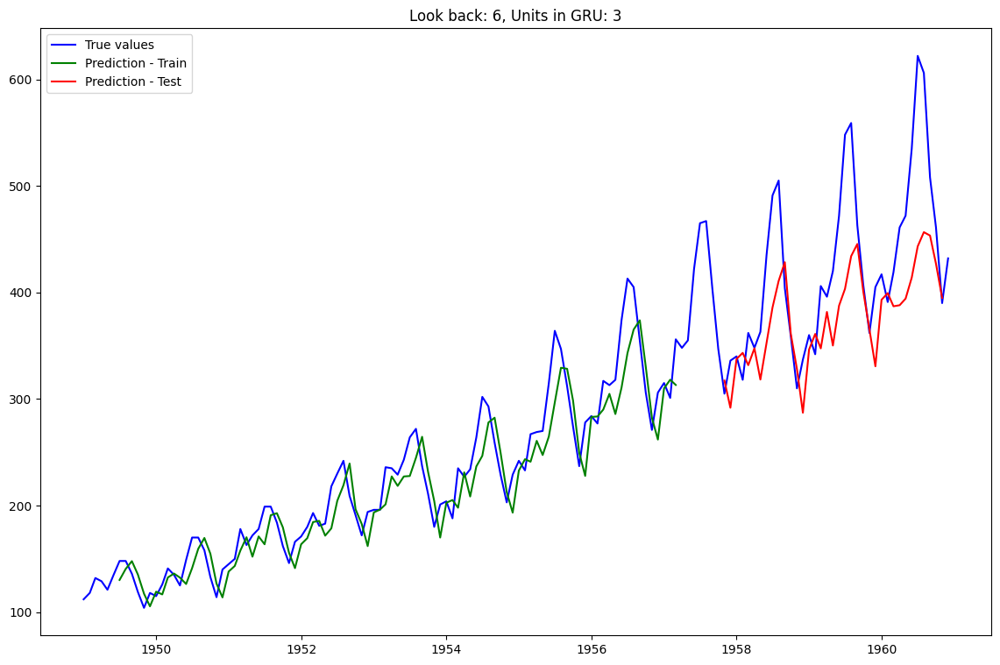

Epoch 1/100
92/92 [==============================] - 3s 4ms/step - loss: 0.0123
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0127
Epoch 3/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0119
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0119
Epoch 5/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0114
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0114
Epoch 7/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0107
Epoch 8/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0107
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0105
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0103
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0102
Epoch 13/100
92/92 [=================

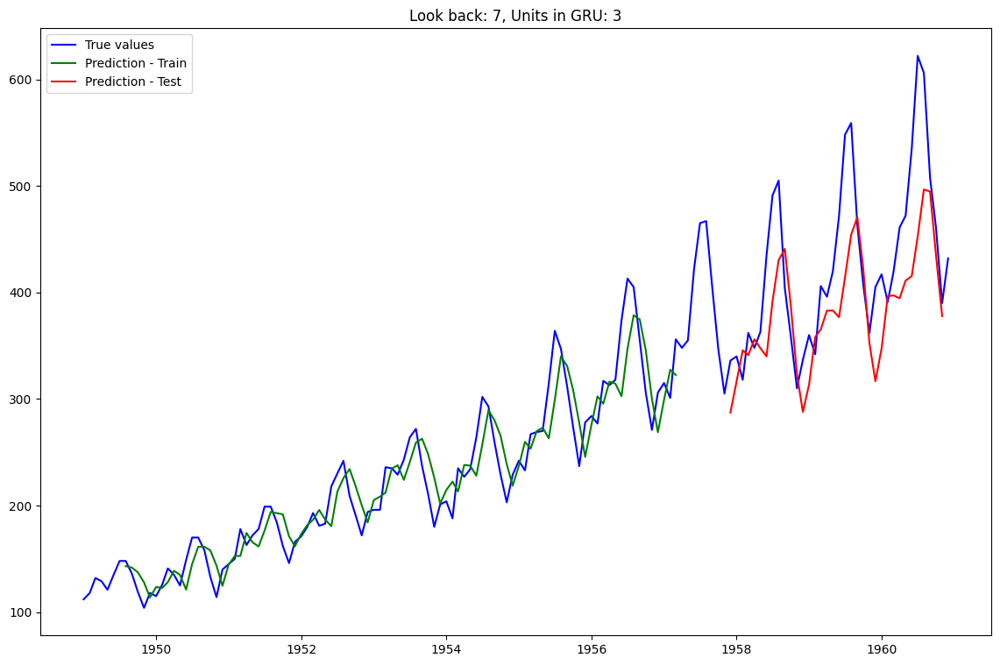

Epoch 1/100
91/91 [==============================] - 3s 4ms/step - loss: 0.1436
Epoch 2/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0334
Epoch 3/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0212
Epoch 4/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 5/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0158
Epoch 6/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0143
Epoch 7/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0131
Epoch 8/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0120
Epoch 9/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0115
Epoch 10/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0110
Epoch 11/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0107
Epoch 12/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 13/100
91/91 [=================

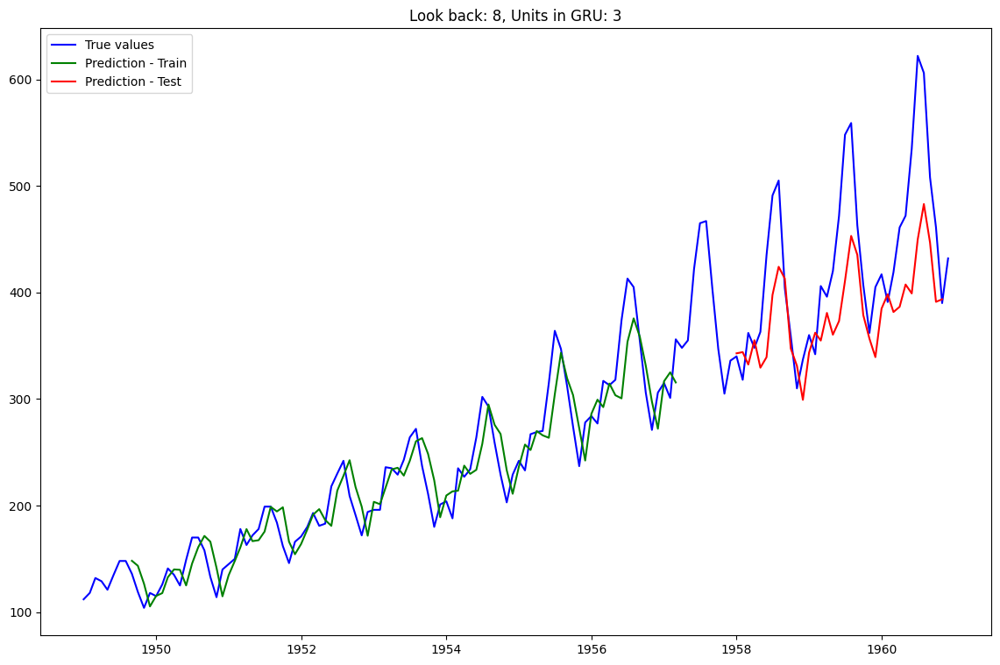

Epoch 1/100
90/90 [==============================] - 3s 3ms/step - loss: 0.0666
Epoch 2/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0266
Epoch 3/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0238
Epoch 4/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0224
Epoch 5/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0210
Epoch 6/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0203
Epoch 7/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0190
Epoch 8/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 9/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0180
Epoch 10/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0171
Epoch 11/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0166
Epoch 12/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0165
Epoch 13/100
90/90 [=================

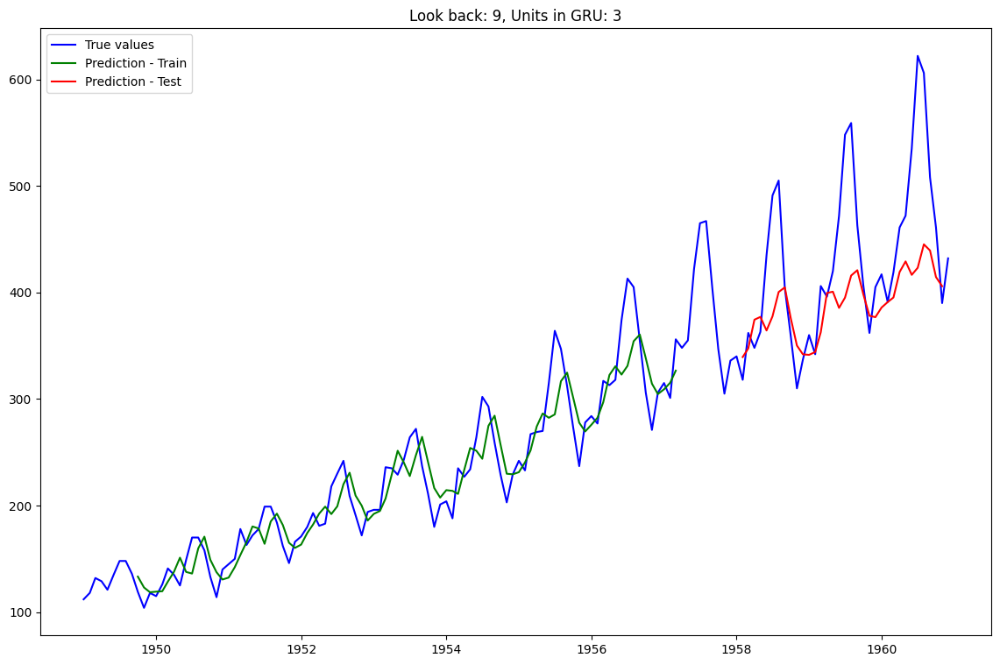

Epoch 1/100
89/89 [==============================] - 3s 4ms/step - loss: 0.0915
Epoch 2/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0166
Epoch 3/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0145
Epoch 4/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0133
Epoch 5/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0118
Epoch 6/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0114
Epoch 7/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0106
Epoch 8/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0099
Epoch 9/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0094
Epoch 10/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0093
Epoch 11/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0088
Epoch 12/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0085
Epoch 13/100
89/89 [=================

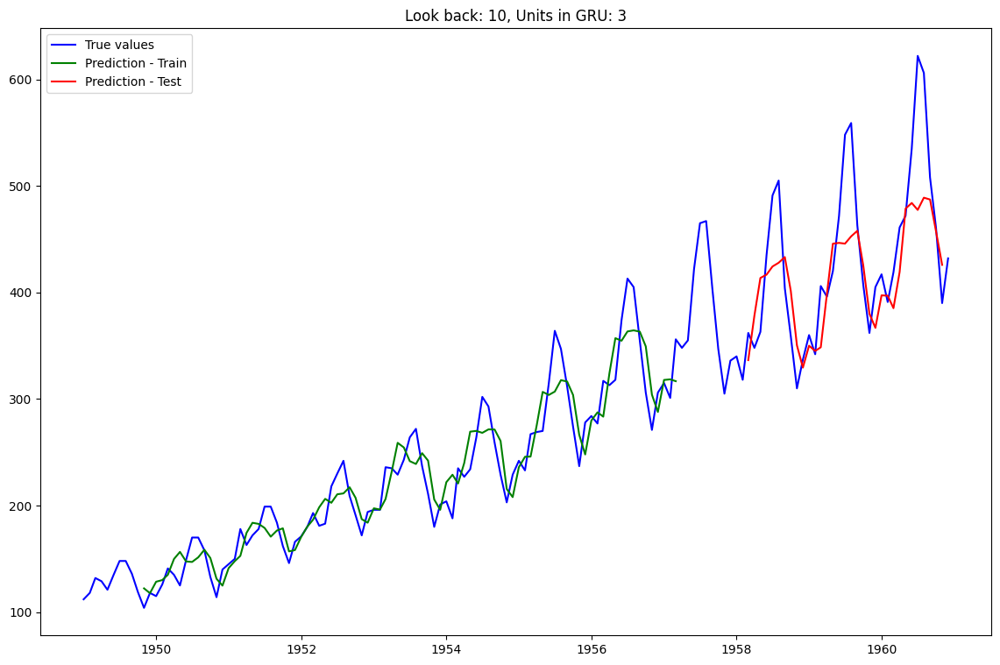

Epoch 1/100
88/88 [==============================] - 3s 3ms/step - loss: 0.0428
Epoch 2/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0091
Epoch 3/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0083
Epoch 4/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0076
Epoch 5/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0074
Epoch 6/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0069
Epoch 7/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0064
Epoch 8/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0063
Epoch 9/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 10/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0057
Epoch 11/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0056
Epoch 12/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0052
Epoch 13/100
88/88 [=================

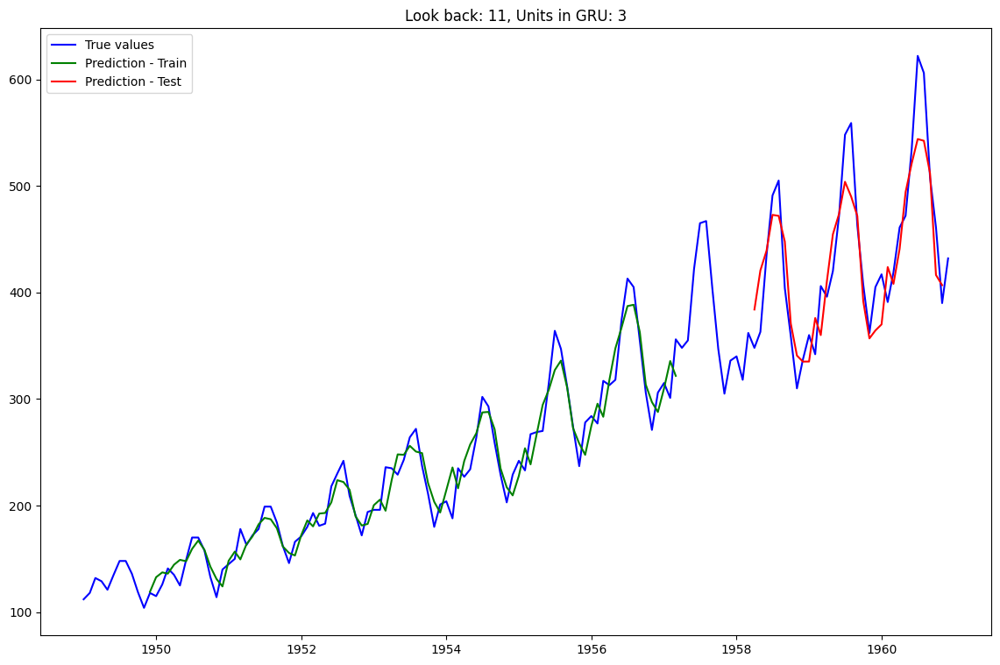

Epoch 1/100
87/87 [==============================] - 3s 4ms/step - loss: 0.0145
Epoch 2/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0135
Epoch 3/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0117
Epoch 4/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 5/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0100
Epoch 6/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0094
Epoch 7/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0085
Epoch 8/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0080
Epoch 9/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0070
Epoch 10/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0067
Epoch 11/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0059
Epoch 12/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 13/100
87/87 [=================

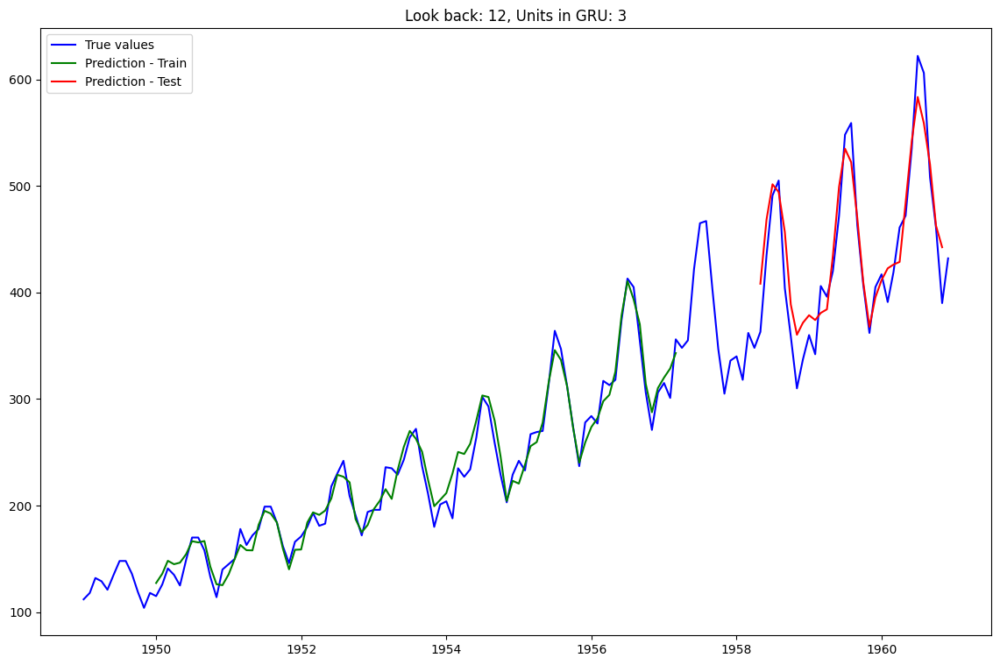

Epoch 1/100
98/98 [==============================] - 3s 3ms/step - loss: 0.1424
Epoch 2/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0626
Epoch 3/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0462
Epoch 4/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0405
Epoch 5/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0361
Epoch 6/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0323
Epoch 7/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0287
Epoch 8/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0250
Epoch 9/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0218
Epoch 10/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 11/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0148
Epoch 12/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0118
Epoch 13/100
98/98 [=================

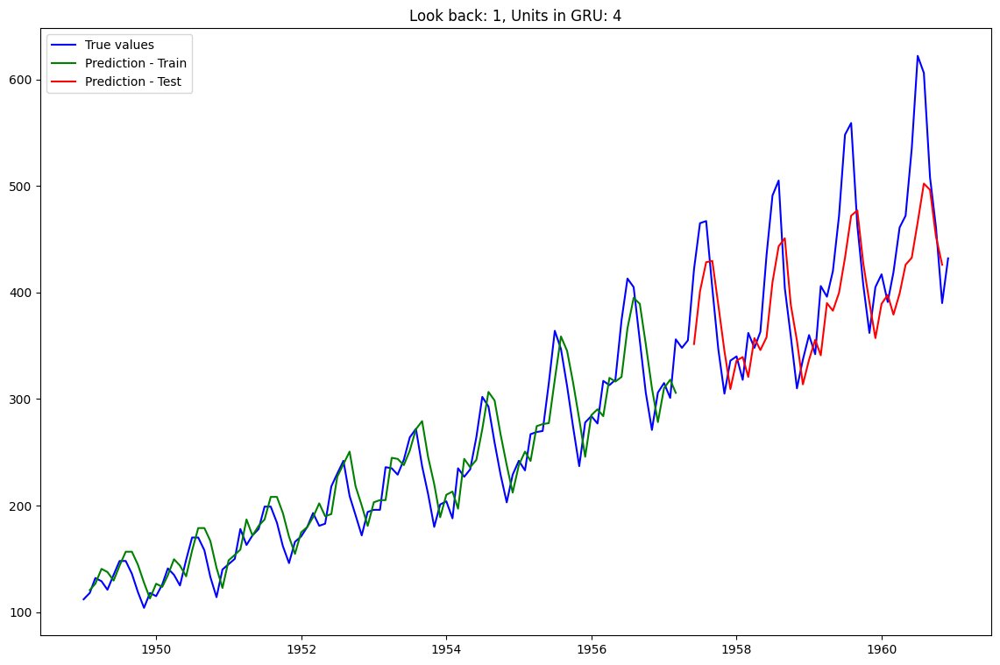

Epoch 1/100
97/97 [==============================] - 3s 3ms/step - loss: 0.0643
Epoch 2/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0249
Epoch 3/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0197
Epoch 4/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0169
Epoch 5/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0144
Epoch 6/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0129
Epoch 7/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 8/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 9/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0102
Epoch 10/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0099
Epoch 11/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0098
Epoch 12/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0097
Epoch 13/100
97/97 [=================

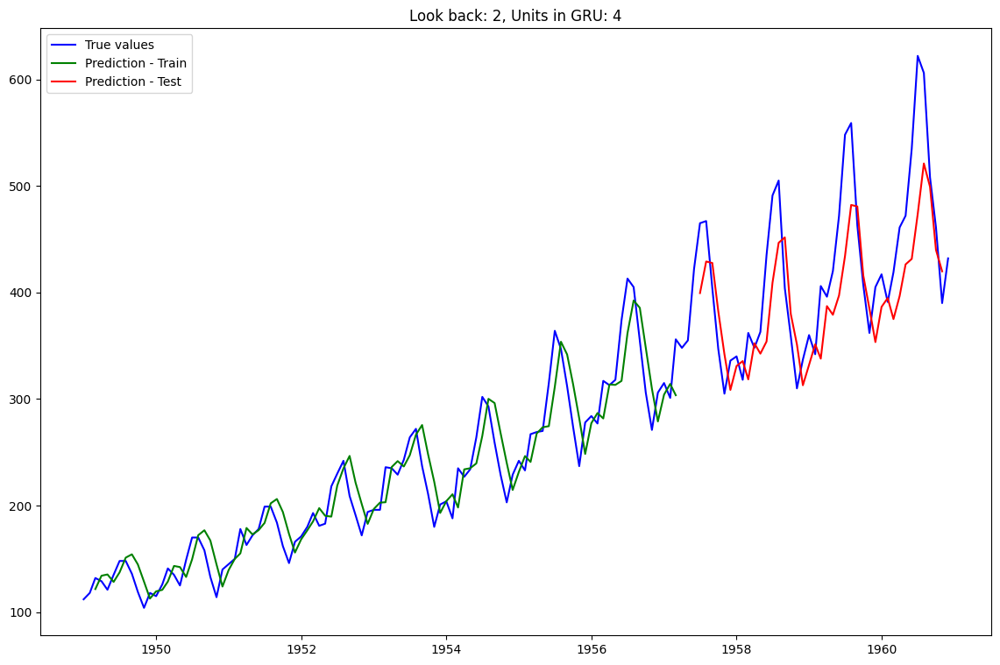

Epoch 1/100
96/96 [==============================] - 3s 3ms/step - loss: 0.0283
Epoch 2/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0128
Epoch 3/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0114
Epoch 4/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0104
Epoch 5/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0096
Epoch 6/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0092
Epoch 7/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0090
Epoch 8/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0085
Epoch 9/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 10/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0083
Epoch 11/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0080
Epoch 12/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0077
Epoch 13/100
96/96 [=================

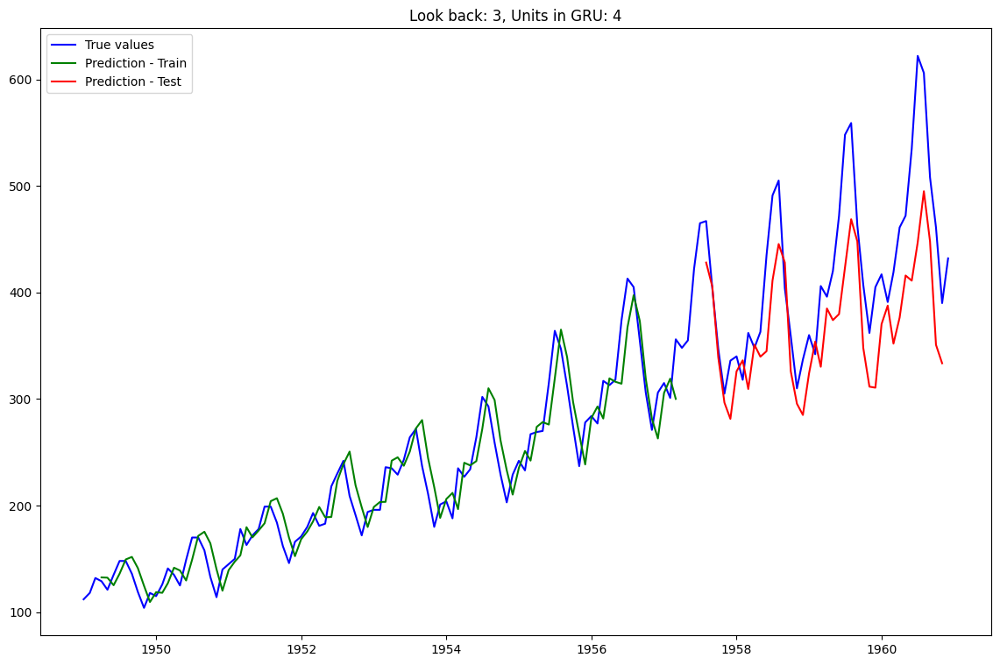

Epoch 1/100
95/95 [==============================] - 5s 4ms/step - loss: 0.1860
Epoch 2/100
95/95 [==============================] - 0s 5ms/step - loss: 0.0549
Epoch 3/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0327
Epoch 4/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0259
Epoch 5/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0207
Epoch 6/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0168
Epoch 7/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0138
Epoch 8/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0118
Epoch 9/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0105
Epoch 10/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0096
Epoch 11/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0090
Epoch 12/100
95/95 [==============================] - 0s 5ms/step - loss: 0.0089
Epoch 13/100
95/95 [=================

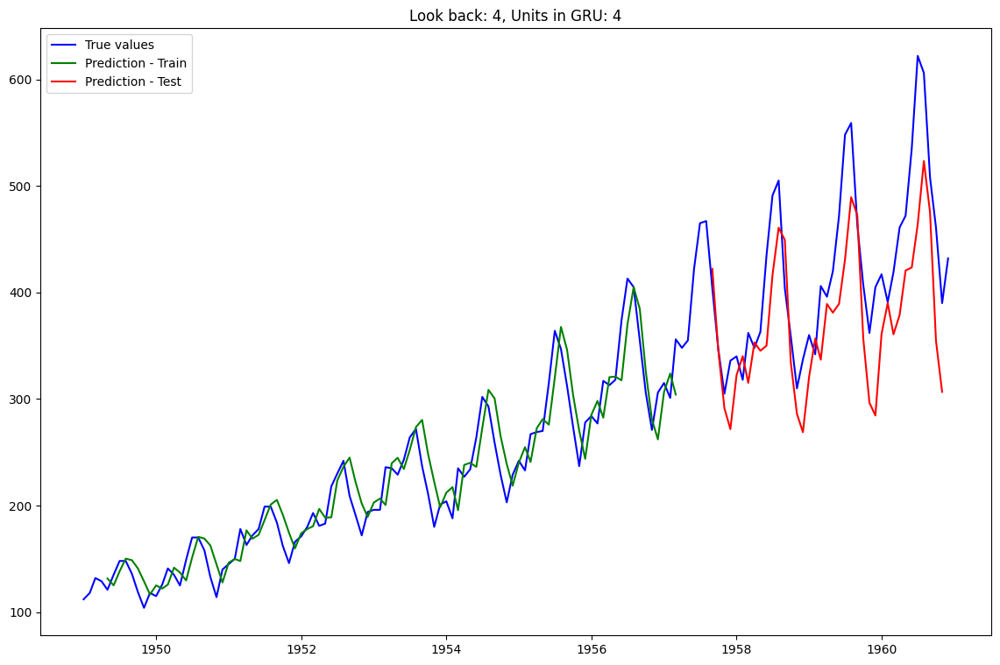

Epoch 1/100
94/94 [==============================] - 3s 4ms/step - loss: 0.2492
Epoch 2/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0664
Epoch 3/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0399
Epoch 4/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0317
Epoch 5/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0255
Epoch 6/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0207
Epoch 7/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0176
Epoch 8/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0148
Epoch 9/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0135
Epoch 10/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0121
Epoch 11/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0111
Epoch 12/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0104
Epoch 13/100
94/94 [=================

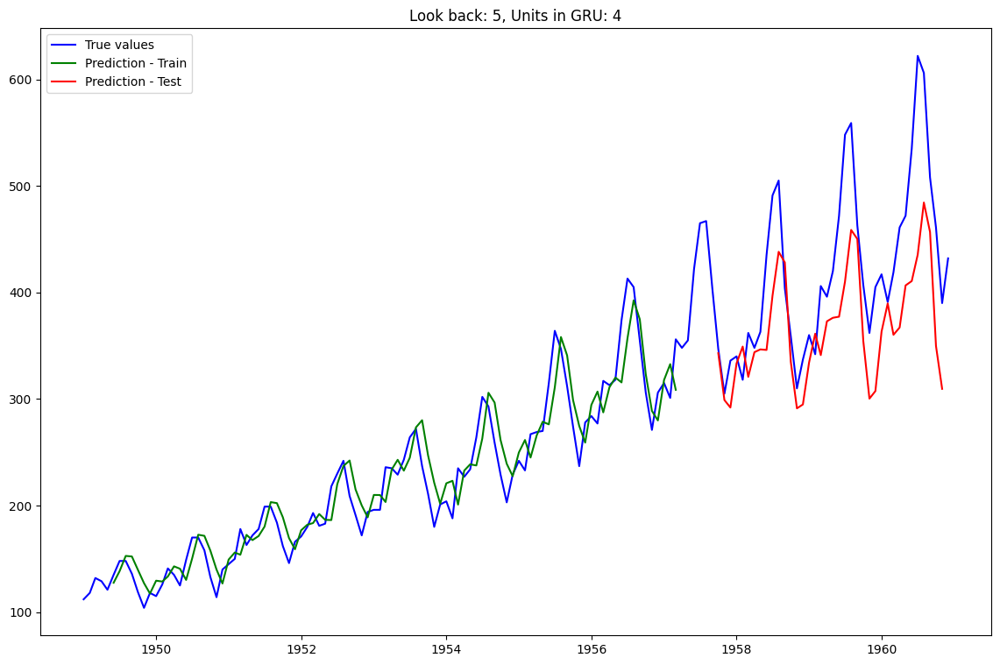

Epoch 1/100
93/93 [==============================] - 3s 3ms/step - loss: 0.0921
Epoch 2/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0251
Epoch 3/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0228
Epoch 4/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0210
Epoch 5/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0202
Epoch 6/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0187
Epoch 7/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0178
Epoch 8/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0171
Epoch 9/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0164
Epoch 10/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0159
Epoch 11/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0157
Epoch 12/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0151
Epoch 13/100
93/93 [=================

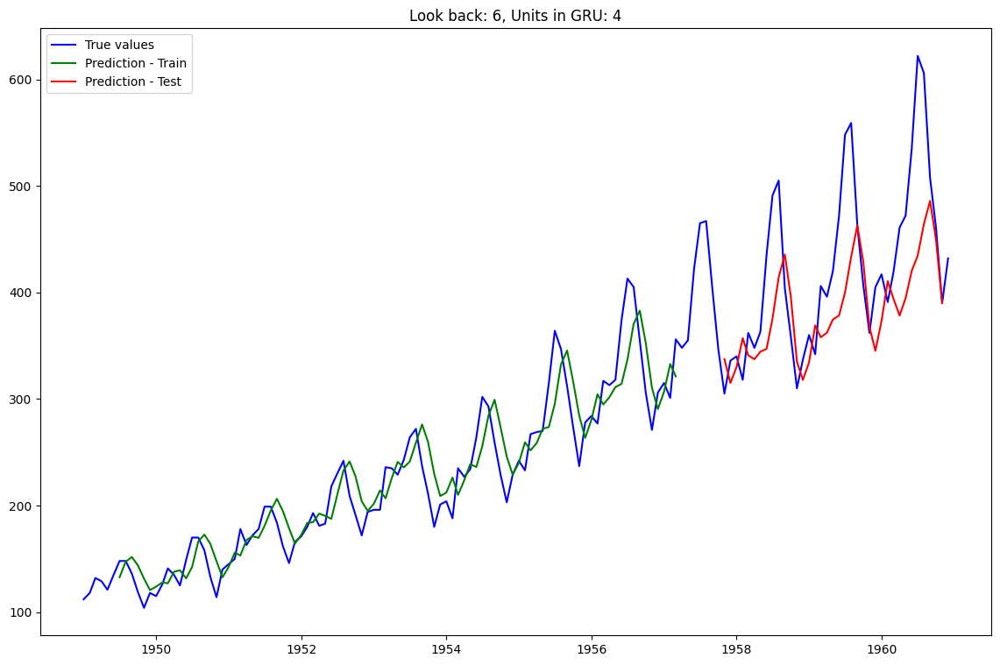

Epoch 1/100
92/92 [==============================] - 3s 4ms/step - loss: 0.2173
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0510
Epoch 3/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0297
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0260
Epoch 5/100
92/92 [==============================] - 0s 5ms/step - loss: 0.0230
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0207
Epoch 7/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0194
Epoch 8/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0175
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0166
Epoch 10/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0158
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0150
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0145
Epoch 13/100
92/92 [=================

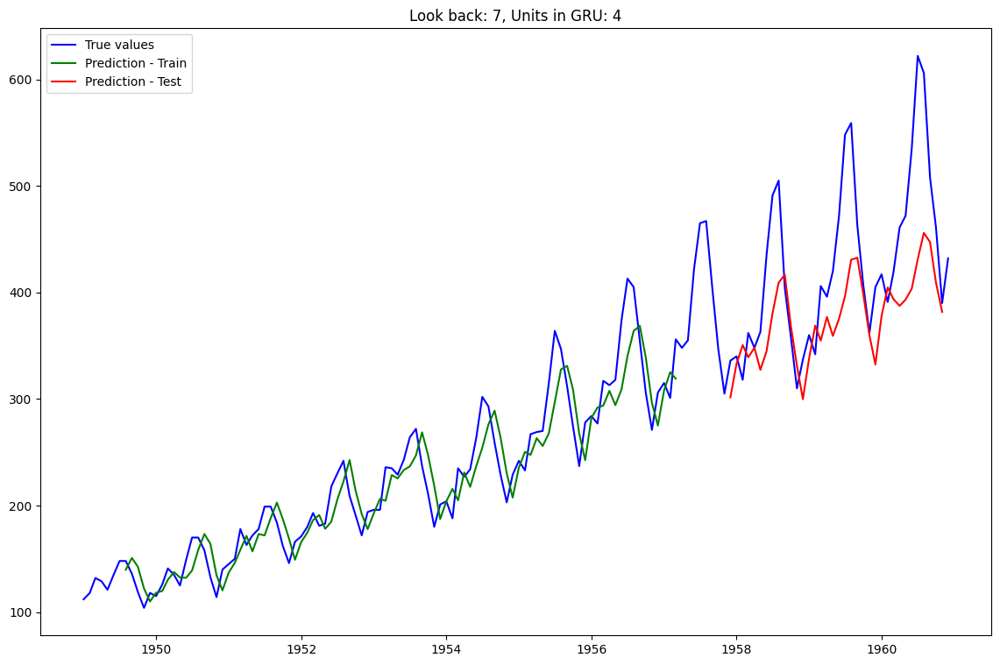

Epoch 1/100
91/91 [==============================] - 3s 3ms/step - loss: 0.1253
Epoch 2/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0407
Epoch 3/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0248
Epoch 4/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0210
Epoch 5/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0187
Epoch 6/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0165
Epoch 7/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0152
Epoch 8/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0138
Epoch 9/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0133
Epoch 10/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0127
Epoch 11/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0124
Epoch 12/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0121
Epoch 13/100
91/91 [=================

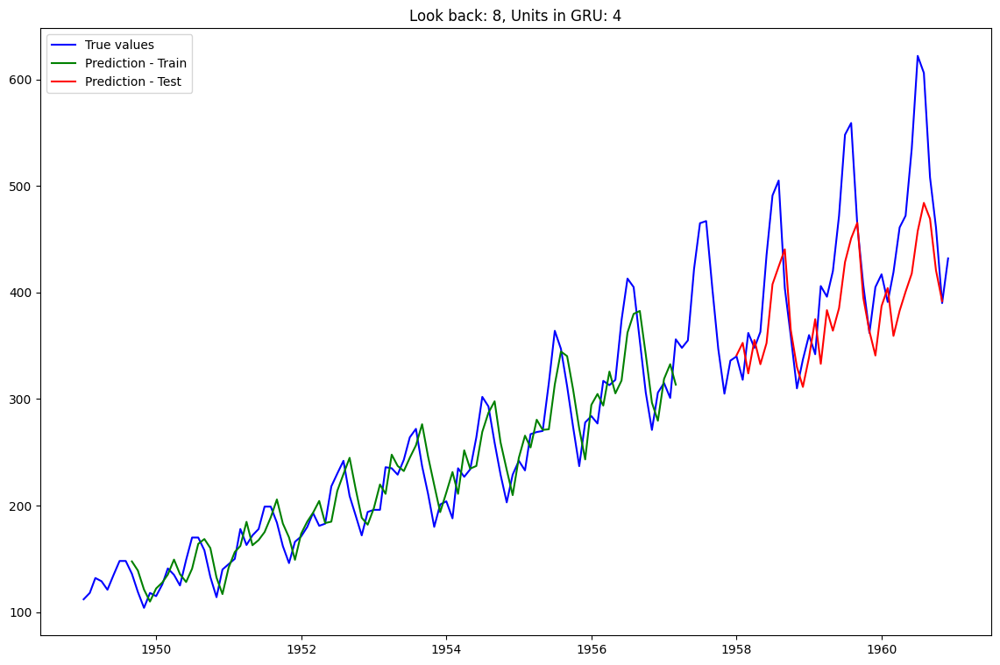

Epoch 1/100
90/90 [==============================] - 3s 3ms/step - loss: 0.1706
Epoch 2/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0498
Epoch 3/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0309
Epoch 4/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0247
Epoch 5/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0200
Epoch 6/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0172
Epoch 7/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0153
Epoch 8/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0141
Epoch 9/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0131
Epoch 10/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0124
Epoch 11/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 12/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0113
Epoch 13/100
90/90 [=================

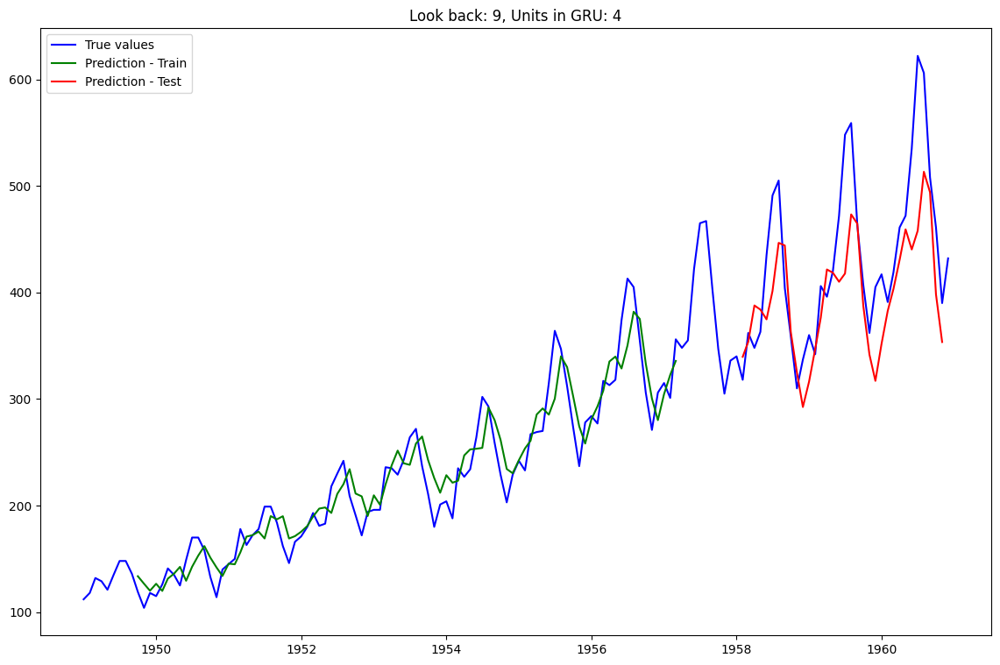

Epoch 1/100
89/89 [==============================] - 3s 3ms/step - loss: 0.0082
Epoch 2/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0073
Epoch 3/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0071
Epoch 4/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 5/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0066
Epoch 6/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 7/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0061
Epoch 8/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0059
Epoch 9/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 10/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0055
Epoch 11/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0053
Epoch 12/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0056
Epoch 13/100
89/89 [=================

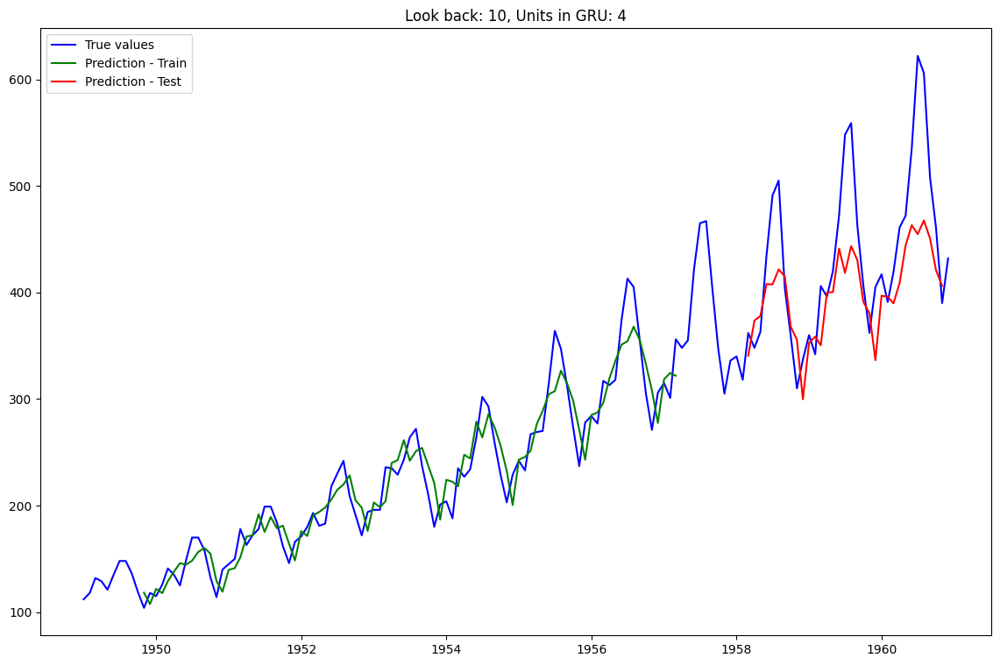

Epoch 1/100
88/88 [==============================] - 3s 3ms/step - loss: 0.0390
Epoch 2/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0241
Epoch 3/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0226
Epoch 4/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0198
Epoch 5/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0187
Epoch 6/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0174
Epoch 7/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0162
Epoch 8/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0152
Epoch 9/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0145
Epoch 10/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0141
Epoch 11/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0124
Epoch 12/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0123
Epoch 13/100
88/88 [=================

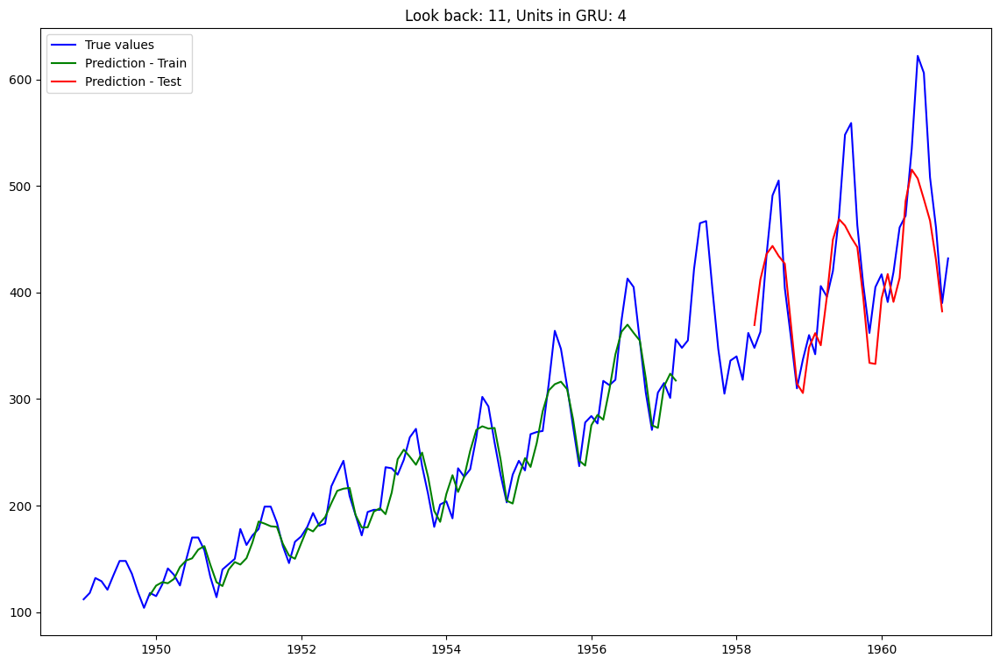

Epoch 1/100
87/87 [==============================] - 3s 3ms/step - loss: 0.2817
Epoch 2/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0372
Epoch 3/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0200
Epoch 4/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0165
Epoch 5/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0138
Epoch 6/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0114
Epoch 7/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0098
Epoch 8/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0083
Epoch 9/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0073
Epoch 10/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0066
Epoch 11/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 12/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0055
Epoch 13/100
87/87 [=================

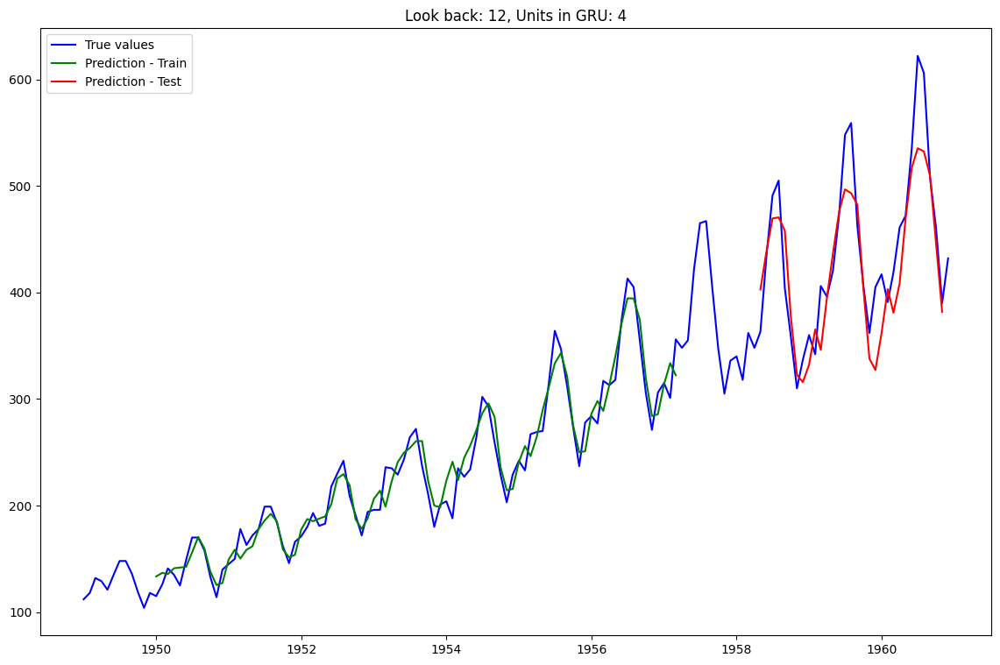

Epoch 1/100
98/98 [==============================] - 3s 3ms/step - loss: 0.1194
Epoch 2/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0511
Epoch 3/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0371
Epoch 4/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0326
Epoch 5/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0287
Epoch 6/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0249
Epoch 7/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0213
Epoch 8/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0180
Epoch 9/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0144
Epoch 10/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0117
Epoch 11/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0095
Epoch 12/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0081
Epoch 13/100
98/98 [=================

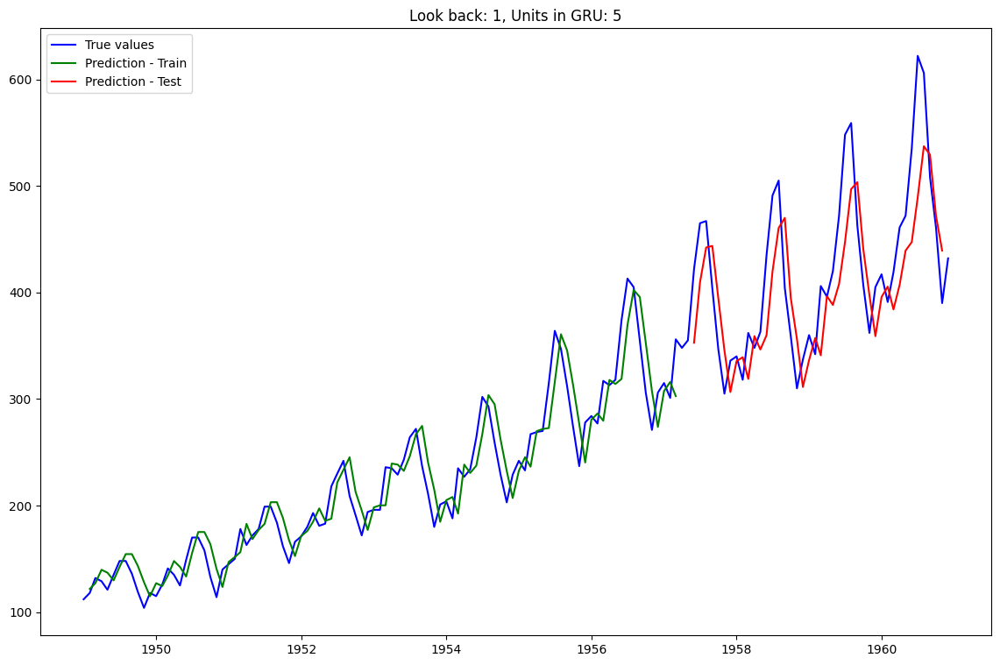

Epoch 1/100
97/97 [==============================] - 3s 3ms/step - loss: 0.0386
Epoch 2/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0147
Epoch 3/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0112
Epoch 4/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 5/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0074
Epoch 6/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0070
Epoch 7/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 8/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 9/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0059
Epoch 10/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0059
Epoch 11/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0061
Epoch 12/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0056
Epoch 13/100
97/97 [=================

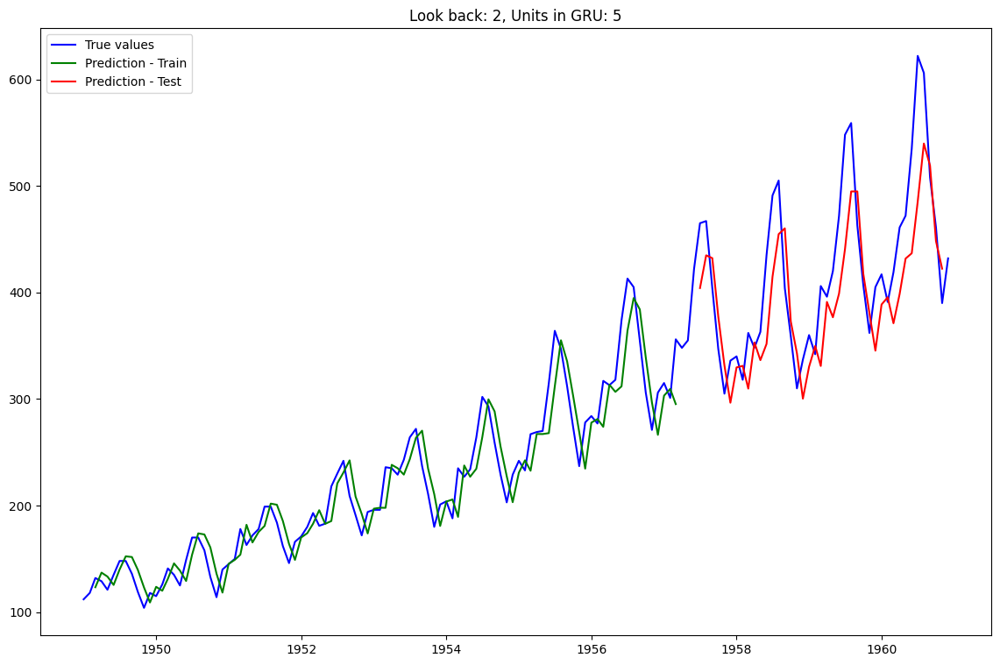

Epoch 1/100
96/96 [==============================] - 3s 3ms/step - loss: 0.3557
Epoch 2/100
96/96 [==============================] - 0s 4ms/step - loss: 0.1304
Epoch 3/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0725
Epoch 4/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0576
Epoch 5/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0483
Epoch 6/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0404
Epoch 7/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0334
Epoch 8/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0279
Epoch 9/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0230
Epoch 10/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0188
Epoch 11/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0158
Epoch 12/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0132
Epoch 13/100
96/96 [=================

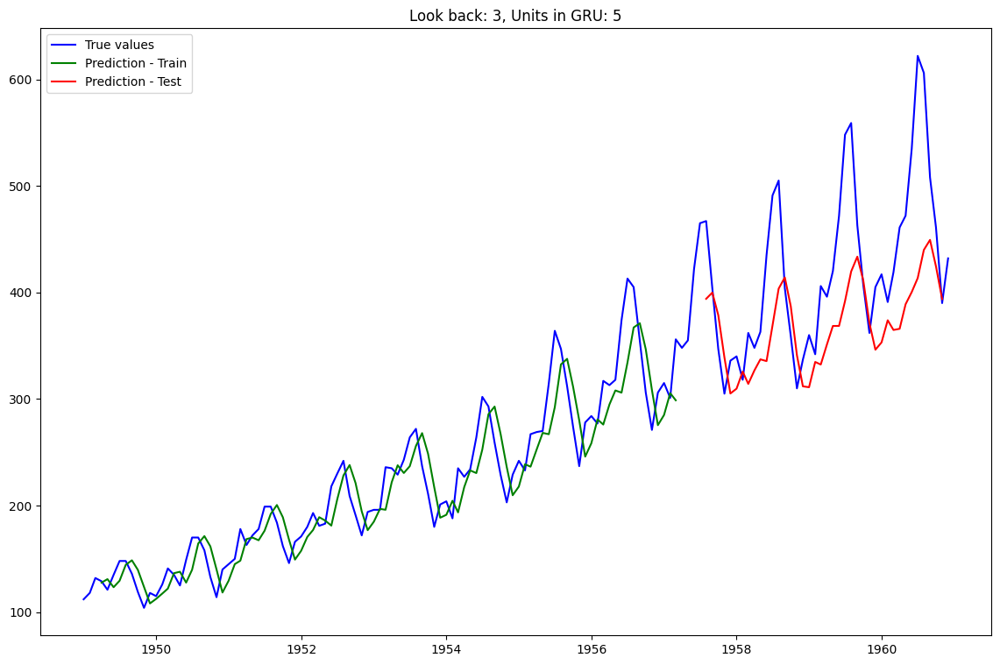

Epoch 1/100
95/95 [==============================] - 3s 3ms/step - loss: 0.1367
Epoch 2/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0397
Epoch 3/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0332
Epoch 4/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0295
Epoch 5/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0260
Epoch 6/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0238
Epoch 7/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0217
Epoch 8/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0199
Epoch 9/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 10/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0173
Epoch 11/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0161
Epoch 12/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0152
Epoch 13/100
95/95 [=================

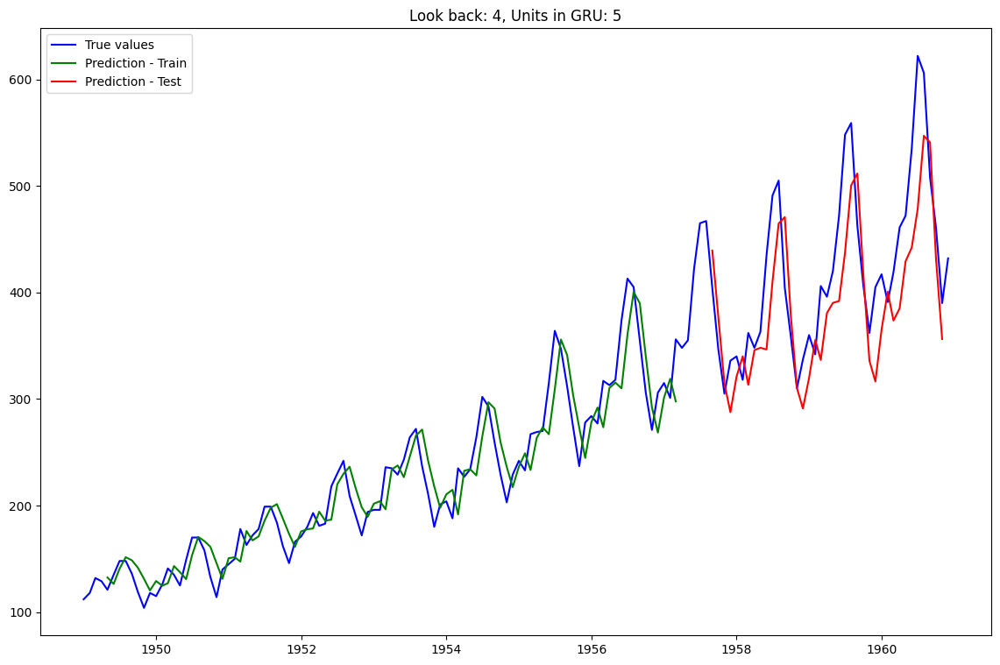

Epoch 1/100
94/94 [==============================] - 5s 4ms/step - loss: 0.0266
Epoch 2/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0129
Epoch 3/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0111
Epoch 4/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 5/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0096
Epoch 6/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0095
Epoch 7/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0082
Epoch 8/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0084
Epoch 9/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0079
Epoch 10/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0079
Epoch 11/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0076
Epoch 12/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0074
Epoch 13/100
94/94 [=================

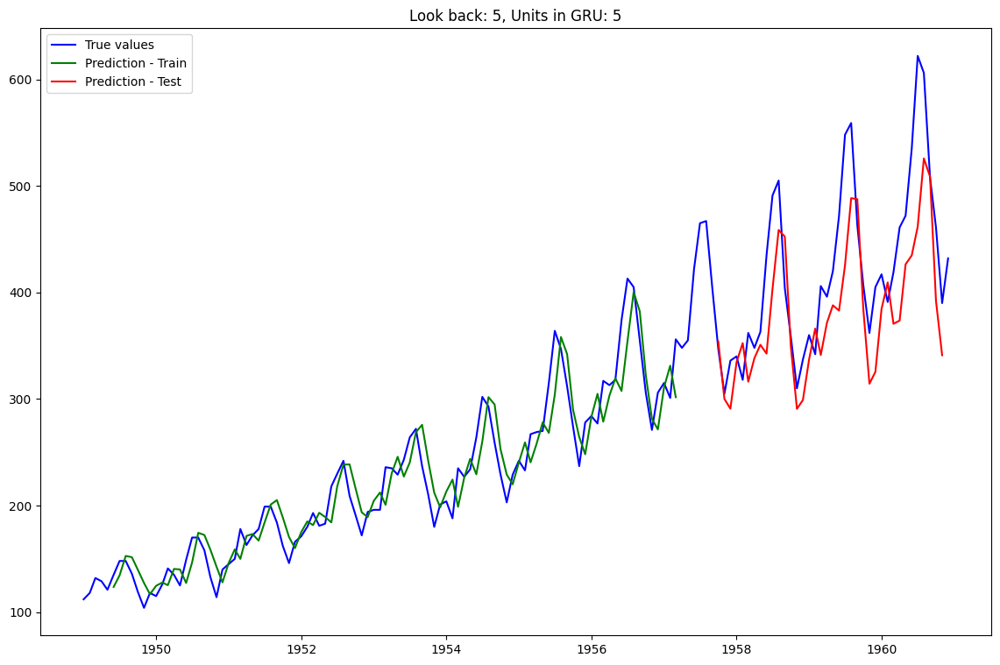

Epoch 1/100
93/93 [==============================] - 3s 4ms/step - loss: 0.0463
Epoch 2/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 3/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0157
Epoch 4/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0147
Epoch 5/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0136
Epoch 6/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0135
Epoch 7/100
93/93 [==============================] - 0s 5ms/step - loss: 0.0127
Epoch 8/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0130
Epoch 9/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0123
Epoch 10/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 11/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0120
Epoch 12/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0119
Epoch 13/100
93/93 [=================

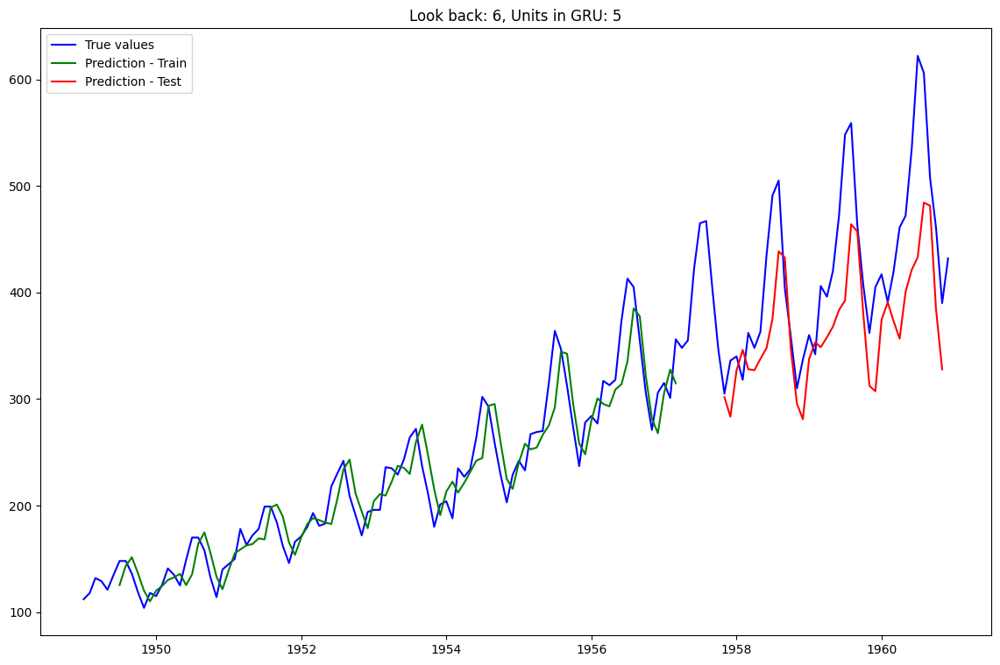

Epoch 1/100
92/92 [==============================] - 3s 4ms/step - loss: 0.0521
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0161
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0140
Epoch 4/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0133
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0127
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0122
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0116
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0109
Epoch 10/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0108
Epoch 13/100
92/92 [=================

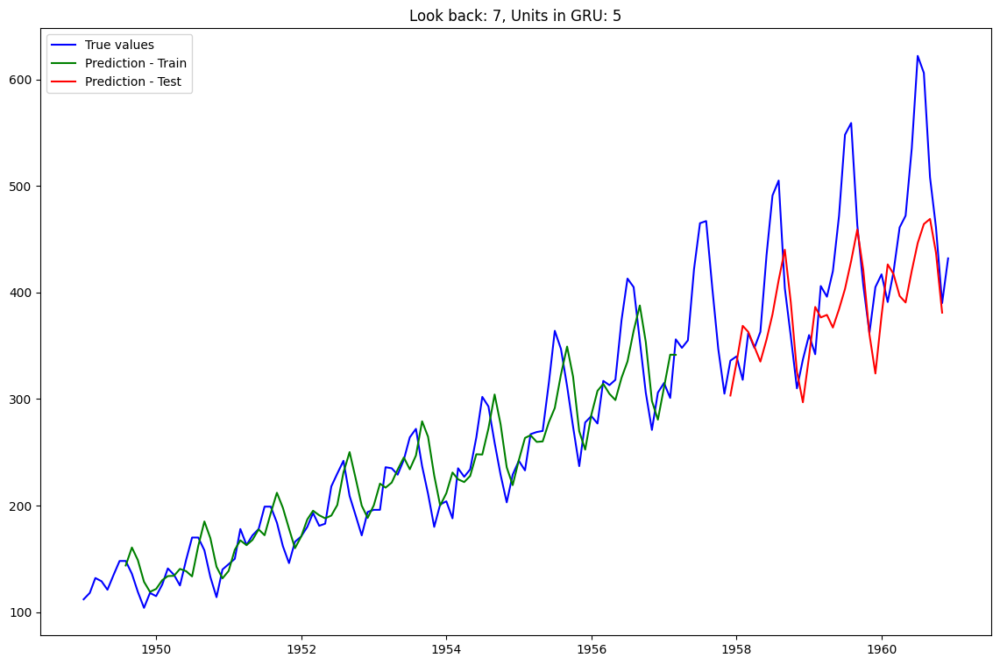

Epoch 1/100
91/91 [==============================] - 3s 3ms/step - loss: 0.0853
Epoch 2/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0199
Epoch 3/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0178
Epoch 4/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0159
Epoch 5/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0152
Epoch 6/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0136
Epoch 7/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0135
Epoch 8/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0121
Epoch 9/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0116
Epoch 10/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0105
Epoch 11/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0109
Epoch 12/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0099
Epoch 13/100
91/91 [=================

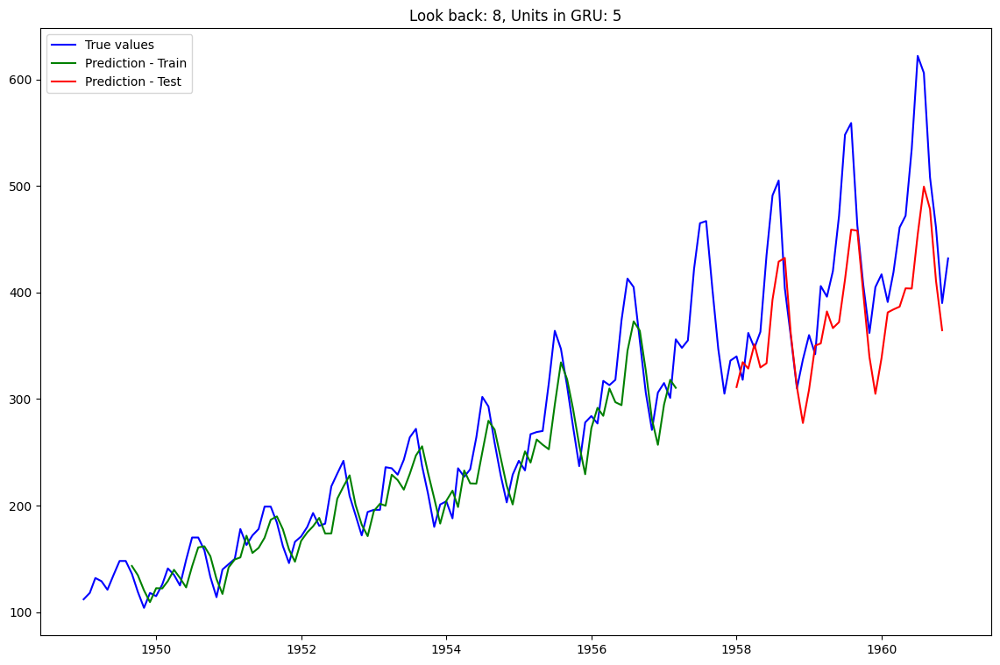

Epoch 1/100
90/90 [==============================] - 3s 4ms/step - loss: 0.0182
Epoch 2/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0146
Epoch 3/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0119
Epoch 4/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0115
Epoch 5/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0110
Epoch 6/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0102
Epoch 7/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0101
Epoch 8/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0096
Epoch 9/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0092
Epoch 10/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0089
Epoch 11/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0085
Epoch 12/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0087
Epoch 13/100
90/90 [=================

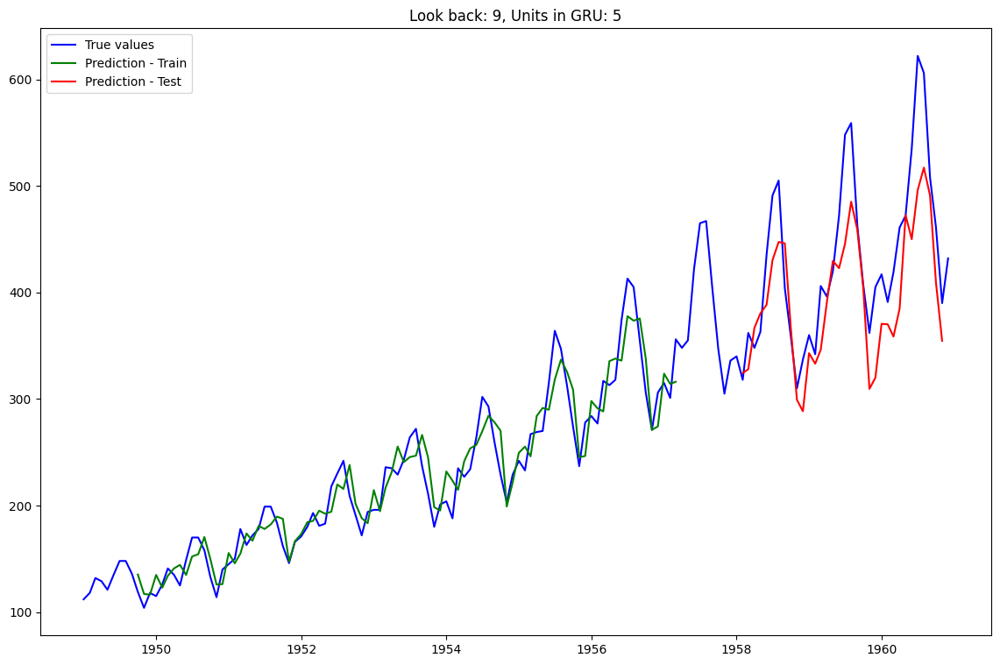

Epoch 1/100
89/89 [==============================] - 3s 4ms/step - loss: 0.1306
Epoch 2/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0299
Epoch 3/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0229
Epoch 4/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0186
Epoch 5/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0160
Epoch 6/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0147
Epoch 7/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0134
Epoch 8/100
89/89 [==============================] - 0s 5ms/step - loss: 0.0127
Epoch 9/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0123
Epoch 10/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0118
Epoch 11/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 12/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0114
Epoch 13/100
89/89 [=================

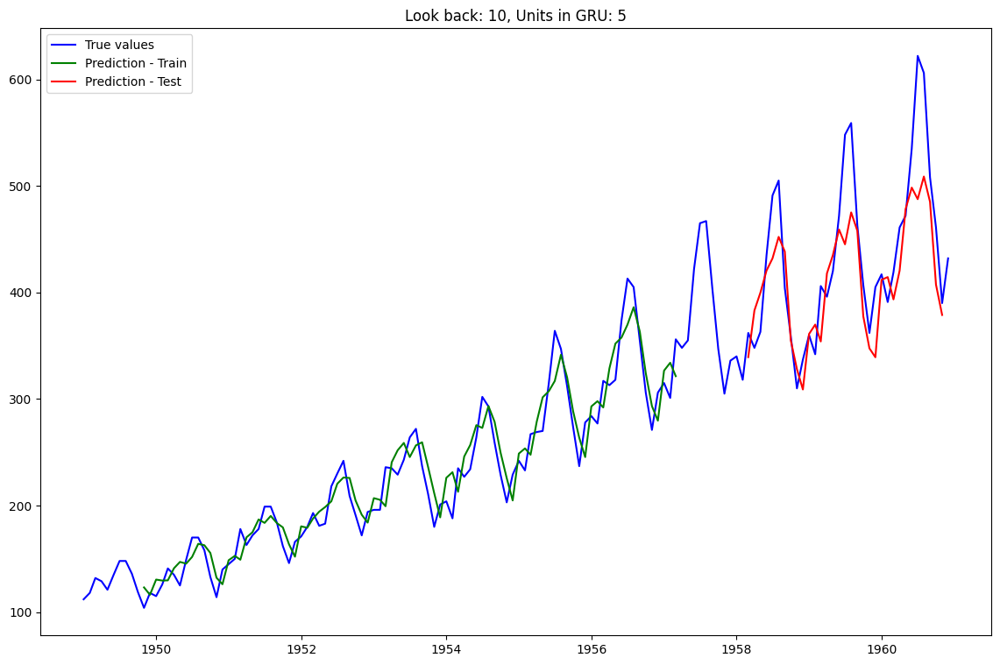

Epoch 1/100
88/88 [==============================] - 3s 4ms/step - loss: 0.1881
Epoch 2/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0306
Epoch 3/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0211
Epoch 4/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0184
Epoch 5/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0166
Epoch 6/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0147
Epoch 7/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0135
Epoch 8/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0123
Epoch 9/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0116
Epoch 10/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0110
Epoch 11/100
88/88 [==============================] - 0s 5ms/step - loss: 0.0104
Epoch 12/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0100
Epoch 13/100
88/88 [=================

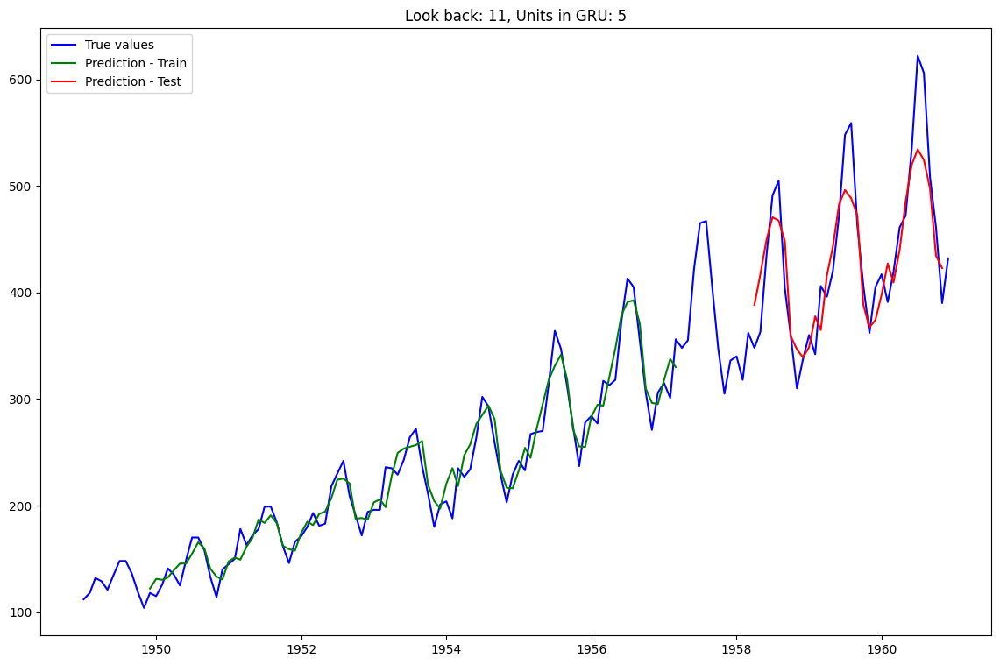

Epoch 1/100
87/87 [==============================] - 3s 3ms/step - loss: 0.0772
Epoch 2/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0194
Epoch 3/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0146
Epoch 4/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0114
Epoch 5/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0096
Epoch 6/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 7/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0086
Epoch 8/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0067
Epoch 9/100
87/87 [==============================] - 0s 5ms/step - loss: 0.0065
Epoch 10/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0065
Epoch 11/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0060
Epoch 12/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0051
Epoch 13/100
87/87 [=================

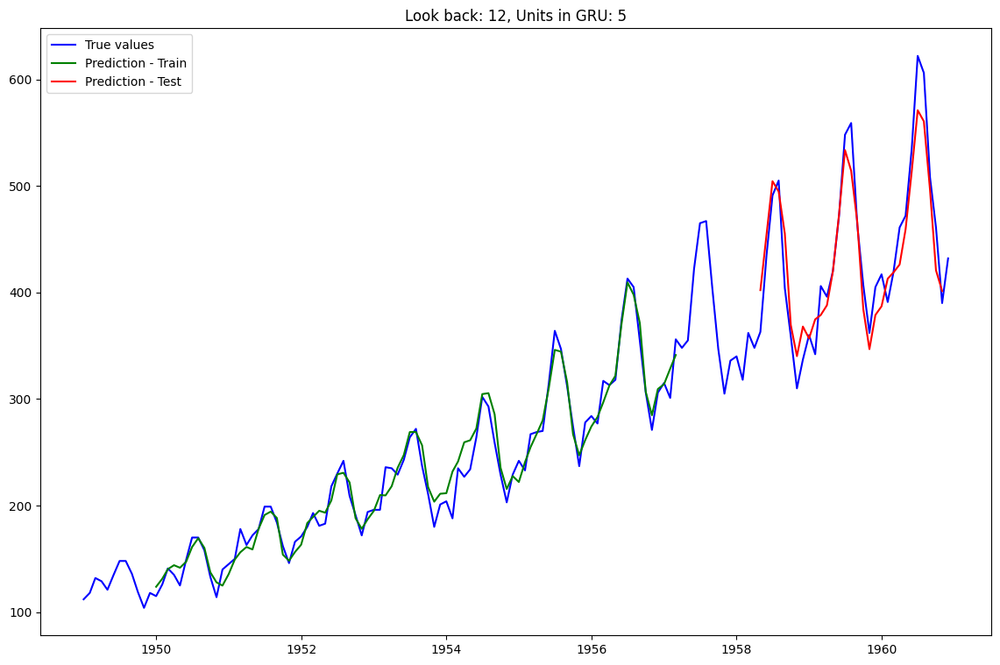

Epoch 1/100
98/98 [==============================] - 3s 4ms/step - loss: 0.0616
Epoch 2/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0249
Epoch 3/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0204
Epoch 4/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0170
Epoch 5/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0141
Epoch 6/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0118
Epoch 7/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0099
Epoch 8/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 9/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0075
Epoch 10/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0066
Epoch 11/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 12/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0062
Epoch 13/100
98/98 [=================

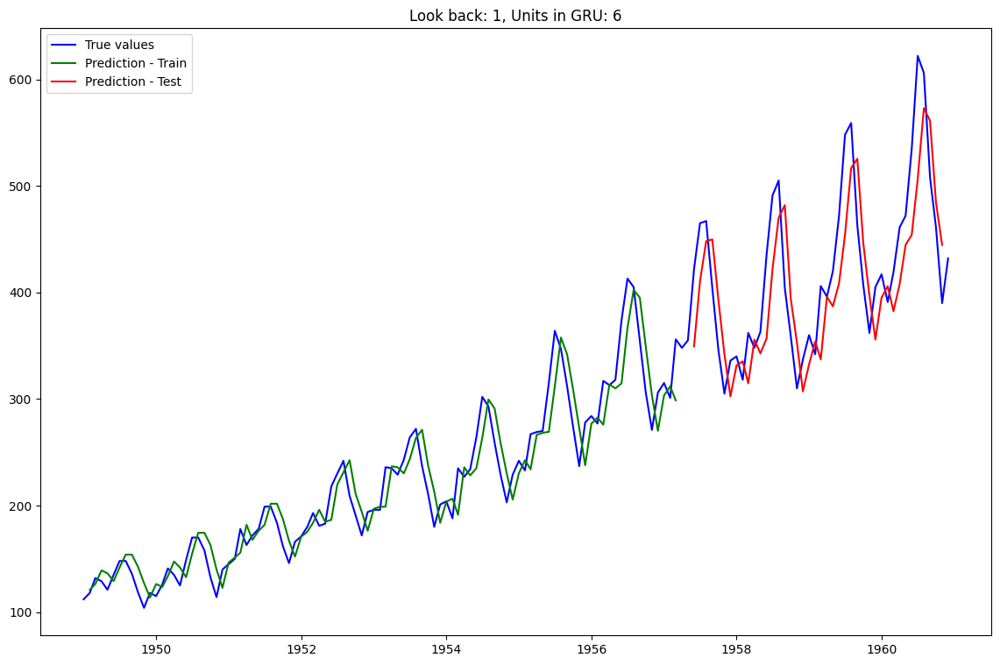

Epoch 1/100
97/97 [==============================] - 3s 3ms/step - loss: 0.1222
Epoch 2/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0391
Epoch 3/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0284
Epoch 4/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0231
Epoch 5/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0186
Epoch 6/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0150
Epoch 7/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0126
Epoch 8/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0105
Epoch 9/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0091
Epoch 10/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0082
Epoch 11/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0078
Epoch 12/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0072
Epoch 13/100
97/97 [=================

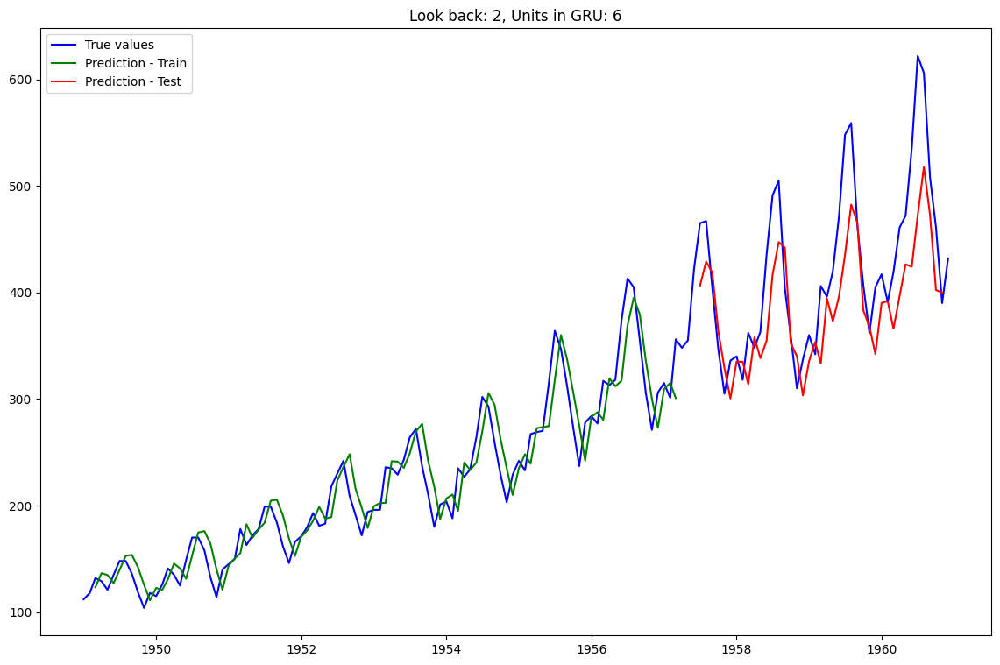

Epoch 1/100
96/96 [==============================] - 3s 3ms/step - loss: 0.0633
Epoch 2/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0247
Epoch 3/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0215
Epoch 4/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0190
Epoch 5/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0176
Epoch 6/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0161
Epoch 7/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0157
Epoch 8/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0150
Epoch 9/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0147
Epoch 10/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0142
Epoch 11/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0137
Epoch 12/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0131
Epoch 13/100
96/96 [=================

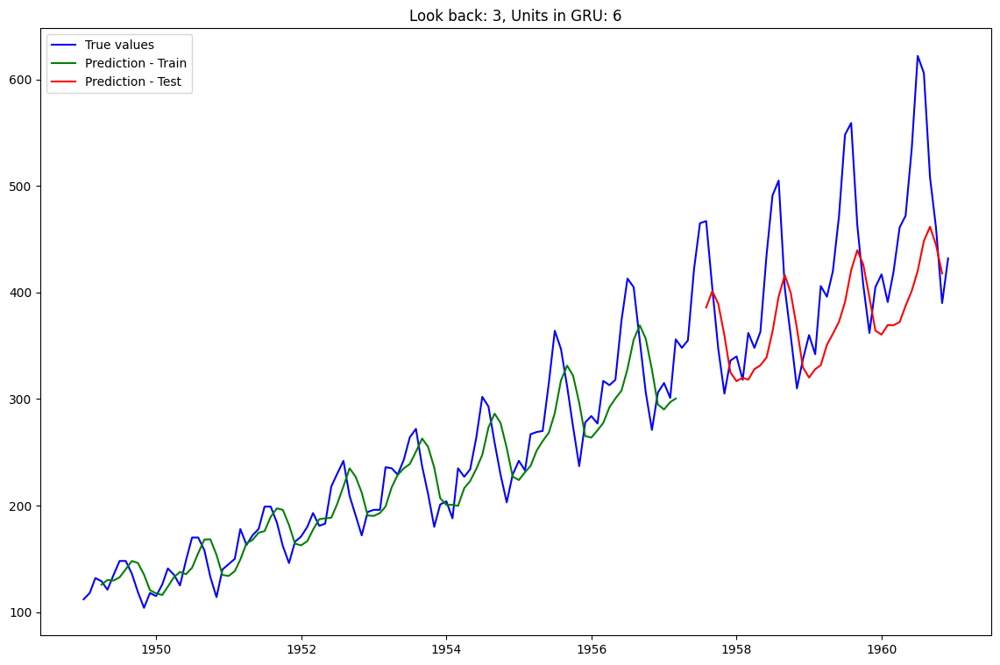

Epoch 1/100
95/95 [==============================] - 3s 3ms/step - loss: 0.0157
Epoch 2/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 3/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0117
Epoch 4/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0103
Epoch 5/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0095
Epoch 6/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0091
Epoch 7/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0084
Epoch 8/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0079
Epoch 9/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0073
Epoch 10/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0076
Epoch 11/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0071
Epoch 12/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0067
Epoch 13/100
95/95 [=================

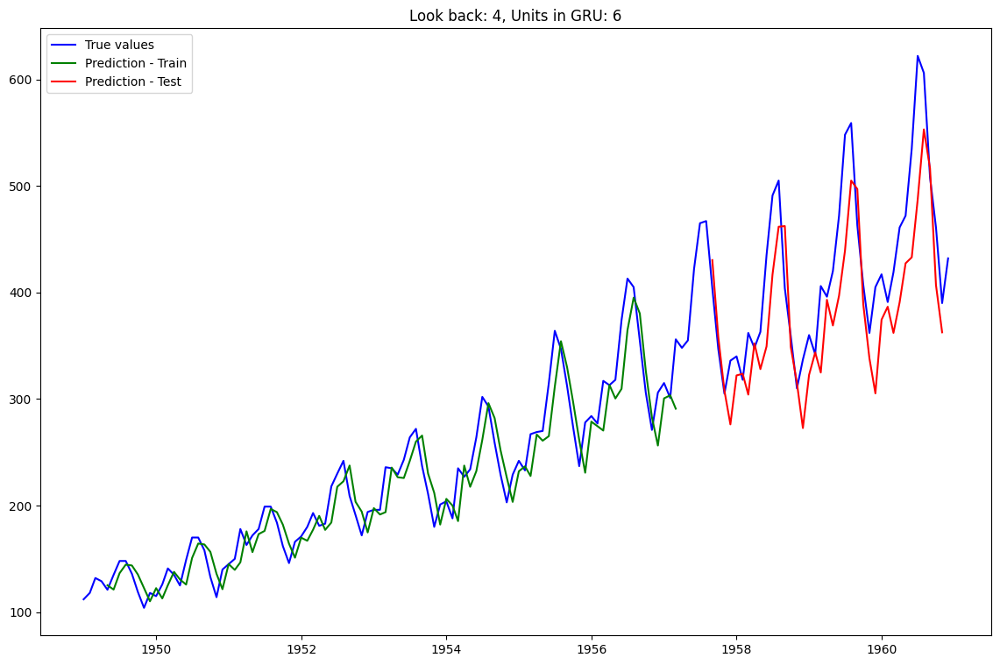

Epoch 1/100
94/94 [==============================] - 3s 3ms/step - loss: 0.0243
Epoch 2/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0167
Epoch 3/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0148
Epoch 4/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0144
Epoch 5/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0124
Epoch 6/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0113
Epoch 7/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0109
Epoch 8/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0110
Epoch 9/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0106
Epoch 10/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0098
Epoch 11/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0091
Epoch 12/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0090
Epoch 13/100
94/94 [=================

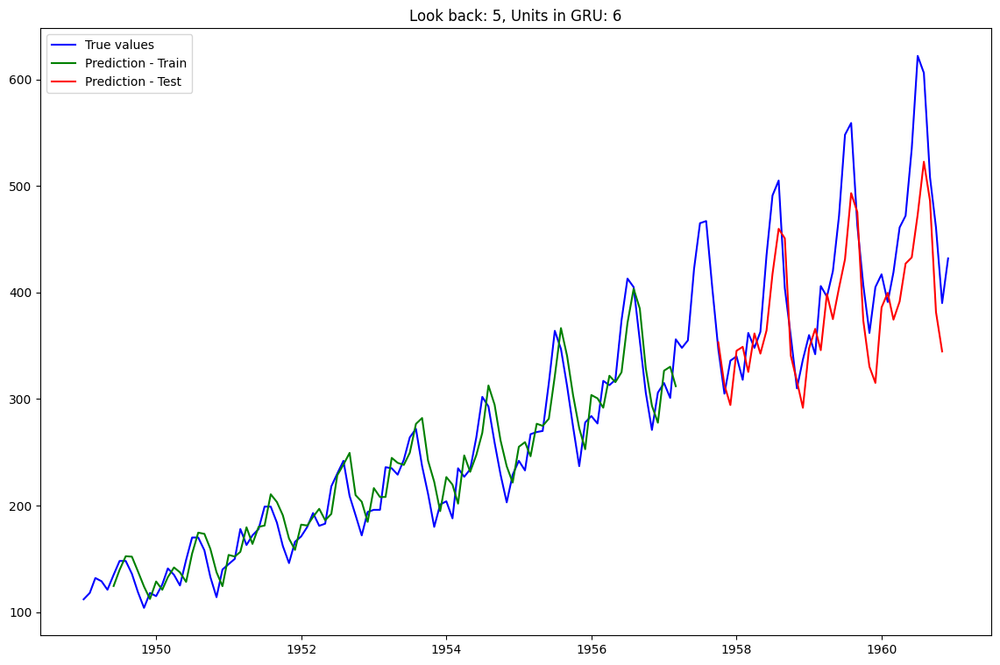

Epoch 1/100
93/93 [==============================] - 3s 4ms/step - loss: 0.1100
Epoch 2/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0272
Epoch 3/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0191
Epoch 4/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0161
Epoch 5/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0142
Epoch 6/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 7/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0108
Epoch 8/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0104
Epoch 9/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0095
Epoch 10/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0091
Epoch 11/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0089
Epoch 12/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 13/100
93/93 [=================

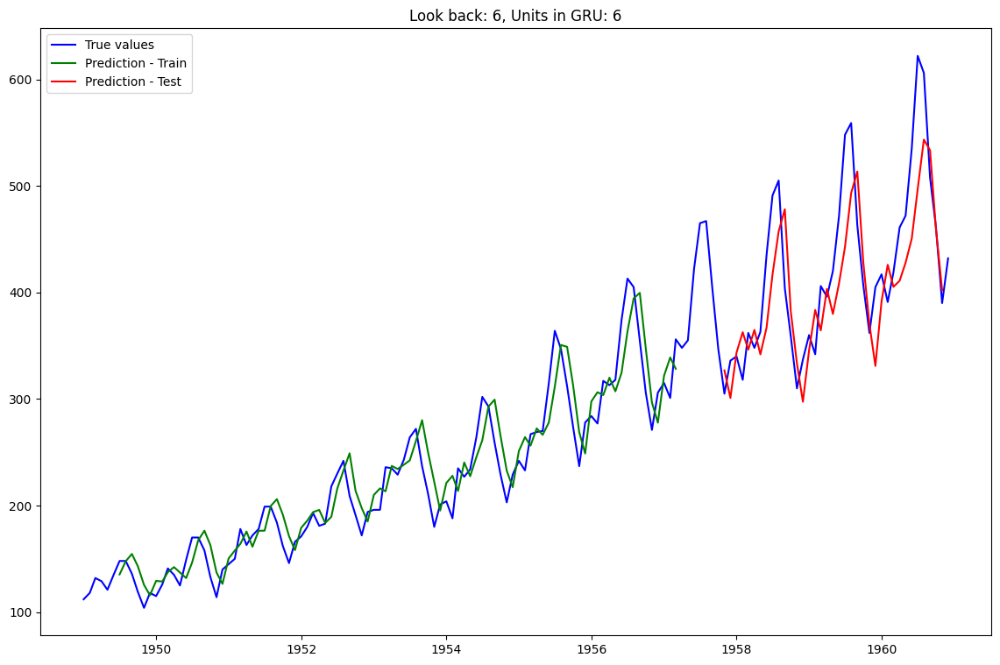

Epoch 1/100
92/92 [==============================] - 3s 4ms/step - loss: 0.0248
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0149
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0133
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0126
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0120
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0118
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0114
Epoch 8/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0112
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0113
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0112
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0109
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0108
Epoch 13/100
92/92 [=================

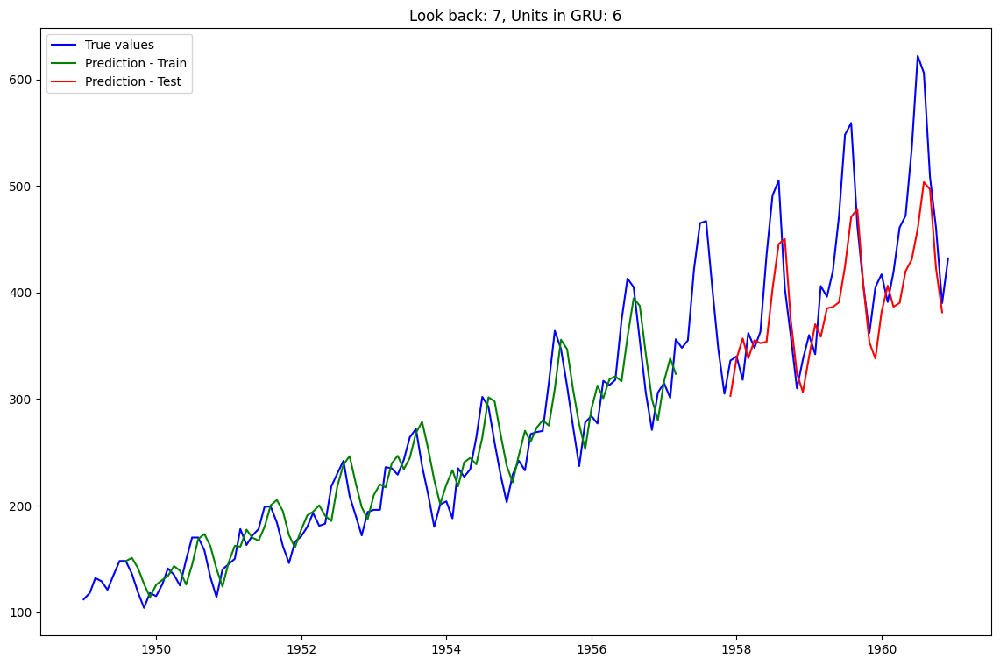

Epoch 1/100
91/91 [==============================] - 3s 4ms/step - loss: 0.0177
Epoch 2/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 3/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0104
Epoch 4/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 5/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0097
Epoch 6/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0087
Epoch 7/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0087
Epoch 8/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 9/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0082
Epoch 10/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0080
Epoch 11/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0083
Epoch 12/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0076
Epoch 13/100
91/91 [=================

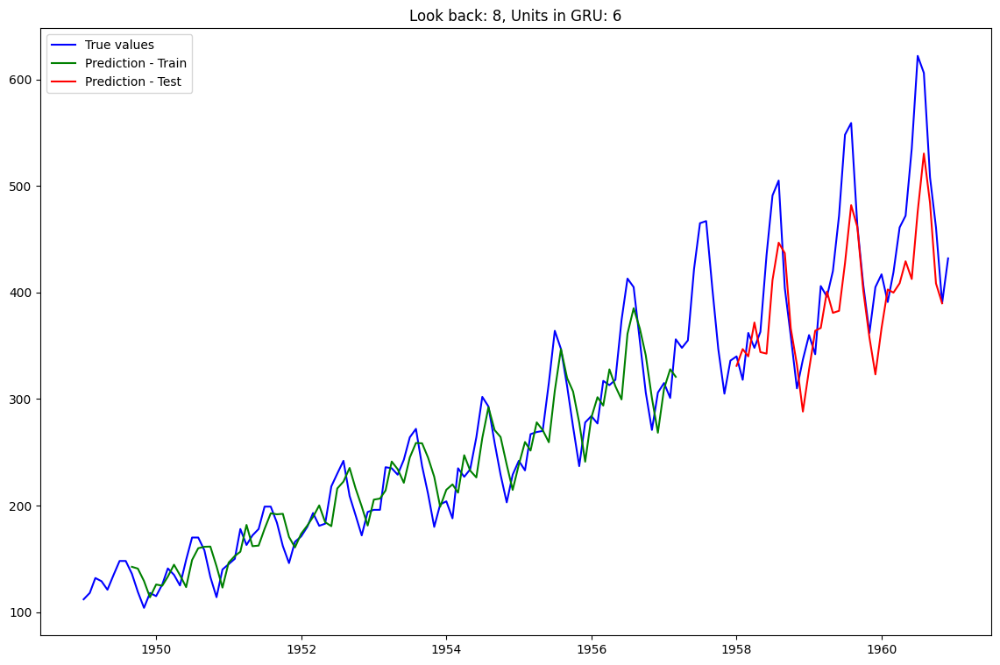

Epoch 1/100
90/90 [==============================] - 3s 4ms/step - loss: 0.0585
Epoch 2/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0352
Epoch 3/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0310
Epoch 4/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0283
Epoch 5/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0258
Epoch 6/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0228
Epoch 7/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0213
Epoch 8/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0200
Epoch 9/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0191
Epoch 10/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0176
Epoch 11/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0167
Epoch 12/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0157
Epoch 13/100
90/90 [=================

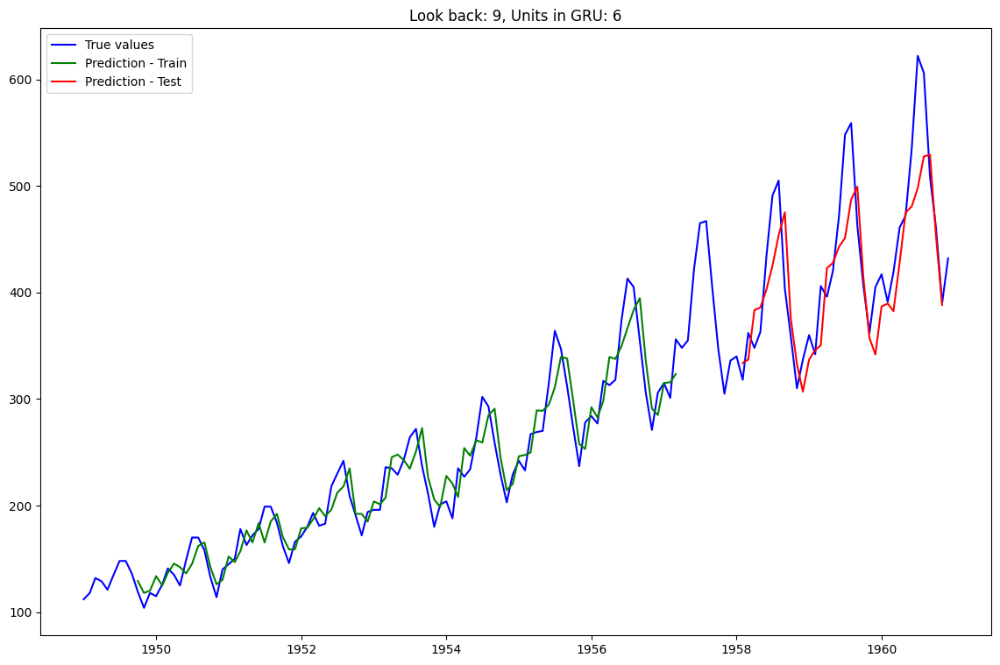

Epoch 1/100
89/89 [==============================] - 3s 3ms/step - loss: 0.1007
Epoch 2/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0179
Epoch 3/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0138
Epoch 4/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0126
Epoch 5/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0106
Epoch 6/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0101
Epoch 7/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0094
Epoch 8/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0088
Epoch 9/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0084
Epoch 10/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0085
Epoch 11/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0089
Epoch 12/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0084
Epoch 13/100
89/89 [=================

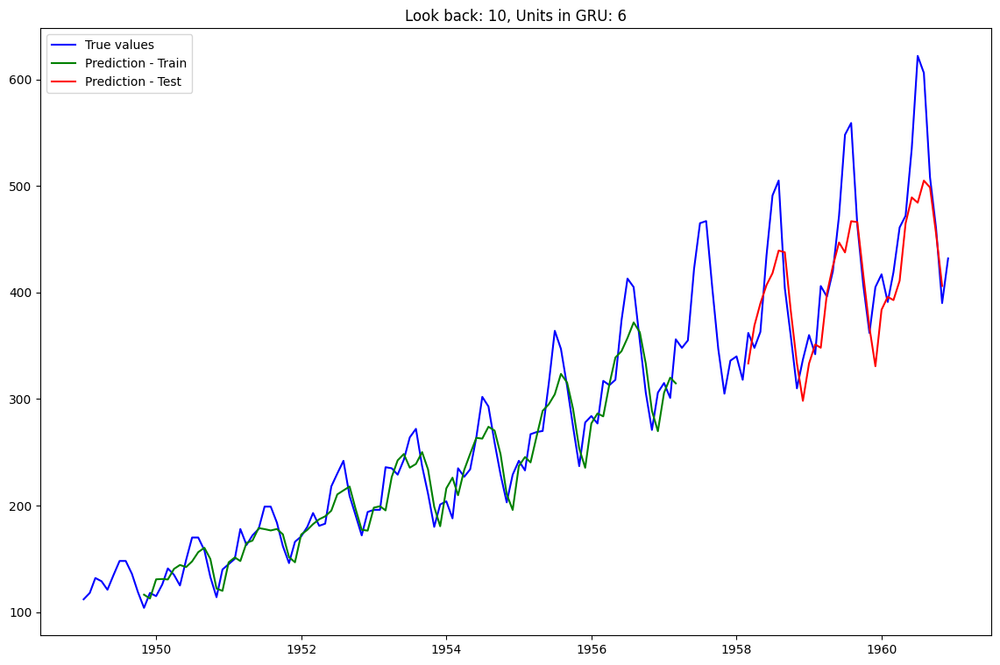

Epoch 1/100
88/88 [==============================] - 3s 4ms/step - loss: 0.1155
Epoch 2/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0244
Epoch 3/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0200
Epoch 4/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0175
Epoch 5/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0153
Epoch 6/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0143
Epoch 7/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0130
Epoch 8/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0118
Epoch 9/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 10/100
88/88 [==============================] - 0s 5ms/step - loss: 0.0101
Epoch 11/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0093
Epoch 12/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 13/100
88/88 [=================

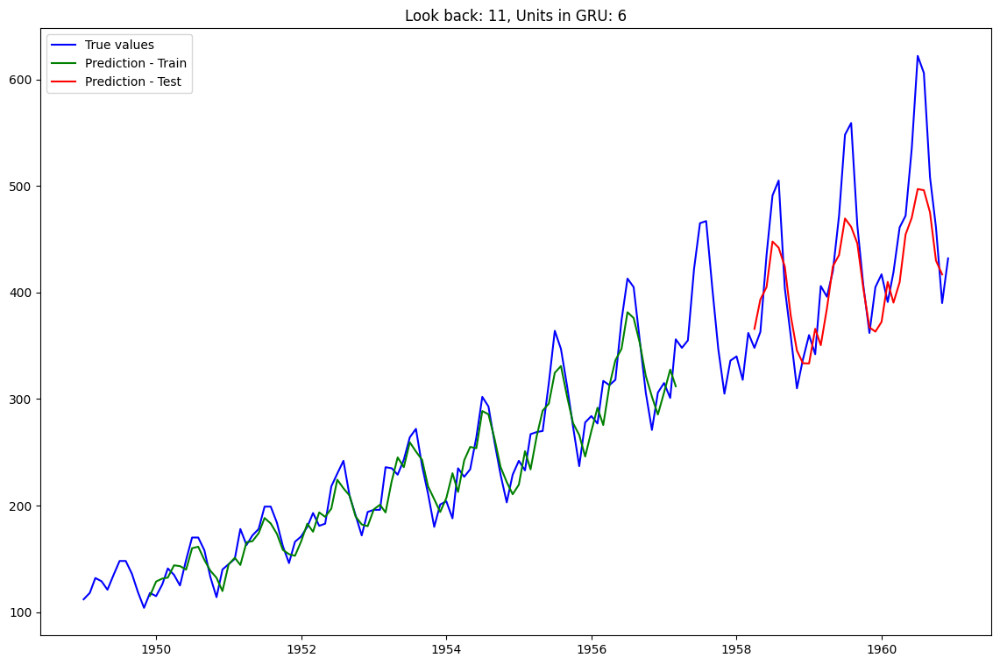

Epoch 1/100
87/87 [==============================] - 3s 3ms/step - loss: 0.1520
Epoch 2/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0194
Epoch 3/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0155
Epoch 4/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0129
Epoch 5/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0113
Epoch 6/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 7/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0090
Epoch 8/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0082
Epoch 9/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0074
Epoch 10/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0069
Epoch 11/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0063
Epoch 12/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0059
Epoch 13/100
87/87 [=================

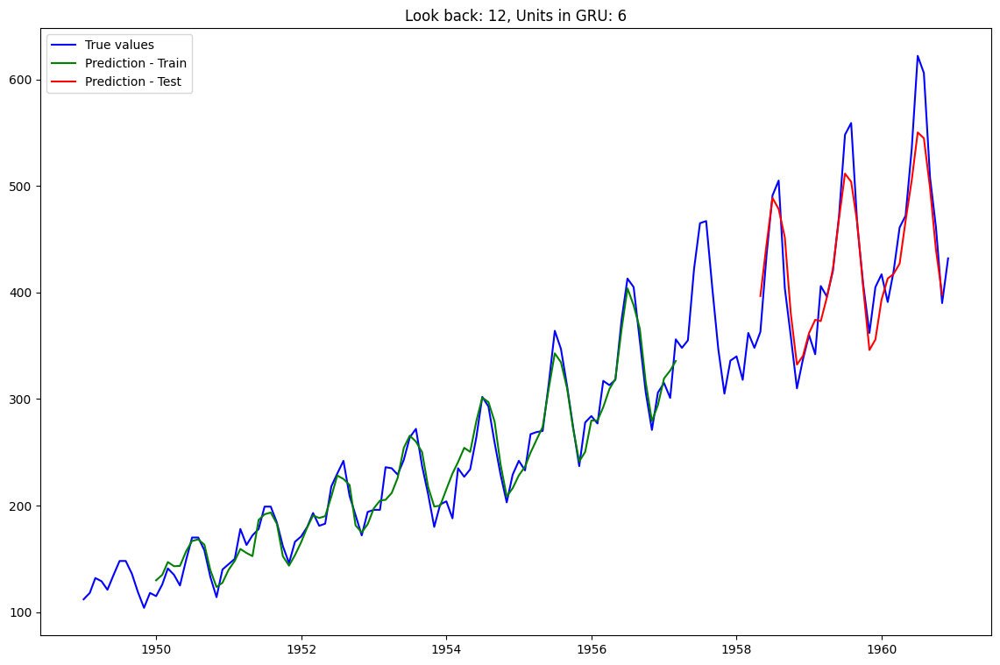

Epoch 1/100
98/98 [==============================] - 3s 4ms/step - loss: 0.2296
Epoch 2/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0885
Epoch 3/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0674
Epoch 4/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0585
Epoch 5/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0512
Epoch 6/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0443
Epoch 7/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0391
Epoch 8/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0330
Epoch 9/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0283
Epoch 10/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0236
Epoch 11/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0199
Epoch 12/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0168
Epoch 13/100
98/98 [=================

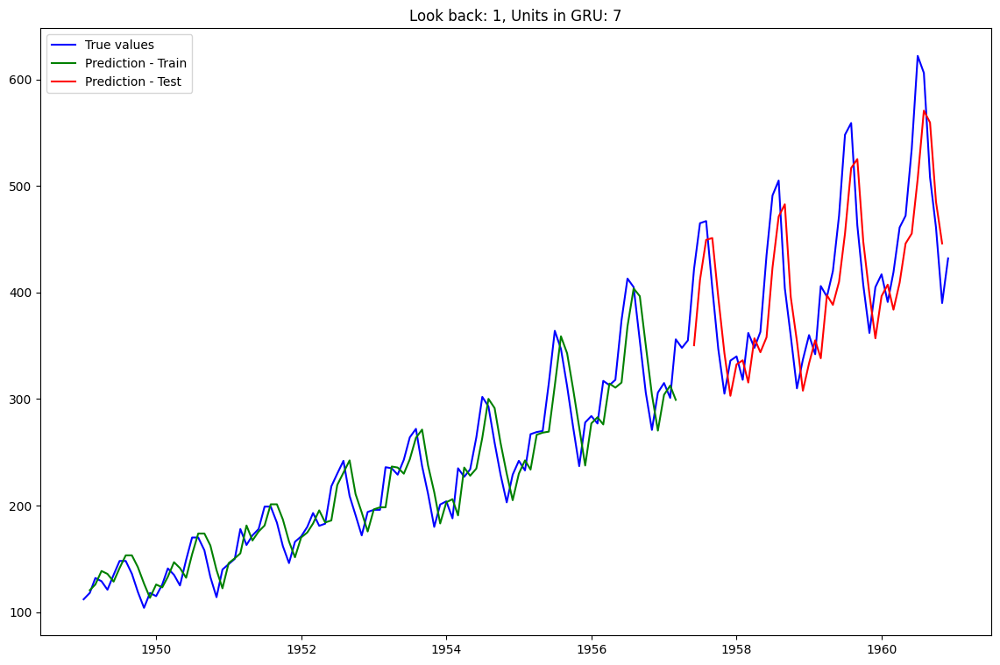

Epoch 1/100
97/97 [==============================] - 3s 3ms/step - loss: 0.2011
Epoch 2/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0755
Epoch 3/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0493
Epoch 4/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0417
Epoch 5/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0357
Epoch 6/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0306
Epoch 7/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0262
Epoch 8/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0224
Epoch 9/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0193
Epoch 10/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0164
Epoch 11/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0144
Epoch 12/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0127
Epoch 13/100
97/97 [=================

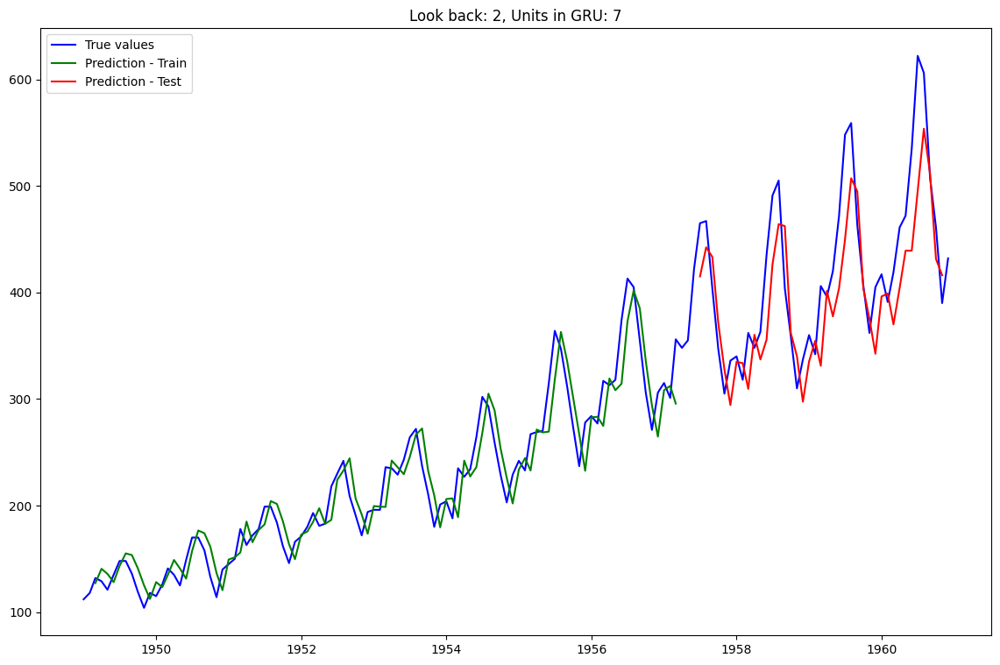

Epoch 1/100
96/96 [==============================] - 3s 3ms/step - loss: 0.1020
Epoch 2/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0312
Epoch 3/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0239
Epoch 4/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0198
Epoch 5/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0168
Epoch 6/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0141
Epoch 7/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0125
Epoch 8/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0108
Epoch 9/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0108
Epoch 10/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0098
Epoch 11/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 12/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0091
Epoch 13/100
96/96 [=================

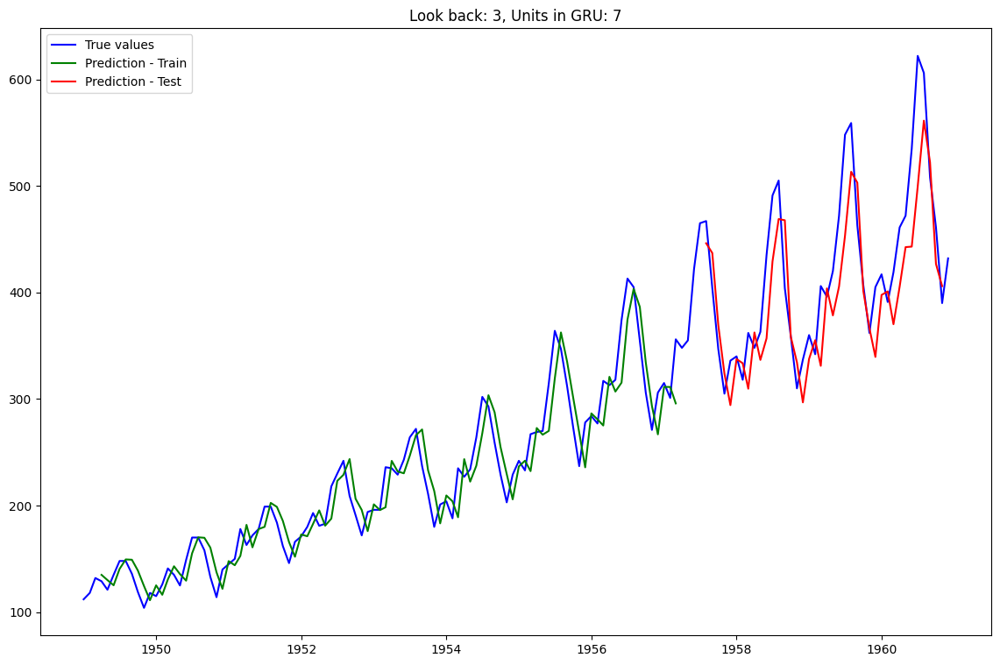

Epoch 1/100
95/95 [==============================] - 3s 4ms/step - loss: 0.1668
Epoch 2/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0352
Epoch 3/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0271
Epoch 4/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0219
Epoch 5/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 6/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0154
Epoch 7/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0133
Epoch 8/100
95/95 [==============================] - 0s 5ms/step - loss: 0.0119
Epoch 9/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0111
Epoch 10/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0103
Epoch 11/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 12/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0090
Epoch 13/100
95/95 [=================

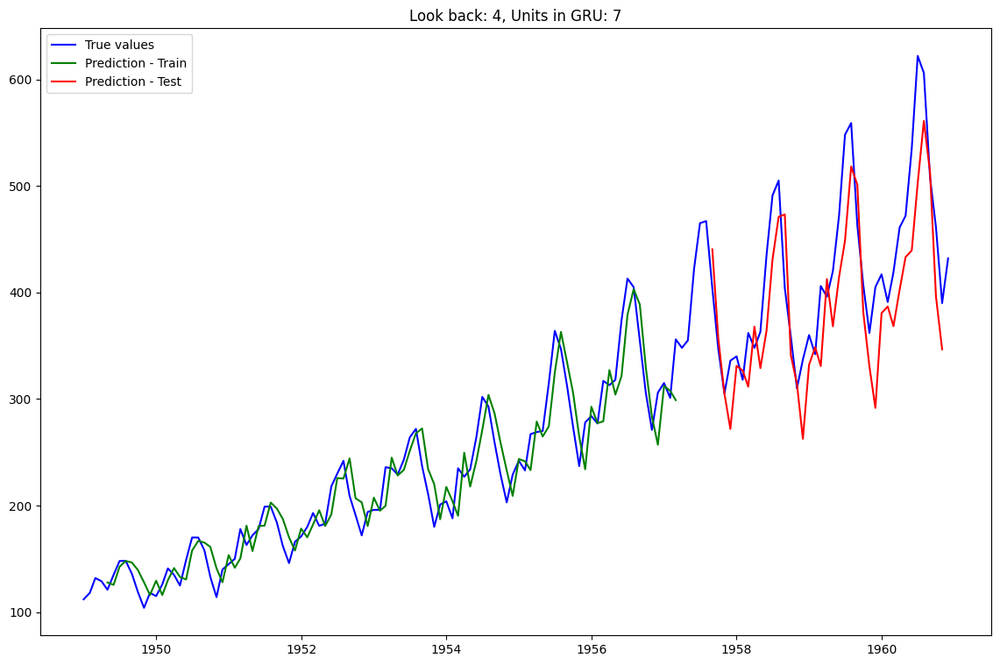

Epoch 1/100
94/94 [==============================] - 3s 4ms/step - loss: 0.1057
Epoch 2/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0253
Epoch 3/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0210
Epoch 4/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0181
Epoch 5/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0166
Epoch 6/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0151
Epoch 7/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0145
Epoch 8/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0135
Epoch 9/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0128
Epoch 10/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0122
Epoch 11/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0117
Epoch 12/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0116
Epoch 13/100
94/94 [=================

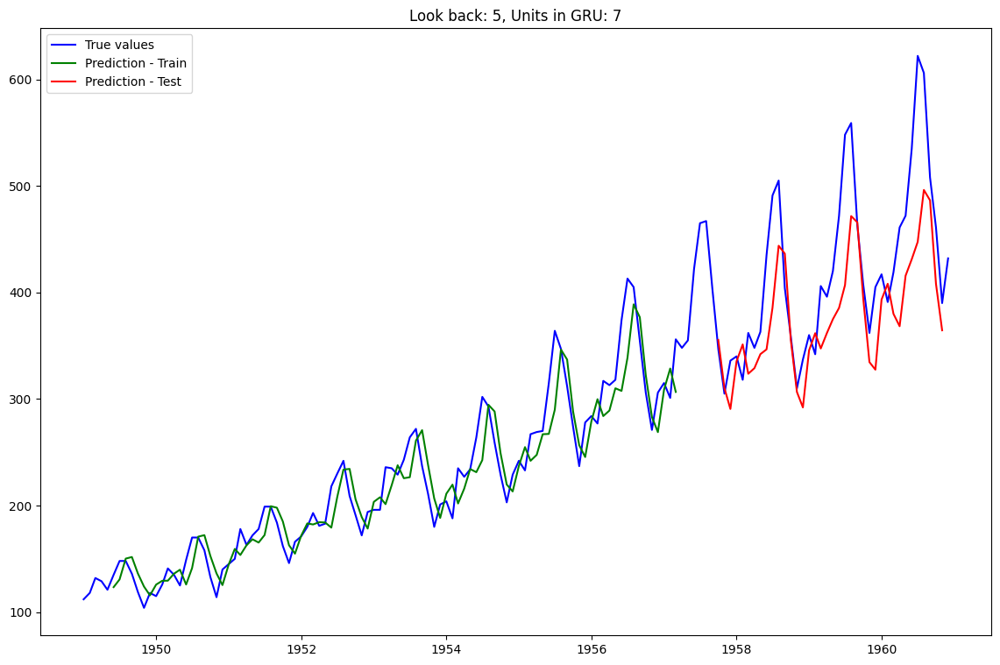

Epoch 1/100
93/93 [==============================] - 3s 3ms/step - loss: 0.0152
Epoch 2/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0138
Epoch 3/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0129
Epoch 4/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0122
Epoch 5/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0115
Epoch 6/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0108
Epoch 7/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0104
Epoch 8/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0102
Epoch 9/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0097
Epoch 10/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0092
Epoch 11/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0092
Epoch 12/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0090
Epoch 13/100
93/93 [=================

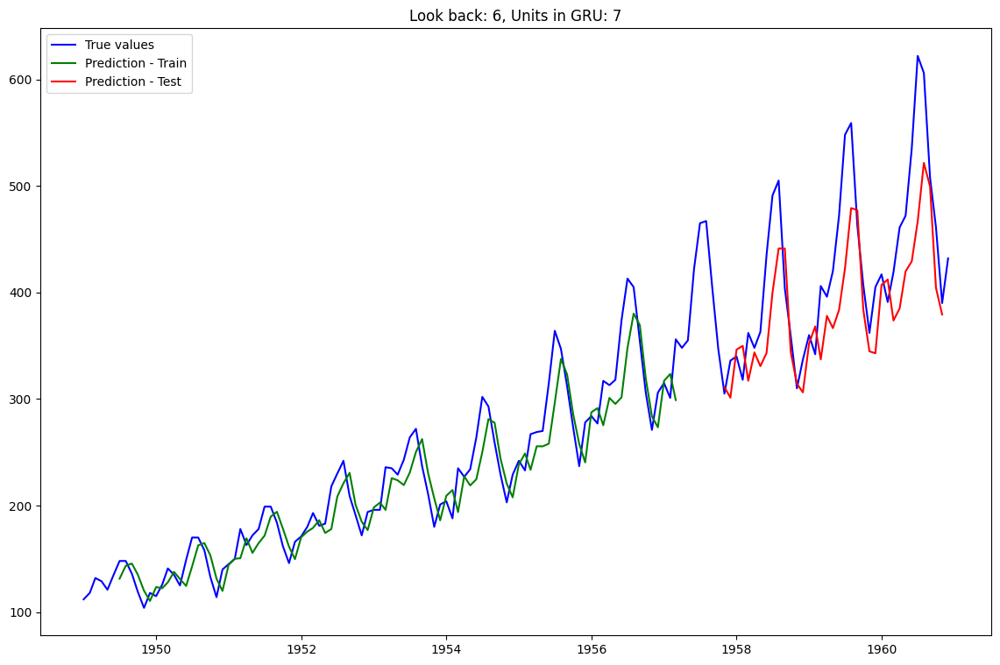

Epoch 1/100
92/92 [==============================] - 3s 3ms/step - loss: 0.0693
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0271
Epoch 3/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0234
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0209
Epoch 5/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0184
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0170
Epoch 7/100
92/92 [==============================] - 0s 5ms/step - loss: 0.0159
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0143
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0135
Epoch 10/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0126
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0112
Epoch 13/100
92/92 [=================

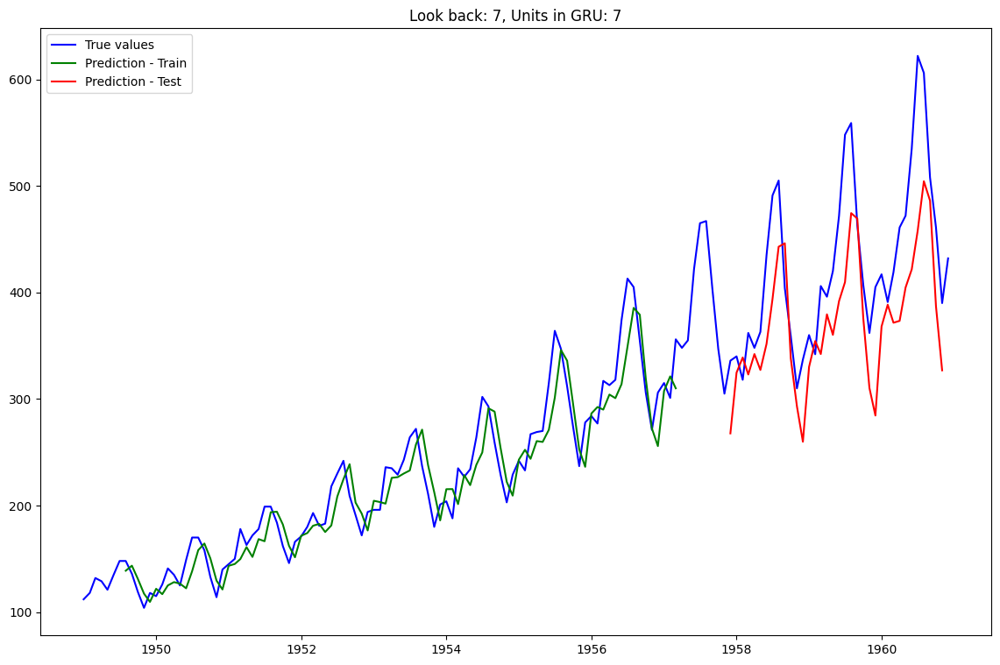

Epoch 1/100
91/91 [==============================] - 3s 4ms/step - loss: 0.0717
Epoch 2/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0258
Epoch 3/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0228
Epoch 4/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0203
Epoch 5/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0186
Epoch 6/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0170
Epoch 7/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0159
Epoch 8/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0141
Epoch 9/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0134
Epoch 10/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0125
Epoch 11/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0122
Epoch 12/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0113
Epoch 13/100
91/91 [=================

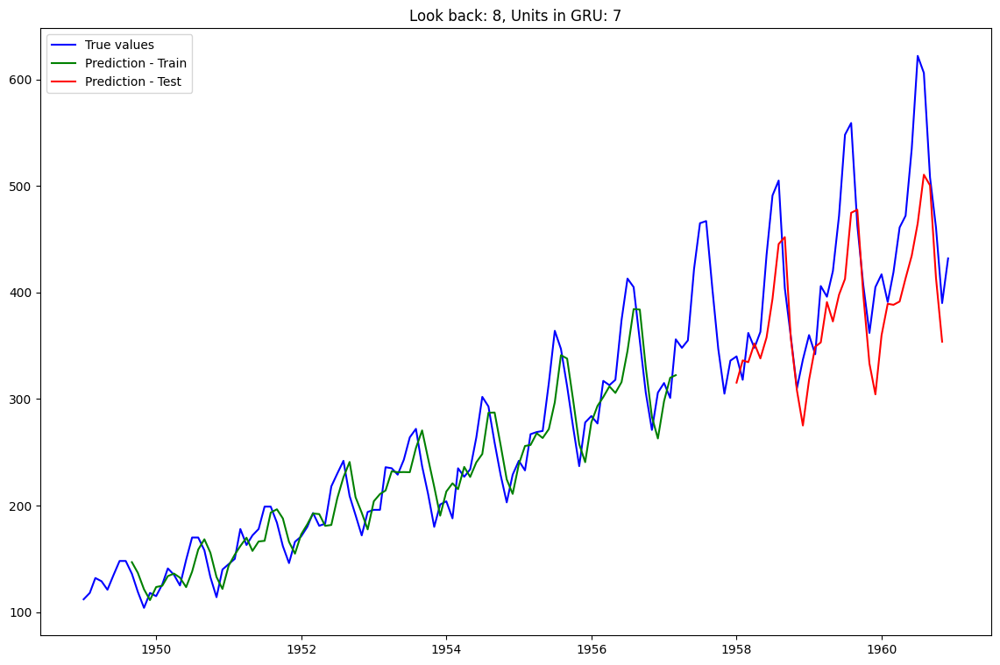

Epoch 1/100
90/90 [==============================] - 3s 4ms/step - loss: 0.1145
Epoch 2/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0228
Epoch 3/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0188
Epoch 4/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0168
Epoch 5/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0151
Epoch 6/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0138
Epoch 7/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0132
Epoch 8/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0129
Epoch 9/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0123
Epoch 10/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0118
Epoch 11/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0120
Epoch 12/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0116
Epoch 13/100
90/90 [=================

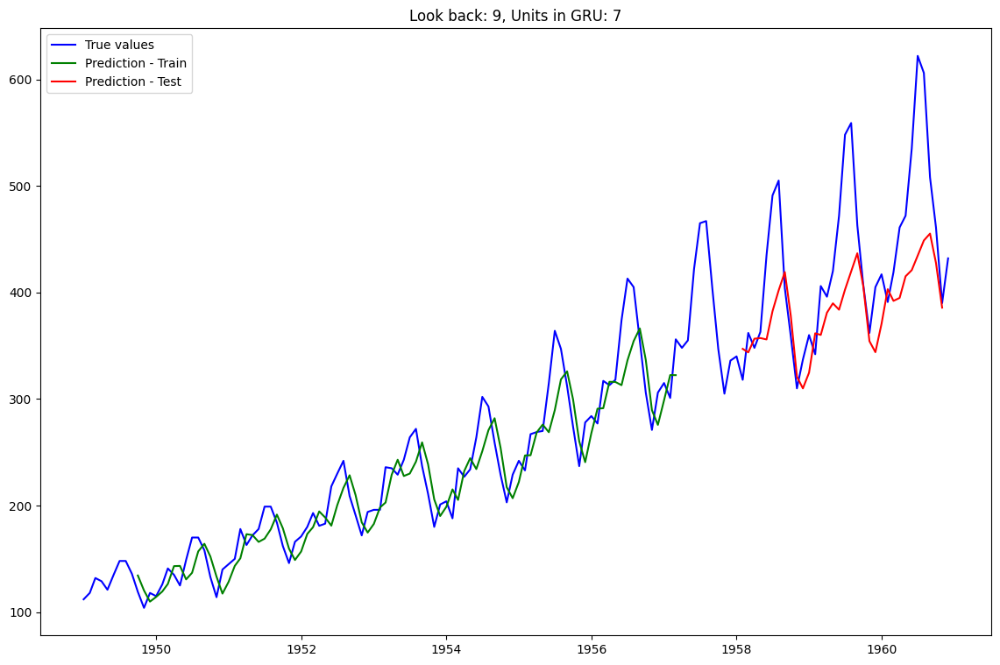

Epoch 1/100
89/89 [==============================] - 3s 3ms/step - loss: 0.0477
Epoch 2/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0118
Epoch 3/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 4/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0095
Epoch 5/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0094
Epoch 6/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0085
Epoch 7/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 8/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0081
Epoch 9/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0081
Epoch 10/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0077
Epoch 11/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0075
Epoch 12/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0072
Epoch 13/100
89/89 [=================

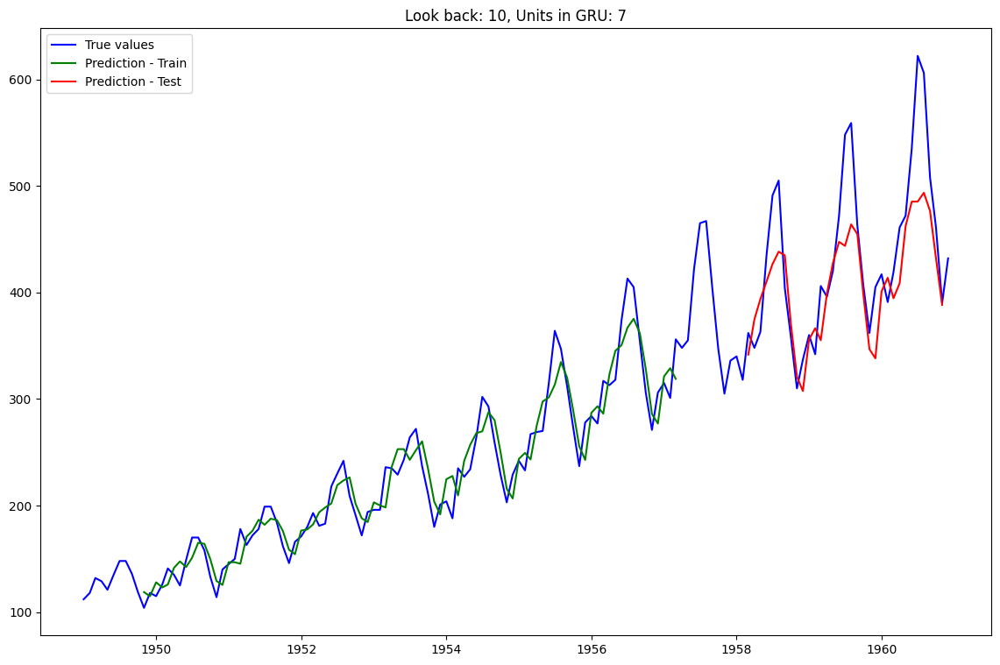

Epoch 1/100
88/88 [==============================] - 3s 3ms/step - loss: 0.2900
Epoch 2/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0323
Epoch 3/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0180
Epoch 4/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0145
Epoch 5/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0122
Epoch 6/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0101
Epoch 7/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 8/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0077
Epoch 9/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0068
Epoch 10/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 11/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 12/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0058
Epoch 13/100
88/88 [=================

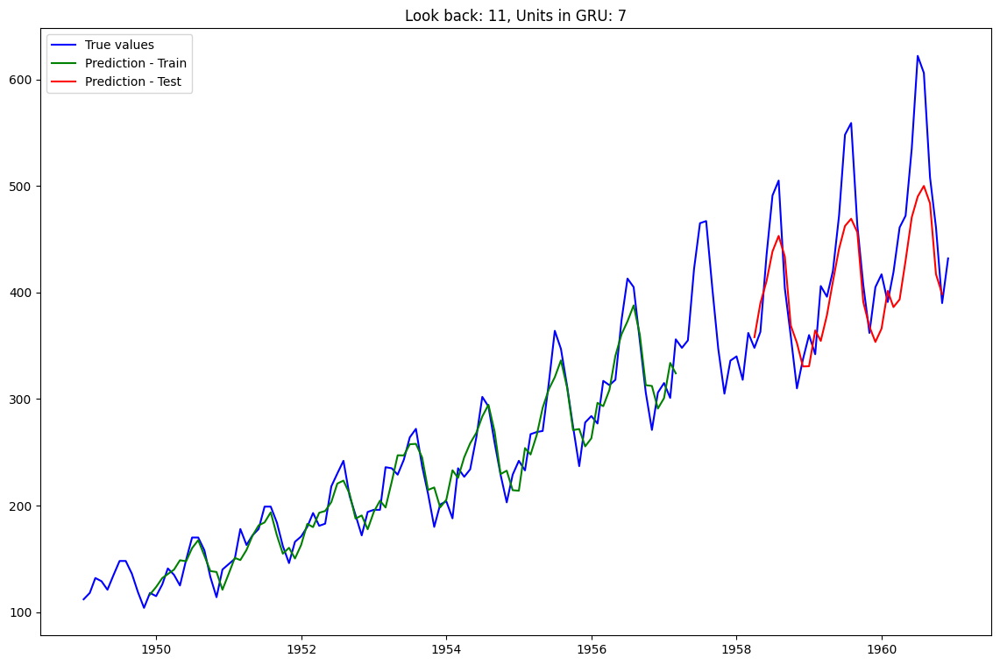

Epoch 1/100
87/87 [==============================] - 3s 4ms/step - loss: 0.0851
Epoch 2/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0144
Epoch 3/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0119
Epoch 4/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 5/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 6/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0079
Epoch 7/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0070
Epoch 8/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0063
Epoch 9/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 10/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 11/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0041
Epoch 12/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0040
Epoch 13/100
87/87 [=================

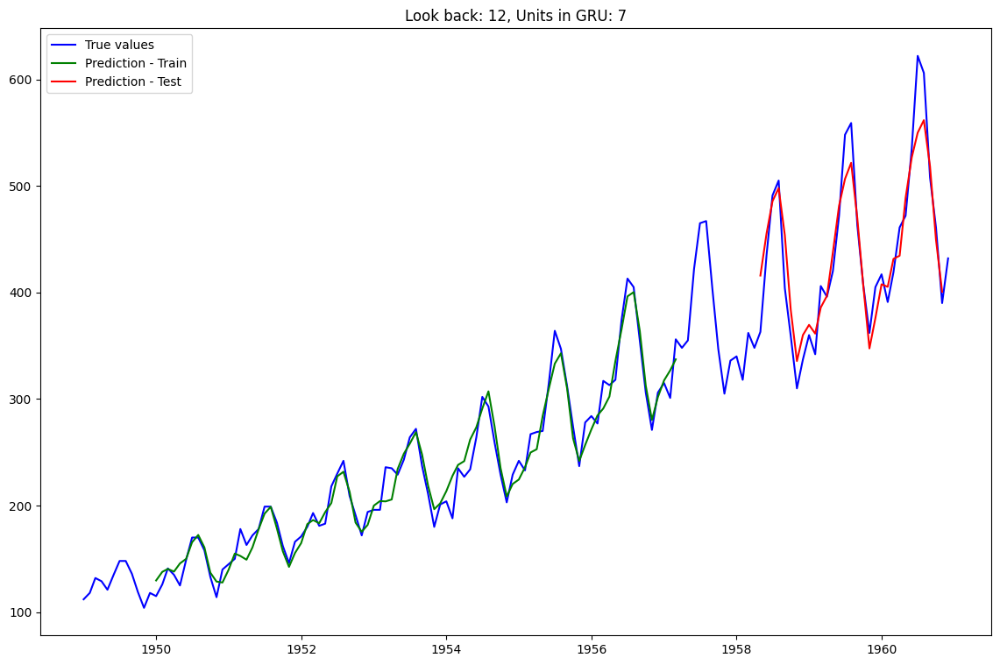

Epoch 1/100
98/98 [==============================] - 6s 3ms/step - loss: 0.0843
Epoch 2/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0299
Epoch 3/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0229
Epoch 4/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0193
Epoch 5/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0157
Epoch 6/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0127
Epoch 7/100
98/98 [==============================] - 0s 5ms/step - loss: 0.0105
Epoch 8/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 9/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0077
Epoch 10/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0067
Epoch 11/100
98/98 [==============================] - 0s 5ms/step - loss: 0.0065
Epoch 12/100
98/98 [==============================] - 0s 5ms/step - loss: 0.0060
Epoch 13/100
98/98 [=================

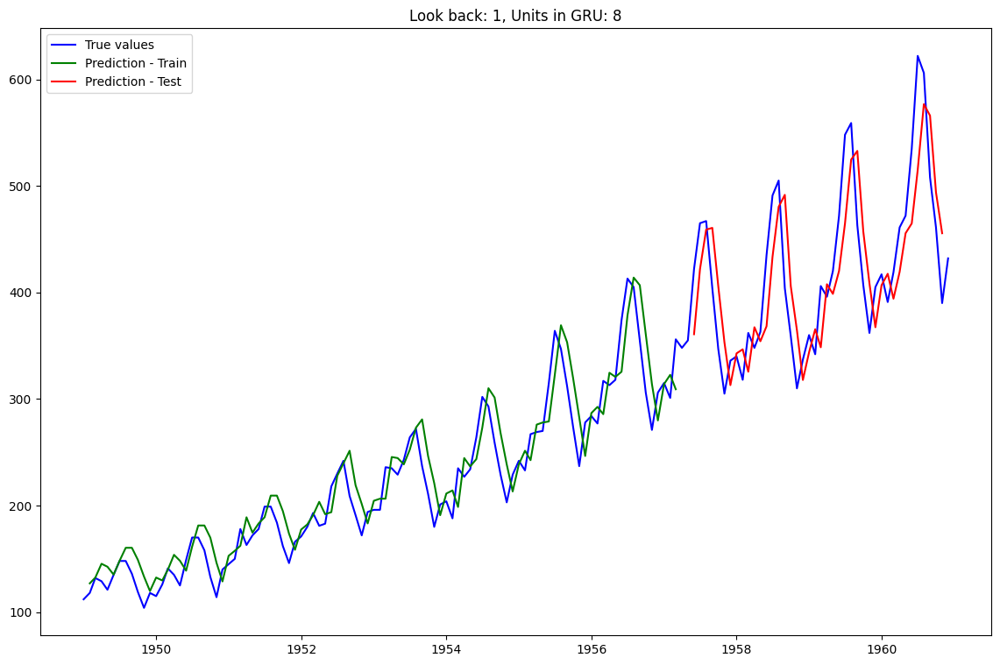

Epoch 1/100
97/97 [==============================] - 3s 4ms/step - loss: 0.0457
Epoch 2/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0162
Epoch 3/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0123
Epoch 4/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0096
Epoch 5/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0081
Epoch 6/100
97/97 [==============================] - 0s 5ms/step - loss: 0.0076
Epoch 7/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0071
Epoch 8/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0070
Epoch 9/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0066
Epoch 10/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0068
Epoch 11/100
97/97 [==============================] - 0s 5ms/step - loss: 0.0067
Epoch 12/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0068
Epoch 13/100
97/97 [=================

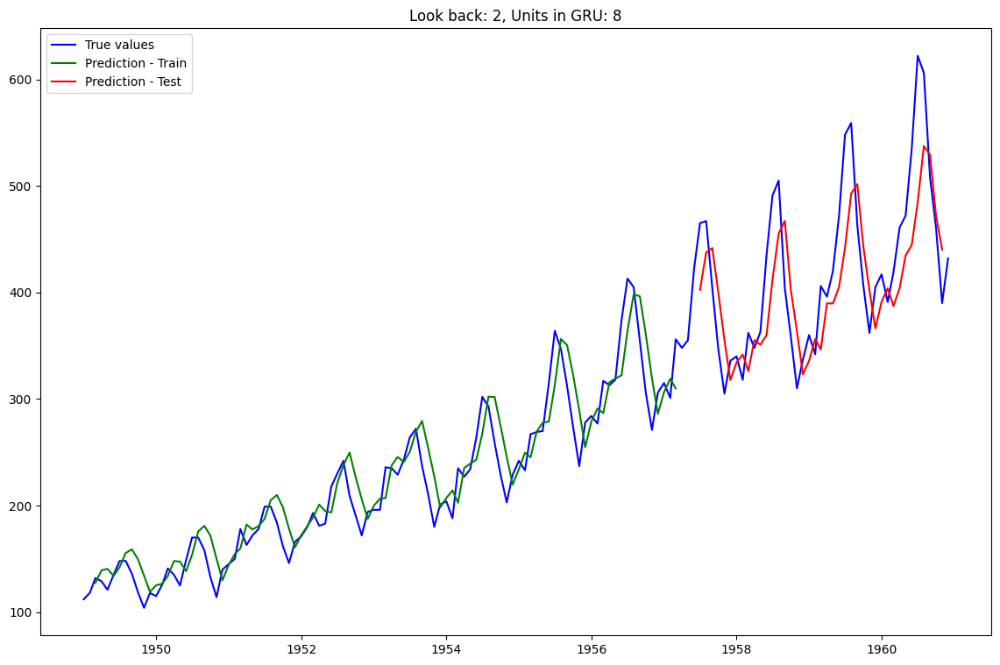

Epoch 1/100
96/96 [==============================] - 3s 5ms/step - loss: 0.0980
Epoch 2/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0248
Epoch 3/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0177
Epoch 4/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0139
Epoch 5/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 6/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0091
Epoch 7/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0081
Epoch 8/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0073
Epoch 9/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0070
Epoch 10/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0071
Epoch 11/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0071
Epoch 12/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0070
Epoch 13/100
96/96 [=================

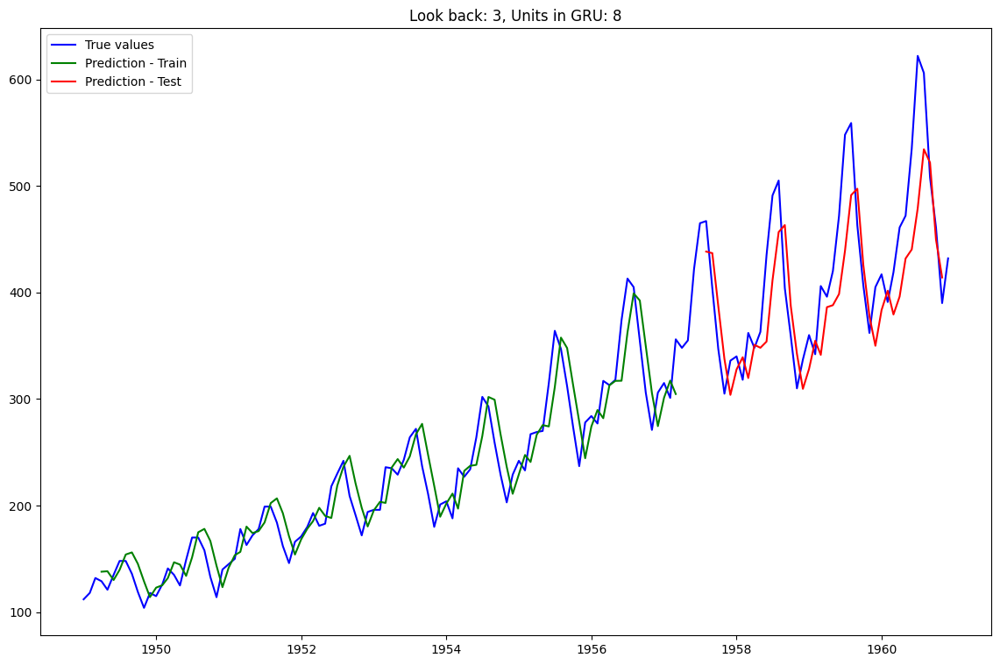

Epoch 1/100
95/95 [==============================] - 3s 4ms/step - loss: 0.0730
Epoch 2/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0192
Epoch 3/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0161
Epoch 4/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0136
Epoch 5/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 6/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 7/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 8/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 9/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0092
Epoch 10/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 11/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 12/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0089
Epoch 13/100
95/95 [=================

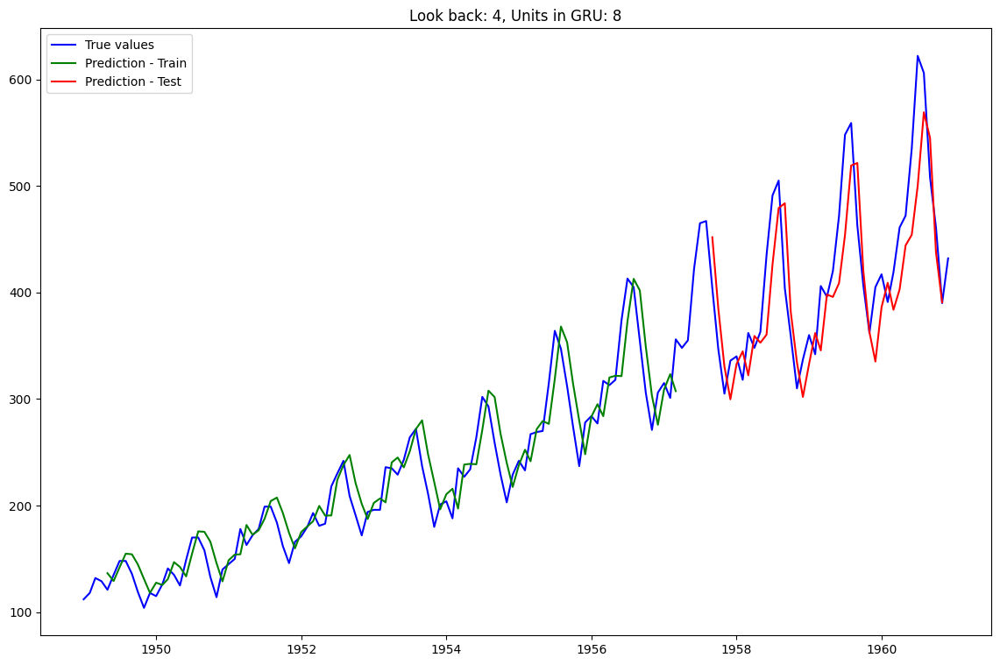

Epoch 1/100
94/94 [==============================] - 3s 4ms/step - loss: 0.0088
Epoch 2/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0081
Epoch 3/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0075
Epoch 4/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0075
Epoch 5/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0070
Epoch 6/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0070
Epoch 7/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0068
Epoch 8/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0062
Epoch 9/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0067
Epoch 10/100
94/94 [==============================] - 0s 5ms/step - loss: 0.0063
Epoch 11/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0062
Epoch 12/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0062
Epoch 13/100
94/94 [=================

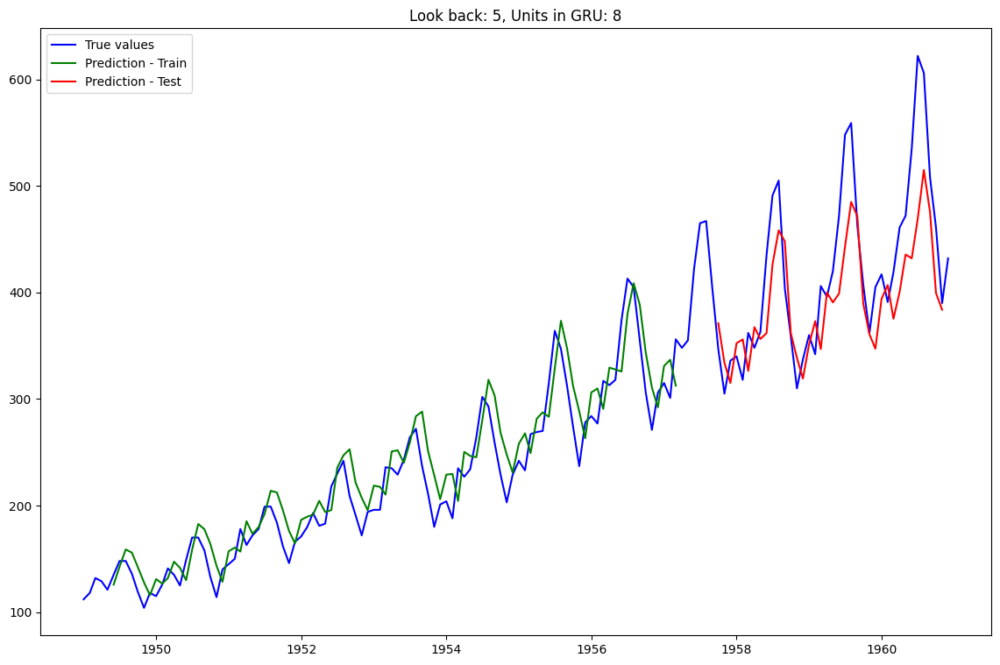

Epoch 1/100
93/93 [==============================] - 3s 4ms/step - loss: 0.1065
Epoch 2/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0273
Epoch 3/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0214
Epoch 4/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0181
Epoch 5/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0156
Epoch 6/100
93/93 [==============================] - 0s 5ms/step - loss: 0.0142
Epoch 7/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0132
Epoch 8/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0126
Epoch 9/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0121
Epoch 10/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0116
Epoch 11/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 12/100
93/93 [==============================] - 0s 5ms/step - loss: 0.0105
Epoch 13/100
93/93 [=================

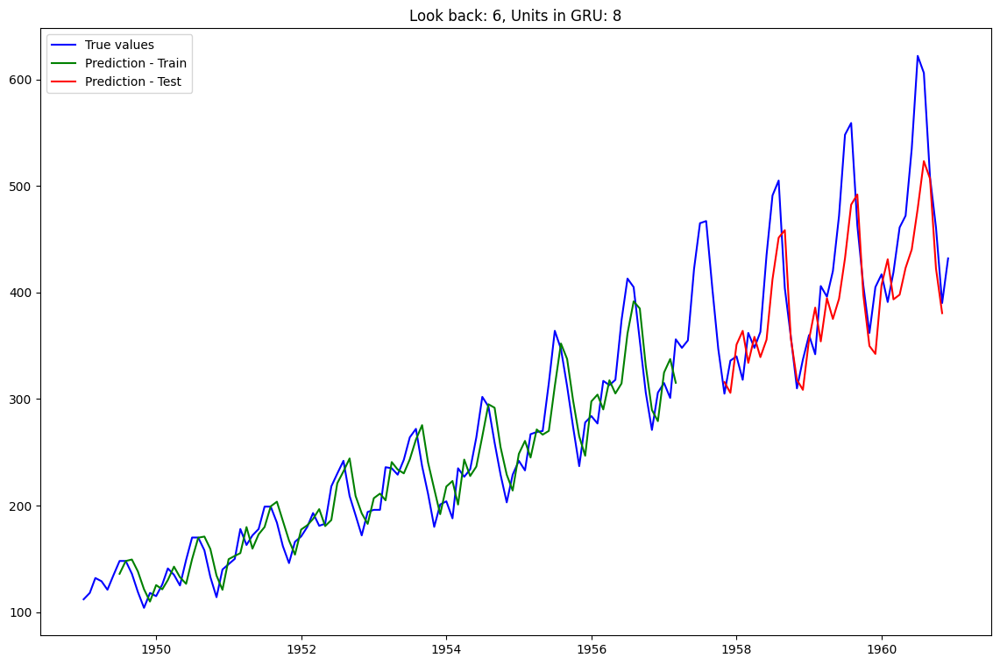

Epoch 1/100
92/92 [==============================] - 3s 3ms/step - loss: 0.0912
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0187
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0168
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0149
Epoch 5/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0136
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0128
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0125
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0119
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0115
Epoch 10/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0113
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0109
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 13/100
92/92 [=================

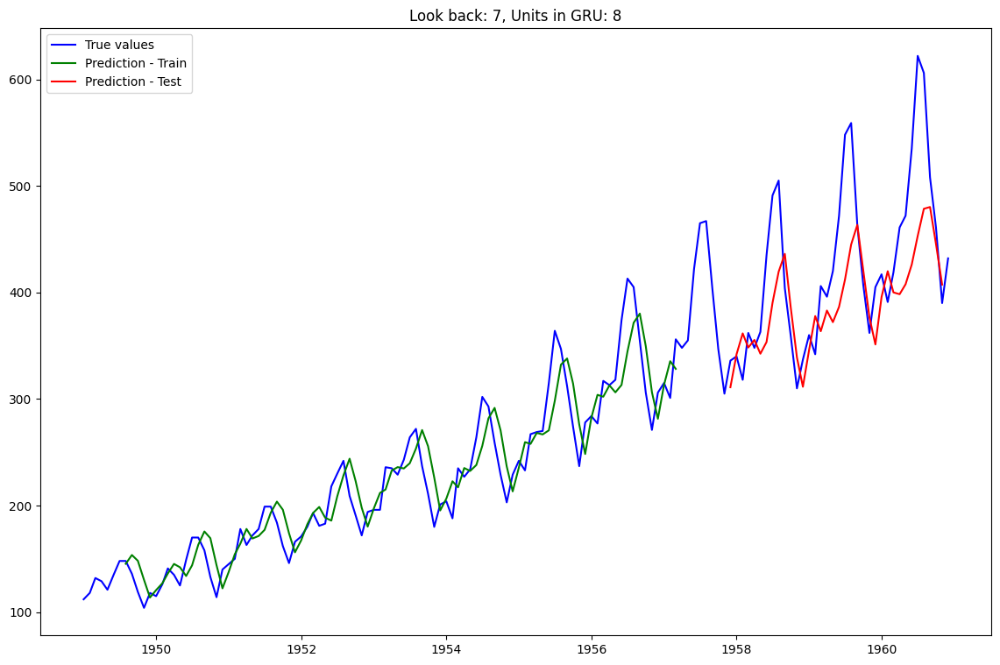

Epoch 1/100
91/91 [==============================] - 3s 4ms/step - loss: 0.0920
Epoch 2/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0293
Epoch 3/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0264
Epoch 4/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0243
Epoch 5/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0228
Epoch 6/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0215
Epoch 7/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0200
Epoch 8/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 9/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 10/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0176
Epoch 11/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0169
Epoch 12/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0161
Epoch 13/100
91/91 [=================

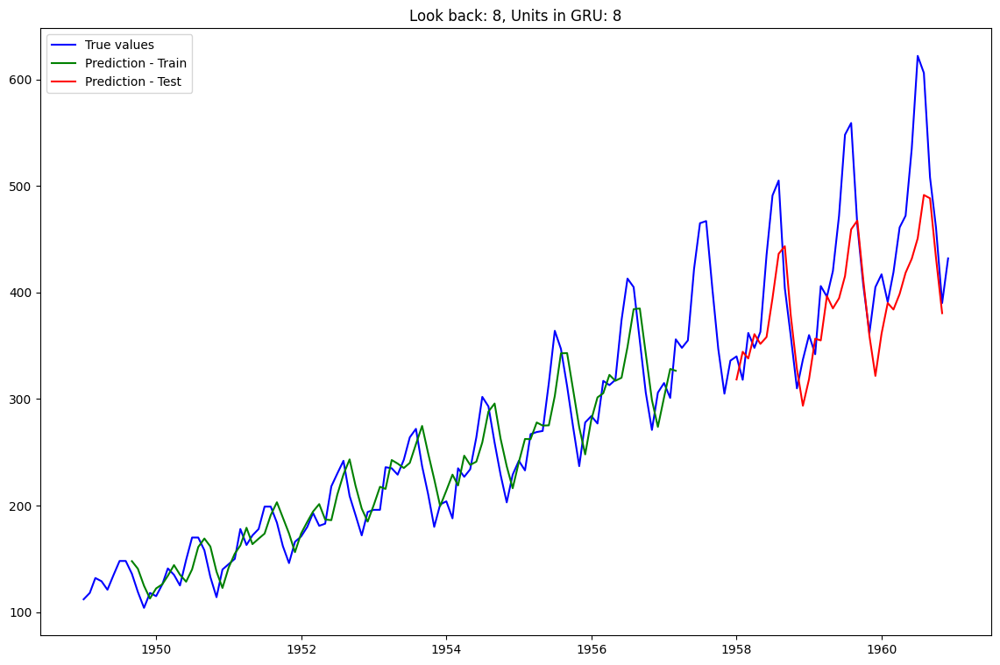

Epoch 1/100
90/90 [==============================] - 3s 4ms/step - loss: 0.3132
Epoch 2/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0506
Epoch 3/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0309
Epoch 4/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0254
Epoch 5/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0214
Epoch 6/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0183
Epoch 7/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0164
Epoch 8/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0146
Epoch 9/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0136
Epoch 10/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0127
Epoch 11/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0123
Epoch 12/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0120
Epoch 13/100
90/90 [=================

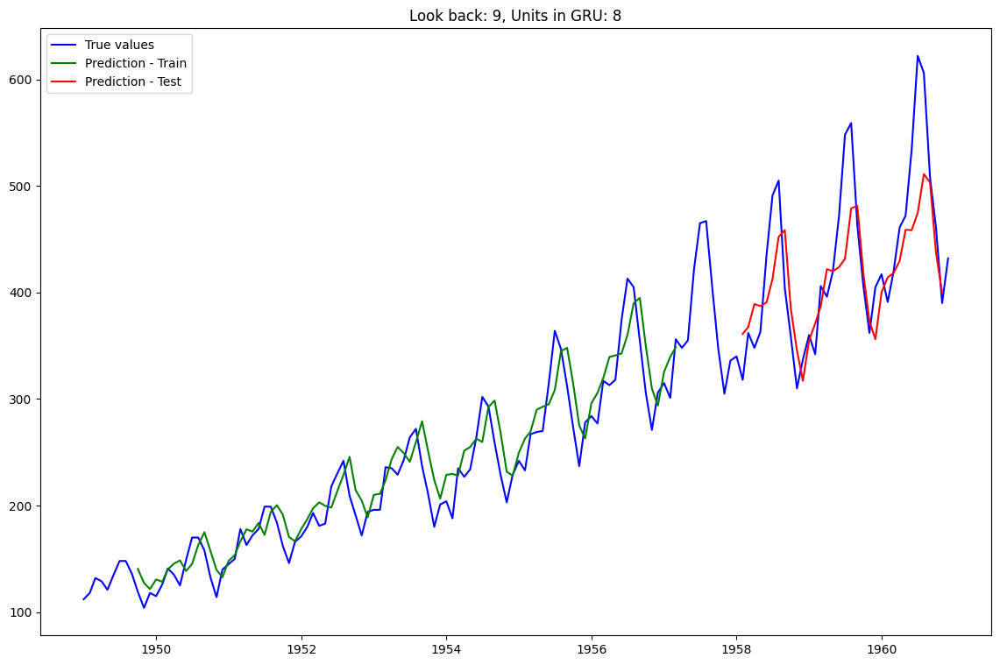

Epoch 1/100
89/89 [==============================] - 3s 4ms/step - loss: 0.0464
Epoch 2/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0147
Epoch 3/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0126
Epoch 4/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0112
Epoch 5/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 6/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0093
Epoch 7/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 8/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0082
Epoch 9/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0073
Epoch 10/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0073
Epoch 11/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0069
Epoch 12/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0066
Epoch 13/100
89/89 [=================

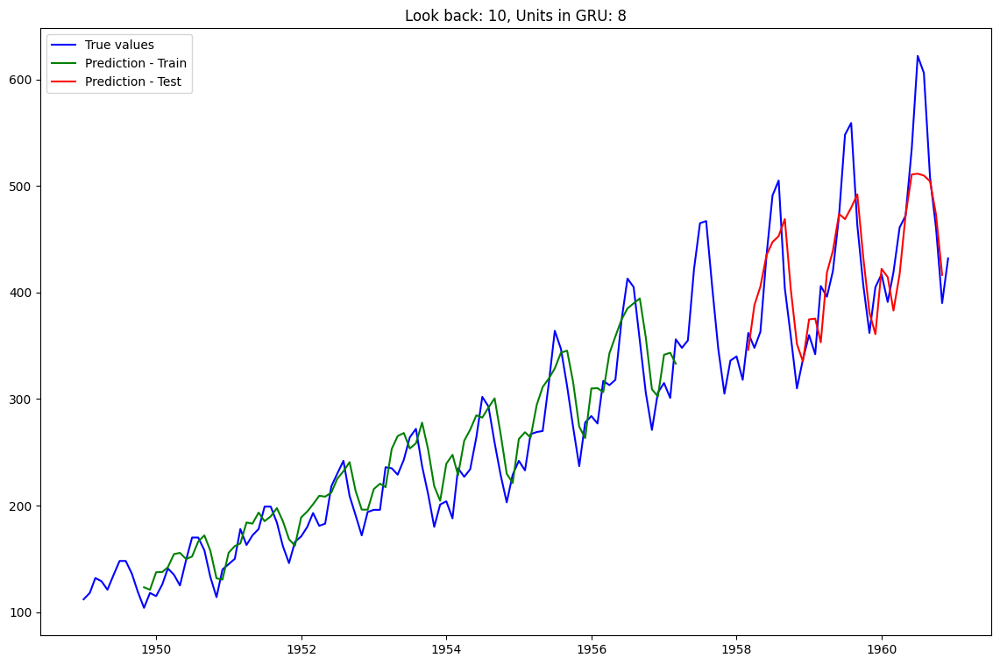

Epoch 1/100
88/88 [==============================] - 3s 4ms/step - loss: 0.0209
Epoch 2/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0164
Epoch 3/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0137
Epoch 4/100
88/88 [==============================] - 0s 5ms/step - loss: 0.0116
Epoch 5/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 6/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 7/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0084
Epoch 8/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0078
Epoch 9/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0067
Epoch 10/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0065
Epoch 11/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0056
Epoch 12/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0058
Epoch 13/100
88/88 [=================

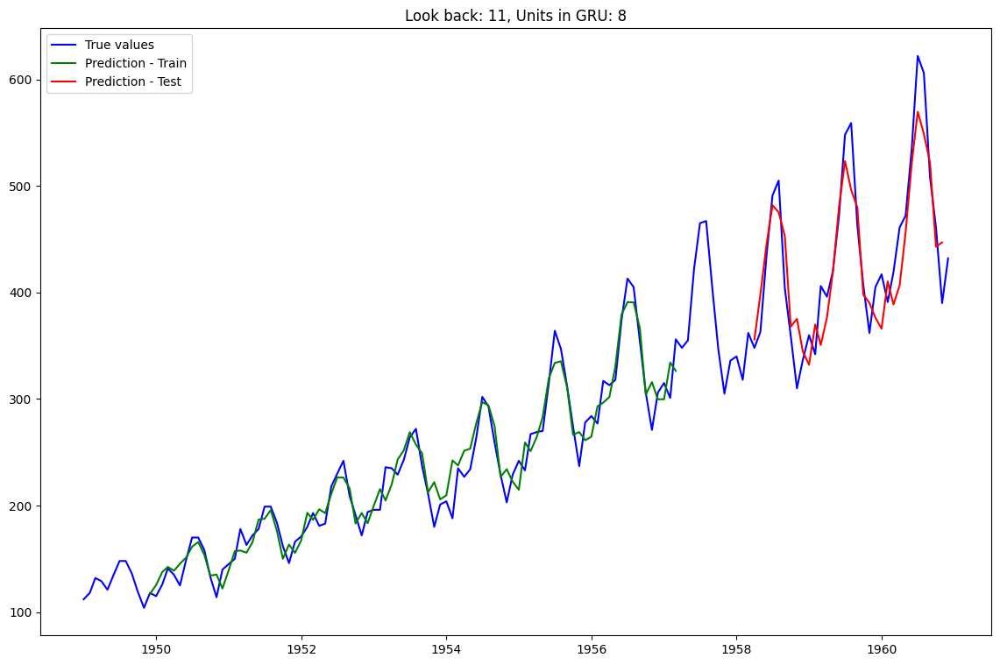

Epoch 1/100
87/87 [==============================] - 3s 3ms/step - loss: 0.0226
Epoch 2/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0130
Epoch 3/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0097
Epoch 4/100
87/87 [==============================] - 0s 5ms/step - loss: 0.0085
Epoch 5/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0070
Epoch 6/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0065
Epoch 7/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0056
Epoch 8/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0046
Epoch 9/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0047
Epoch 10/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0041
Epoch 11/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 12/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0037
Epoch 13/100
87/87 [=================

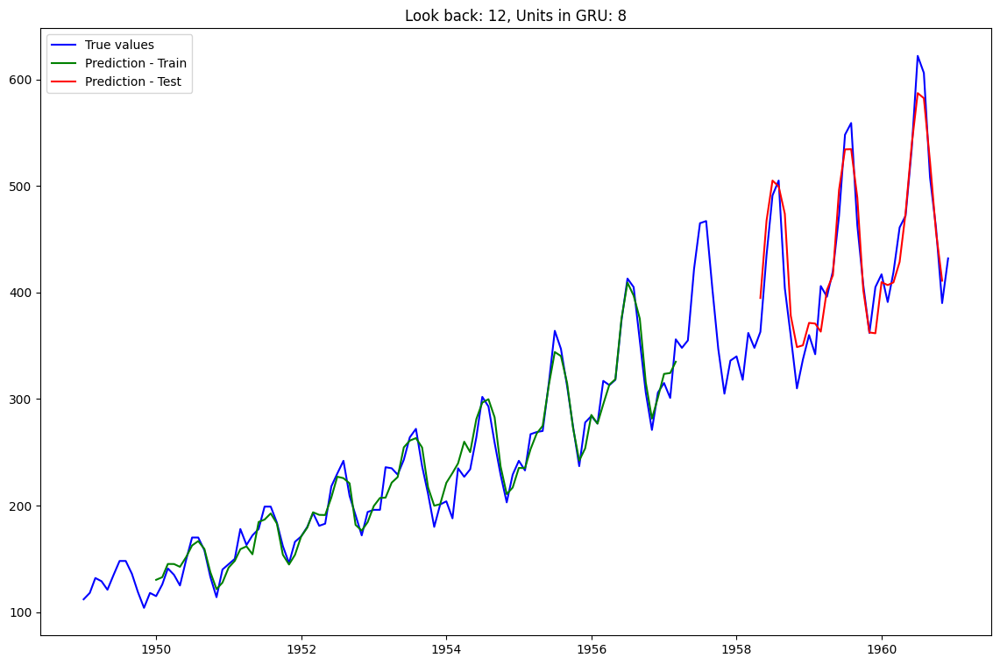

Epoch 1/100
98/98 [==============================] - 3s 4ms/step - loss: 0.1036
Epoch 2/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0414
Epoch 3/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0328
Epoch 4/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0271
Epoch 5/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0215
Epoch 6/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0176
Epoch 7/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0142
Epoch 8/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0110
Epoch 9/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0091
Epoch 10/100
98/98 [==============================] - 0s 5ms/step - loss: 0.0078
Epoch 11/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0069
Epoch 12/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0065
Epoch 13/100
98/98 [=================

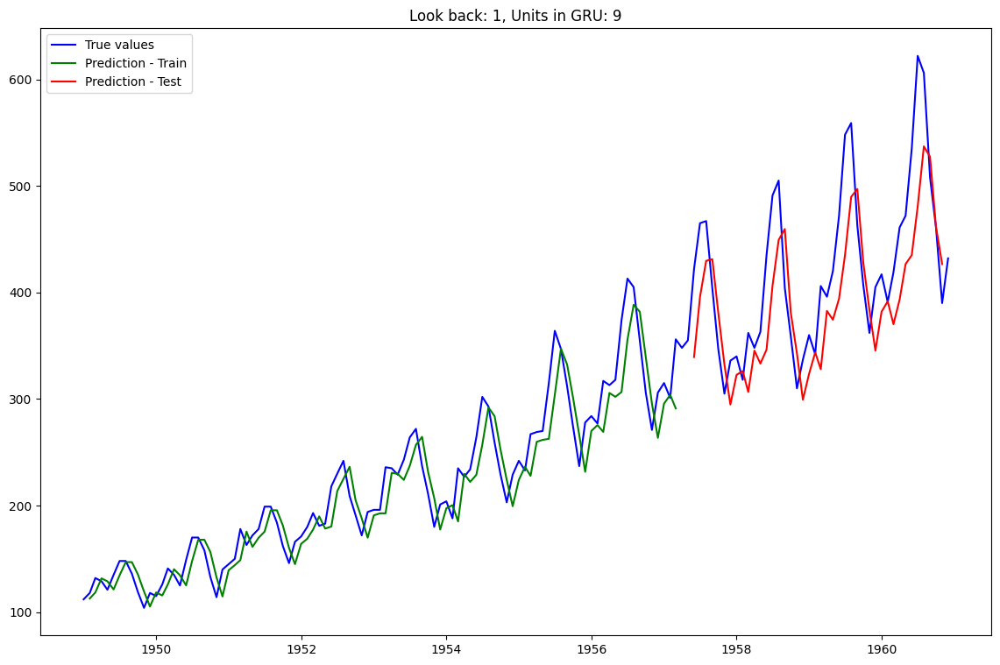

Epoch 1/100
97/97 [==============================] - 3s 4ms/step - loss: 0.0616
Epoch 2/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0219
Epoch 3/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0175
Epoch 4/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0144
Epoch 5/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0128
Epoch 6/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0111
Epoch 7/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0108
Epoch 8/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0101
Epoch 9/100
97/97 [==============================] - 0s 5ms/step - loss: 0.0100
Epoch 10/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 11/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0100
Epoch 12/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0094
Epoch 13/100
97/97 [=================

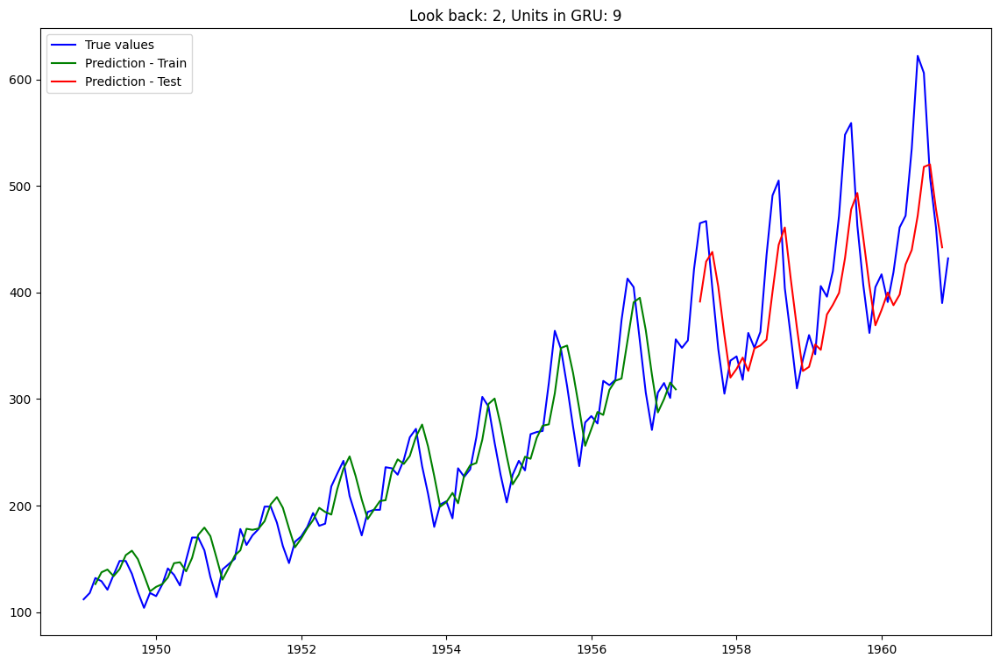

Epoch 1/100
96/96 [==============================] - 3s 4ms/step - loss: 0.0128
Epoch 2/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0104
Epoch 3/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0096
Epoch 4/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0093
Epoch 5/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0094
Epoch 6/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0088
Epoch 7/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0083
Epoch 8/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0082
Epoch 9/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0078
Epoch 10/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0073
Epoch 11/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0072
Epoch 12/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0073
Epoch 13/100
96/96 [=================

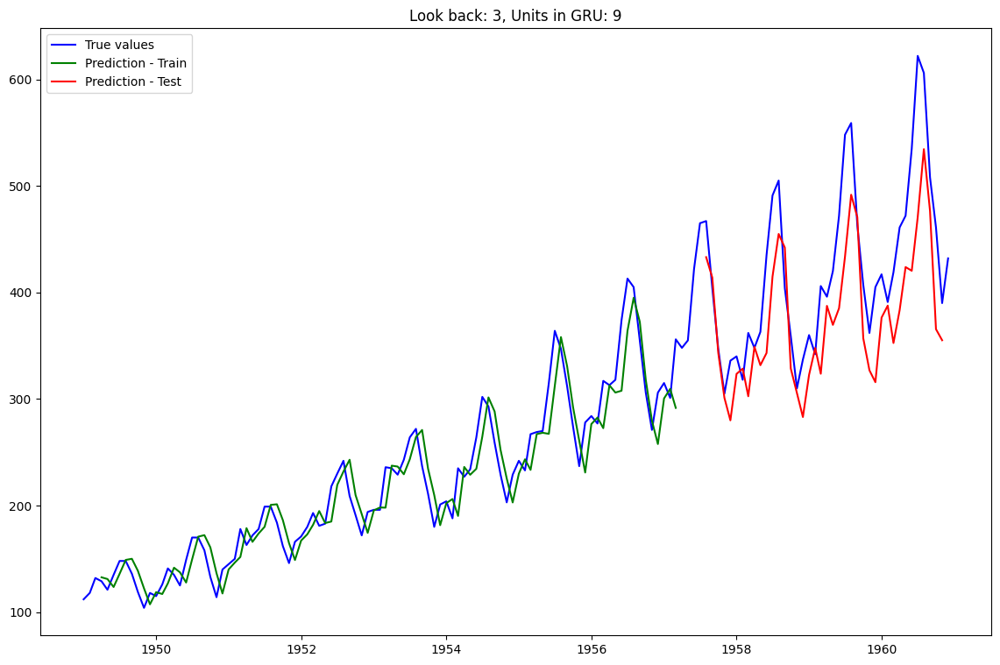

Epoch 1/100
95/95 [==============================] - 3s 3ms/step - loss: 0.0781
Epoch 2/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0197
Epoch 3/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0161
Epoch 4/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0128
Epoch 5/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0116
Epoch 6/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 7/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0102
Epoch 8/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0092
Epoch 9/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0094
Epoch 10/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0090
Epoch 11/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0085
Epoch 12/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0083
Epoch 13/100
95/95 [=================

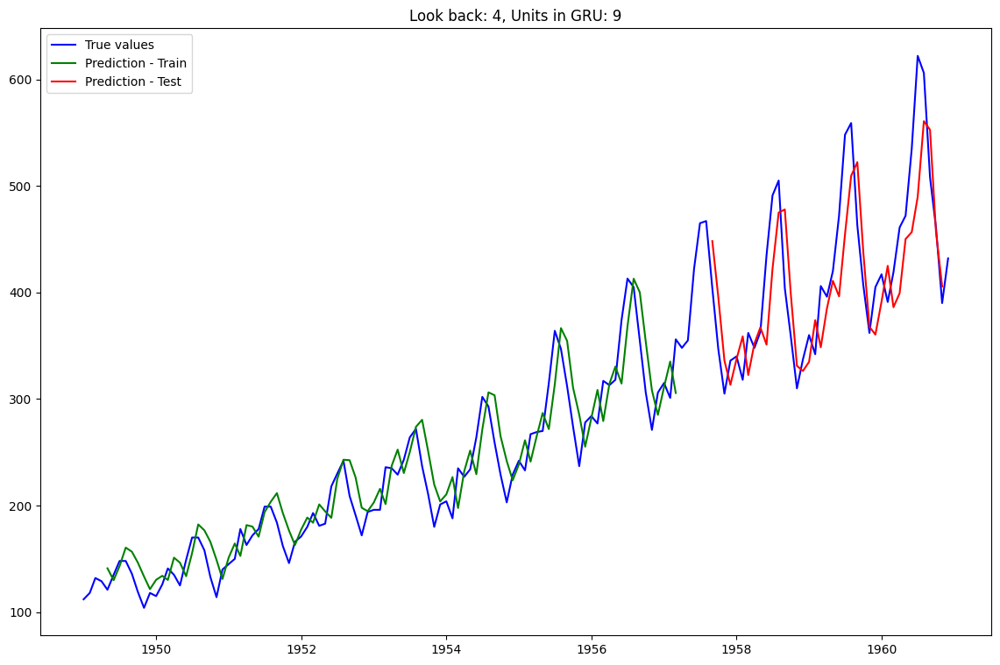

Epoch 1/100
94/94 [==============================] - 3s 4ms/step - loss: 0.0607
Epoch 2/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0214
Epoch 3/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0184
Epoch 4/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0160
Epoch 5/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0148
Epoch 6/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0145
Epoch 7/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0128
Epoch 8/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0131
Epoch 9/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0117
Epoch 10/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0119
Epoch 11/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0098
Epoch 12/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0097
Epoch 13/100
94/94 [=================

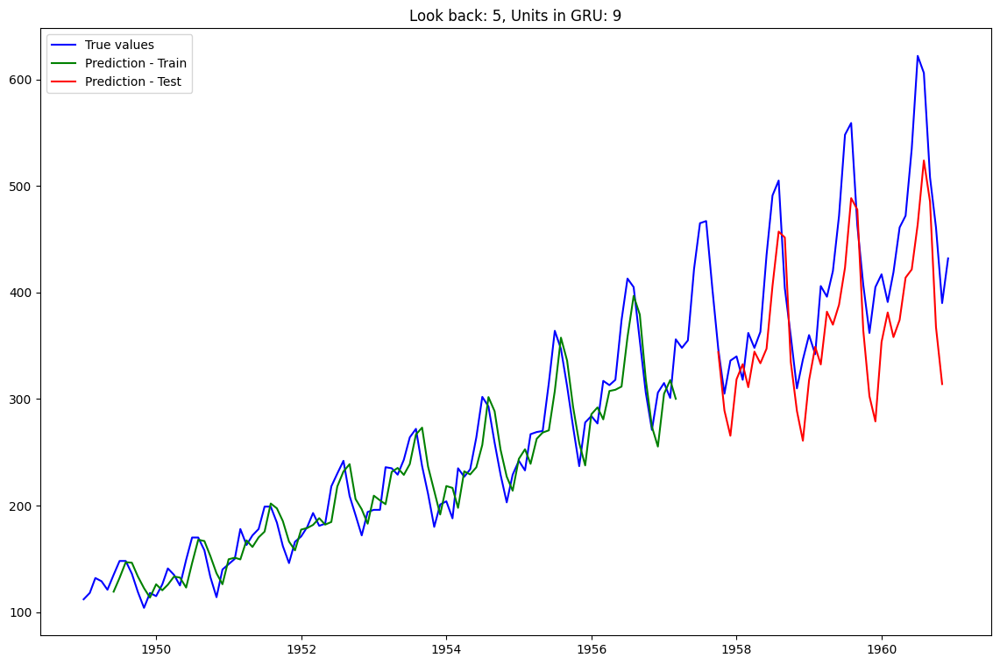

Epoch 1/100
93/93 [==============================] - 3s 4ms/step - loss: 0.0682
Epoch 2/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0244
Epoch 3/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0216
Epoch 4/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0191
Epoch 5/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0173
Epoch 6/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0158
Epoch 7/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0138
Epoch 8/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0134
Epoch 9/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0118
Epoch 10/100
93/93 [==============================] - 0s 5ms/step - loss: 0.0118
Epoch 11/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0103
Epoch 12/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0104
Epoch 13/100
93/93 [=================

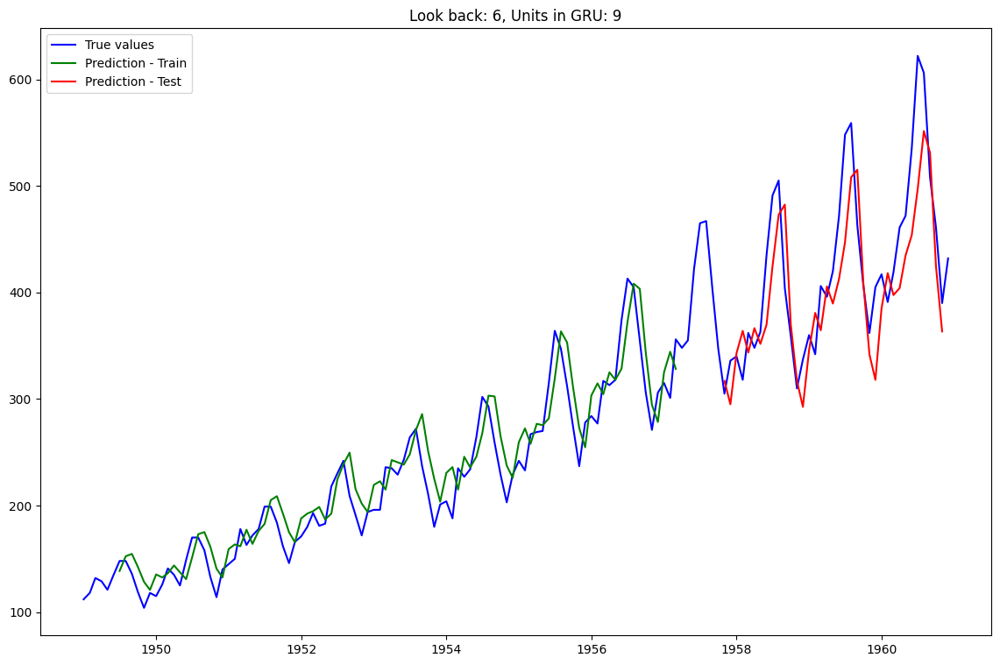

Epoch 1/100
92/92 [==============================] - 3s 4ms/step - loss: 0.1281
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0253
Epoch 3/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0202
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0185
Epoch 5/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0160
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0149
Epoch 7/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0142
Epoch 8/100
92/92 [==============================] - 0s 5ms/step - loss: 0.0128
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0124
Epoch 10/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0114
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0114
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 13/100
92/92 [=================

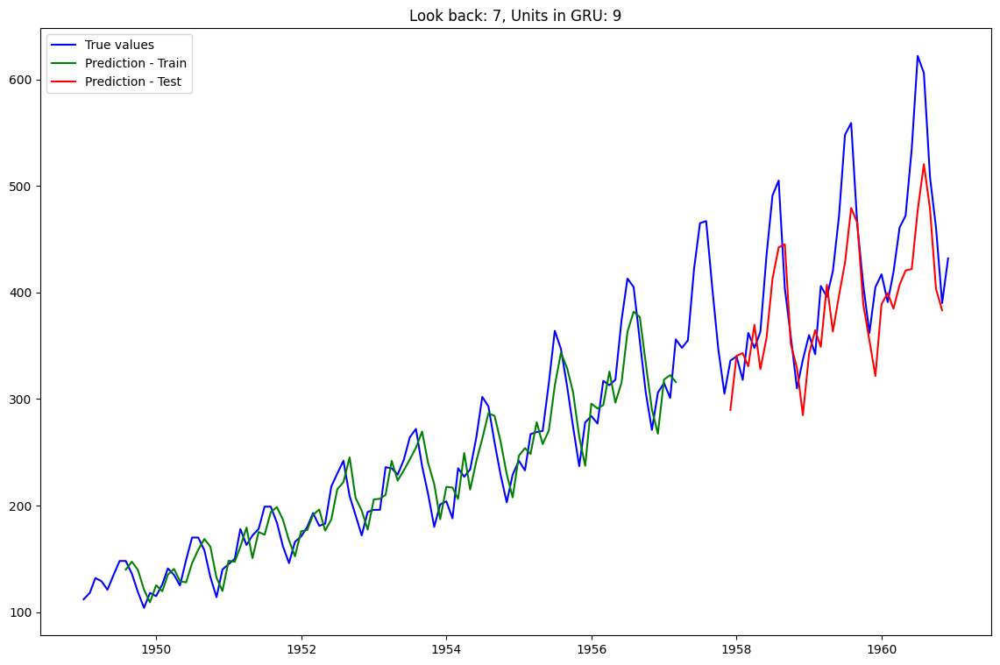

Epoch 1/100
91/91 [==============================] - 3s 3ms/step - loss: 0.0840
Epoch 2/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0156
Epoch 3/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0135
Epoch 4/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0114
Epoch 5/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 6/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 7/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0095
Epoch 8/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0089
Epoch 9/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0090
Epoch 10/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0089
Epoch 11/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0085
Epoch 12/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 13/100
91/91 [=================

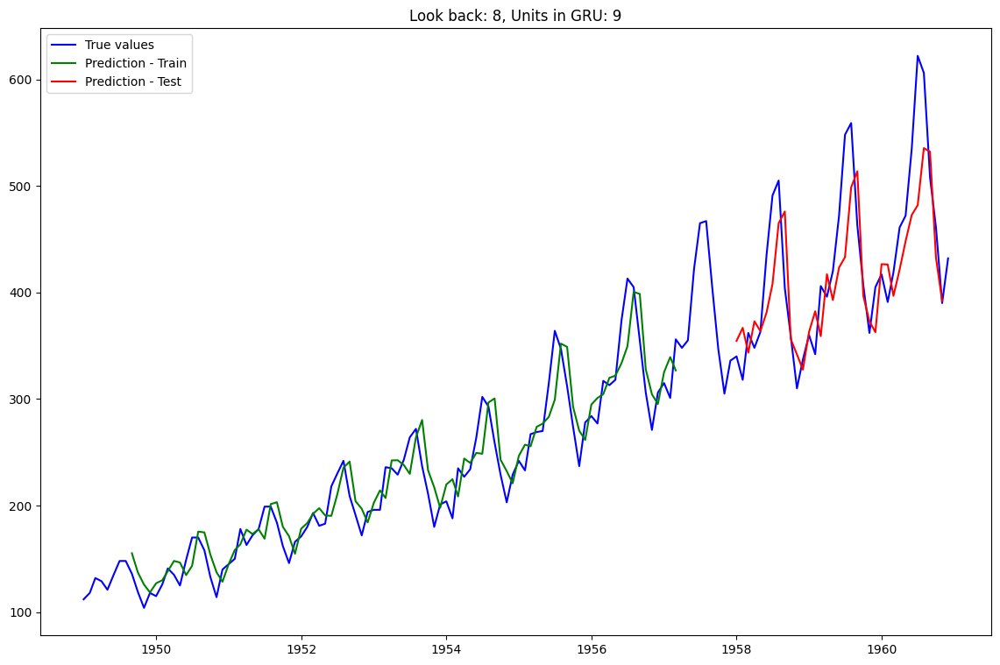

Epoch 1/100
90/90 [==============================] - 3s 4ms/step - loss: 0.0687
Epoch 2/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0158
Epoch 3/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0134
Epoch 4/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0131
Epoch 5/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0118
Epoch 6/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0115
Epoch 7/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 8/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 9/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0102
Epoch 10/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0102
Epoch 11/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0094
Epoch 12/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0095
Epoch 13/100
90/90 [=================

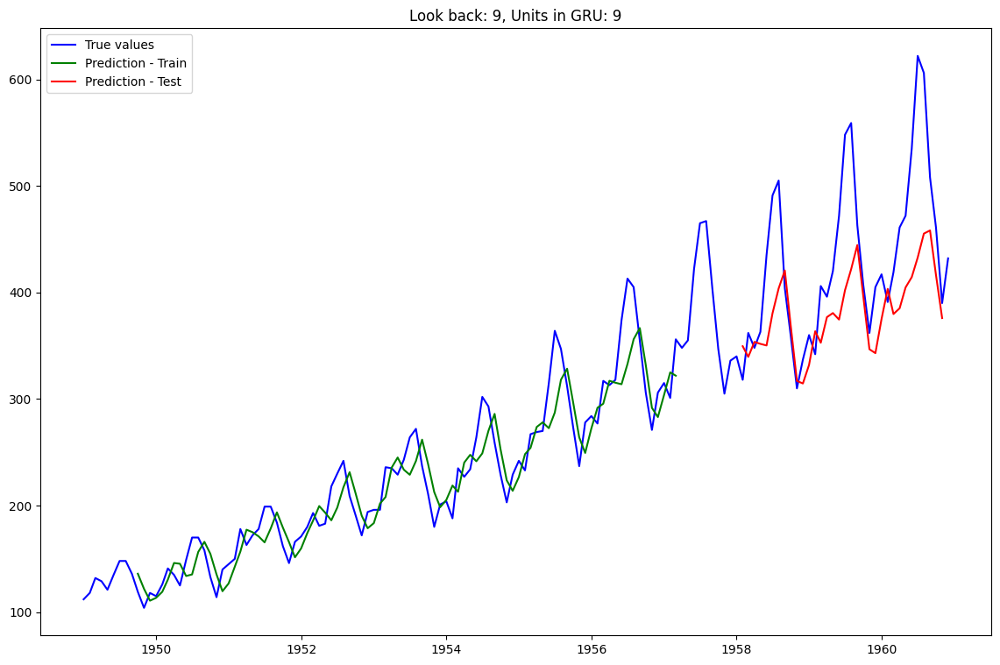

Epoch 1/100
89/89 [==============================] - 3s 4ms/step - loss: 0.1380
Epoch 2/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0223
Epoch 3/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 4/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0172
Epoch 5/100
89/89 [==============================] - 0s 5ms/step - loss: 0.0154
Epoch 6/100
89/89 [==============================] - 0s 5ms/step - loss: 0.0138
Epoch 7/100
89/89 [==============================] - 0s 5ms/step - loss: 0.0131
Epoch 8/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0123
Epoch 9/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0119
Epoch 10/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0110
Epoch 11/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0108
Epoch 12/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0096
Epoch 13/100
89/89 [=================

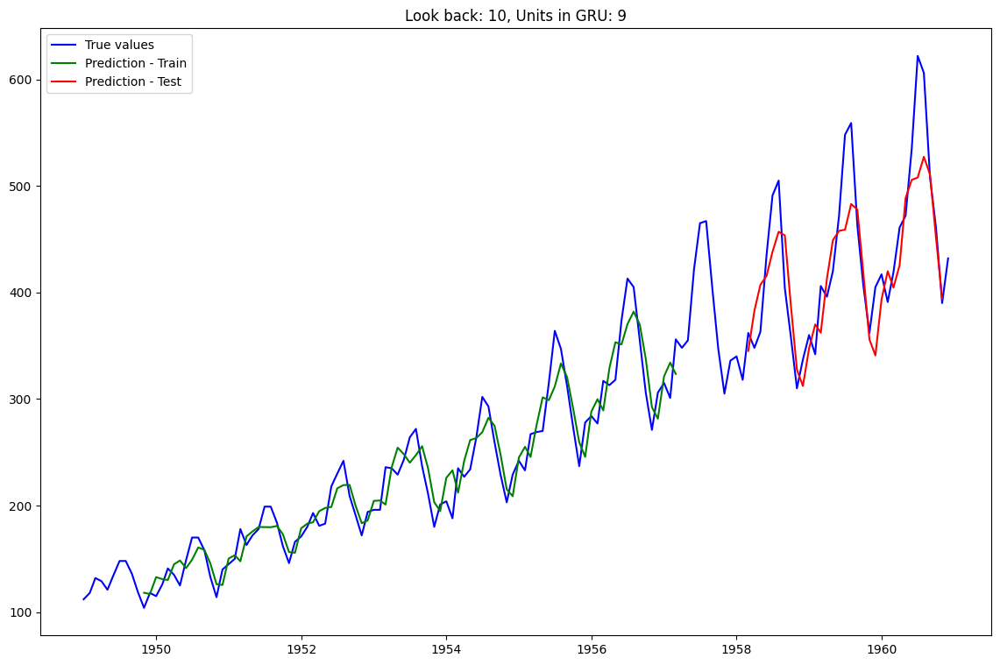

Epoch 1/100
88/88 [==============================] - 3s 4ms/step - loss: 0.0315
Epoch 2/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0150
Epoch 3/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0132
Epoch 4/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0126
Epoch 5/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0109
Epoch 6/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 7/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0093
Epoch 8/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0087
Epoch 9/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0077
Epoch 10/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0070
Epoch 11/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0067
Epoch 12/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0067
Epoch 13/100
88/88 [=================

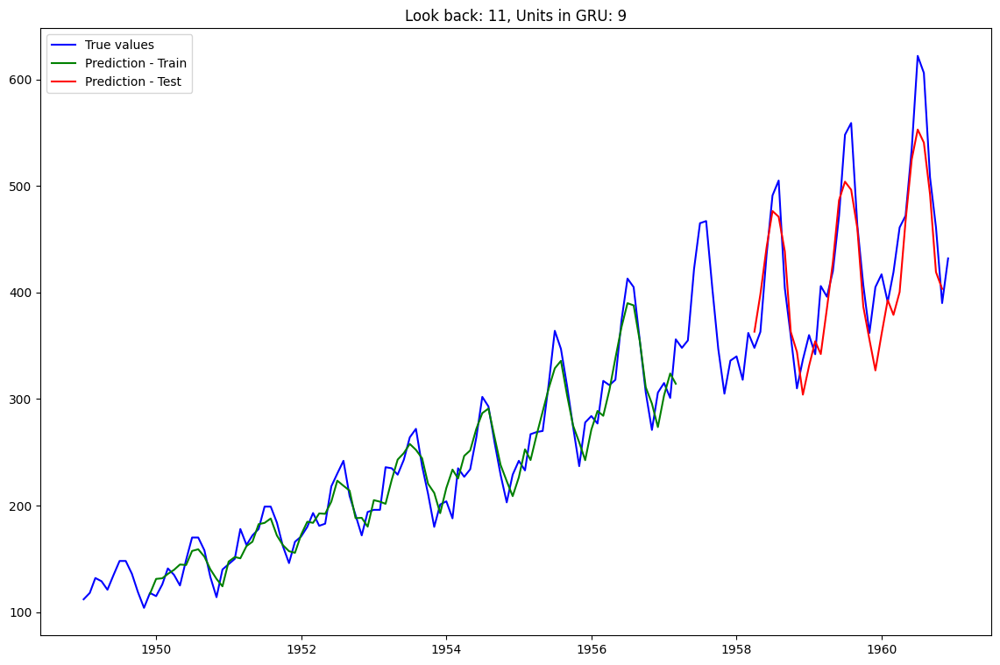

Epoch 1/100
87/87 [==============================] - 3s 5ms/step - loss: 0.1073
Epoch 2/100
87/87 [==============================] - 0s 5ms/step - loss: 0.0072
Epoch 3/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0057
Epoch 4/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0046
Epoch 5/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0042
Epoch 6/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0034
Epoch 7/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0031
Epoch 8/100
87/87 [==============================] - 0s 5ms/step - loss: 0.0030
Epoch 9/100
87/87 [==============================] - 0s 5ms/step - loss: 0.0028
Epoch 10/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0026
Epoch 11/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0030
Epoch 12/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0024
Epoch 13/100
87/87 [=================

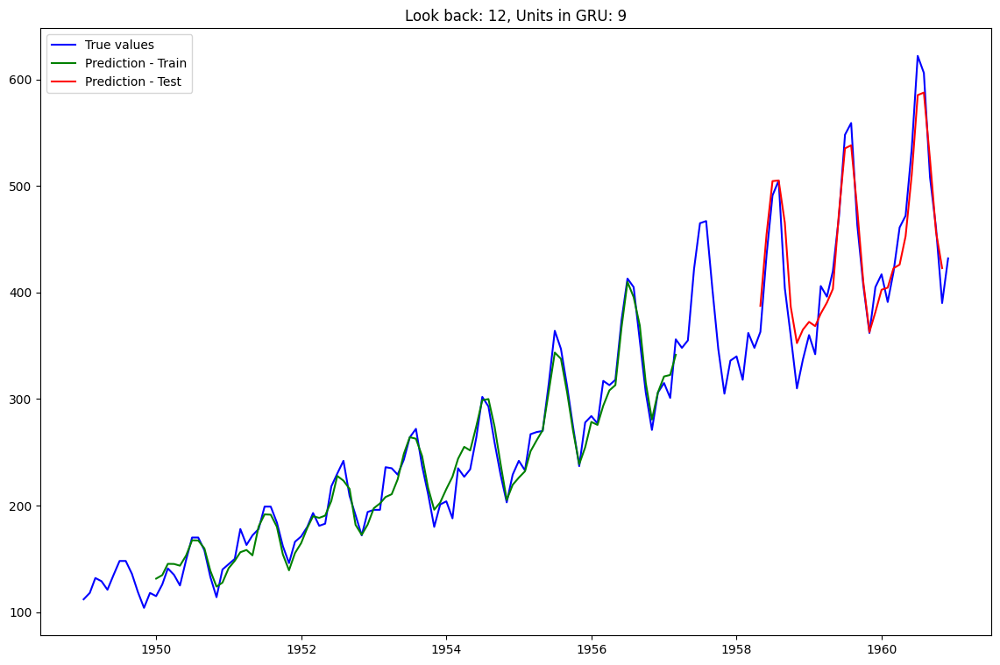

Epoch 1/100
98/98 [==============================] - 3s 4ms/step - loss: 0.0585
Epoch 2/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0243
Epoch 3/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0189
Epoch 4/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0147
Epoch 5/100
98/98 [==============================] - 0s 5ms/step - loss: 0.0114
Epoch 6/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0092
Epoch 7/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0078
Epoch 8/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0067
Epoch 9/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 10/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0062
Epoch 11/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0059
Epoch 12/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 13/100
98/98 [=================

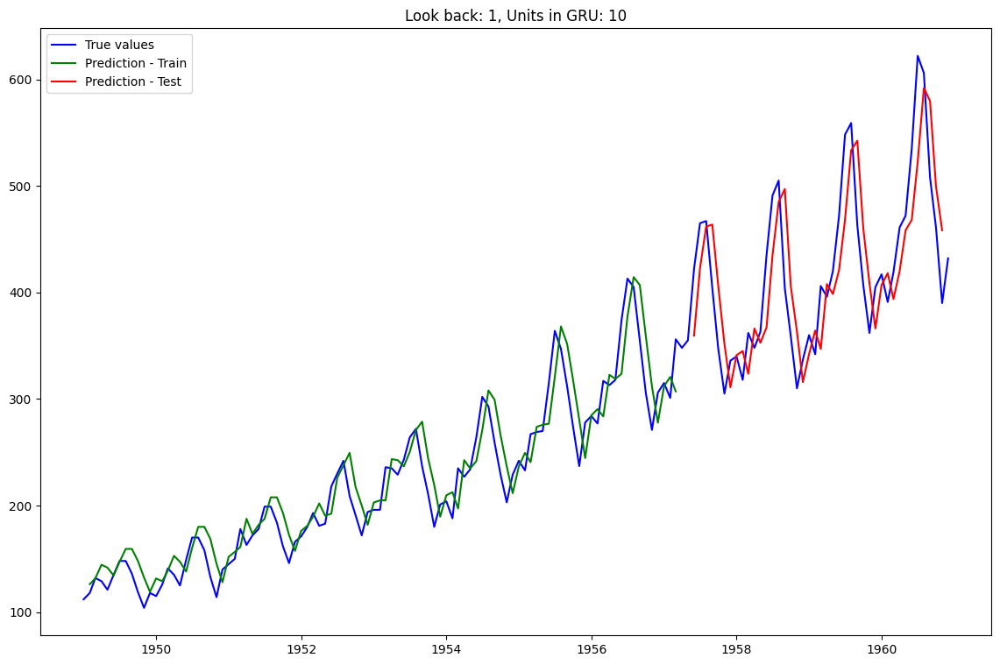

Epoch 1/100
97/97 [==============================] - 3s 4ms/step - loss: 0.0515
Epoch 2/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0173
Epoch 3/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0142
Epoch 4/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0117
Epoch 5/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0104
Epoch 6/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0093
Epoch 7/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0091
Epoch 8/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0085
Epoch 9/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0085
Epoch 10/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0081
Epoch 11/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0083
Epoch 12/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0081
Epoch 13/100
97/97 [=================

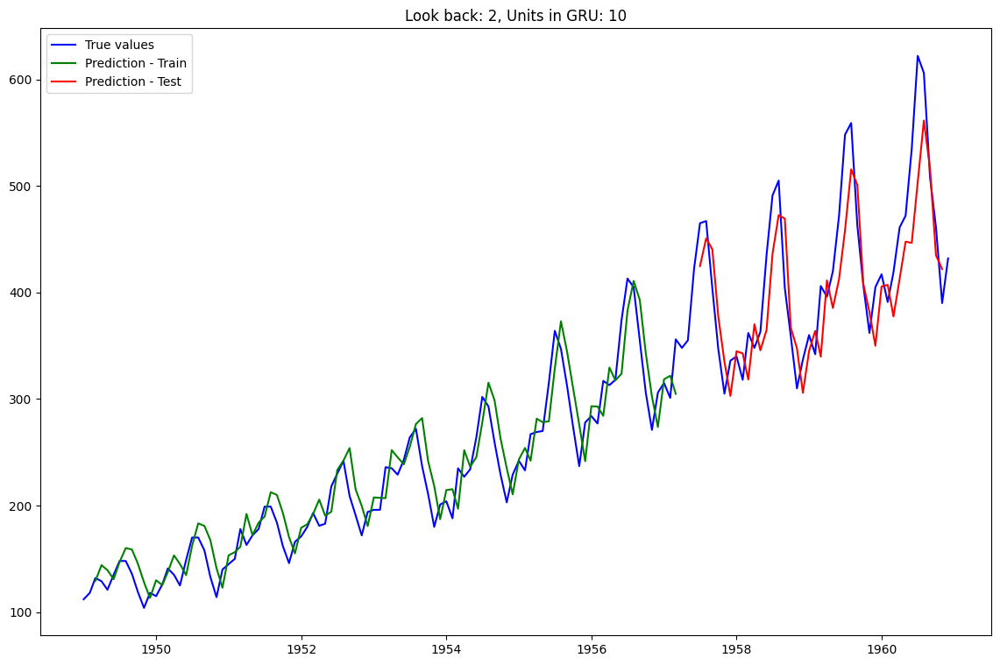

Epoch 1/100
96/96 [==============================] - 3s 4ms/step - loss: 0.1772
Epoch 2/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0451
Epoch 3/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0319
Epoch 4/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0258
Epoch 5/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0209
Epoch 6/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0177
Epoch 7/100
96/96 [==============================] - 0s 5ms/step - loss: 0.0162
Epoch 8/100
96/96 [==============================] - 0s 5ms/step - loss: 0.0145
Epoch 9/100
96/96 [==============================] - 0s 5ms/step - loss: 0.0138
Epoch 10/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0133
Epoch 11/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0122
Epoch 12/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0124
Epoch 13/100
96/96 [=================

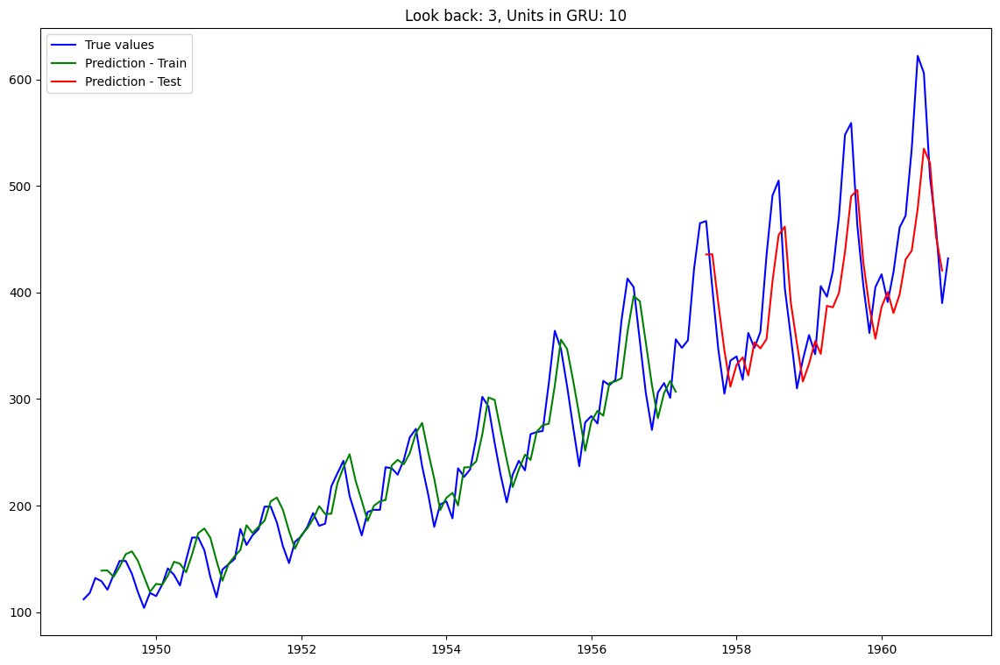

Epoch 1/100
95/95 [==============================] - 3s 4ms/step - loss: 0.1229
Epoch 2/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0290
Epoch 3/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0221
Epoch 4/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0182
Epoch 5/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0153
Epoch 6/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0133
Epoch 7/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0125
Epoch 8/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0117
Epoch 9/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0117
Epoch 10/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0111
Epoch 11/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0103
Epoch 12/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 13/100
95/95 [=================

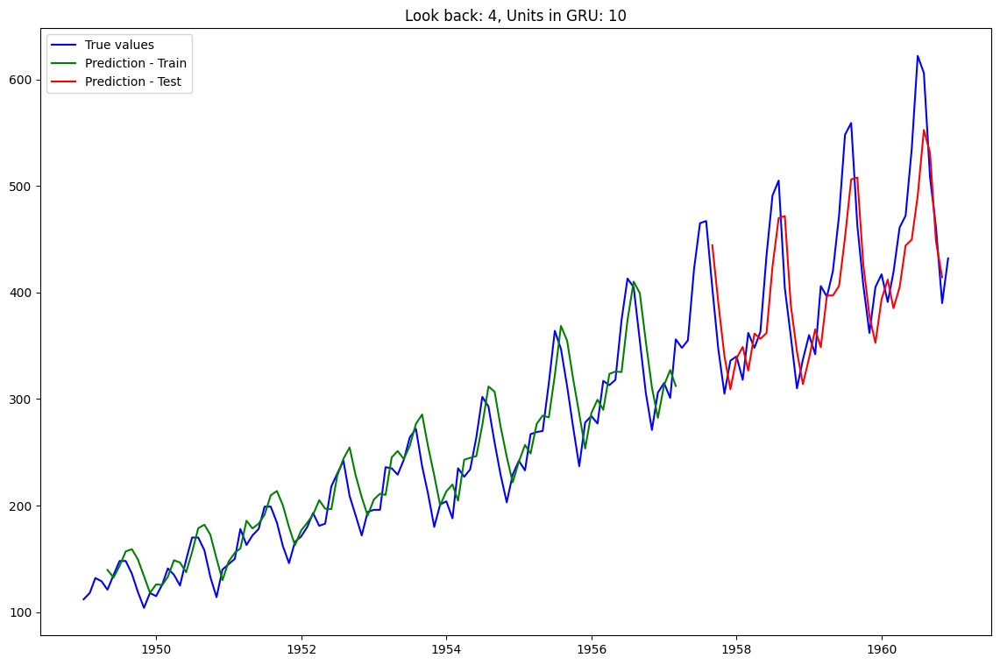

Epoch 1/100
94/94 [==============================] - 3s 4ms/step - loss: 0.1044
Epoch 2/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0229
Epoch 3/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0187
Epoch 4/100
94/94 [==============================] - 0s 5ms/step - loss: 0.0158
Epoch 5/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0141
Epoch 6/100
94/94 [==============================] - 0s 5ms/step - loss: 0.0129
Epoch 7/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0125
Epoch 8/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0118
Epoch 9/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0113
Epoch 10/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0108
Epoch 11/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0112
Epoch 12/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0105
Epoch 13/100
94/94 [=================

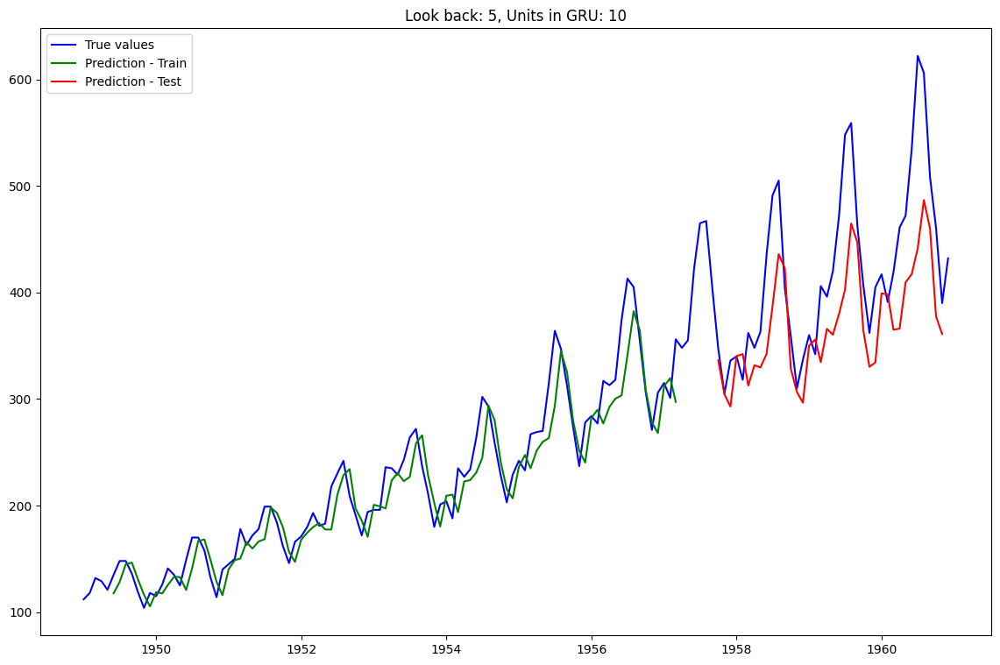

Epoch 1/100
93/93 [==============================] - 3s 4ms/step - loss: 0.0420
Epoch 2/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0178
Epoch 3/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0167
Epoch 4/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0142
Epoch 5/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0139
Epoch 6/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0130
Epoch 7/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0127
Epoch 8/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0121
Epoch 9/100
93/93 [==============================] - 0s 5ms/step - loss: 0.0118
Epoch 10/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0115
Epoch 11/100
93/93 [==============================] - 0s 5ms/step - loss: 0.0115
Epoch 12/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0099
Epoch 13/100
93/93 [=================

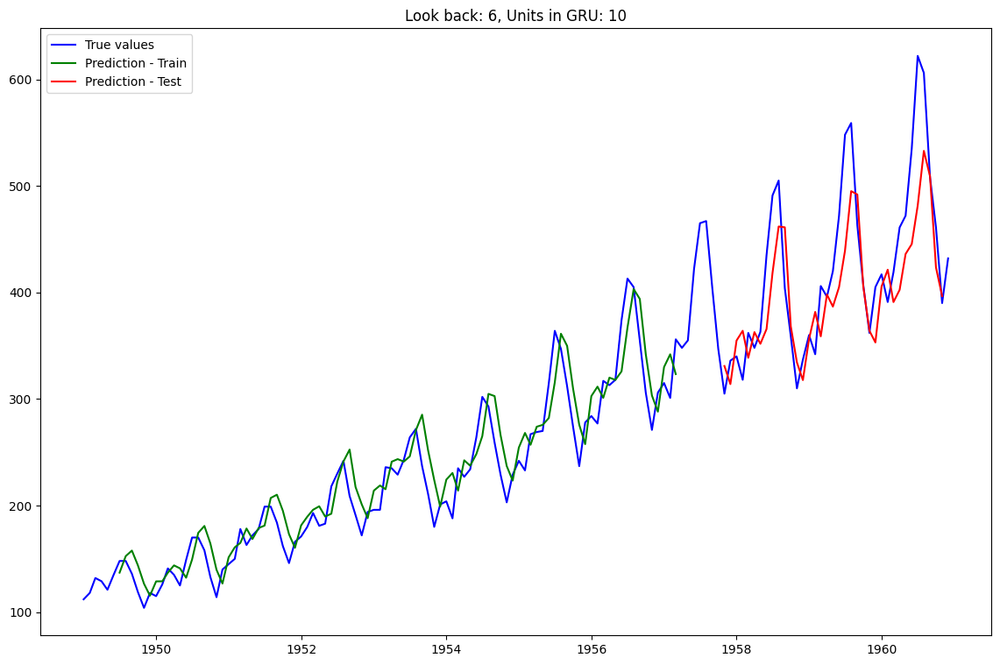

Epoch 1/100
92/92 [==============================] - 3s 4ms/step - loss: 0.2057
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0427
Epoch 3/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0267
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0228
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0198
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0176
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0166
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0148
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0143
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0134
Epoch 11/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0130
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0130
Epoch 13/100
92/92 [=================

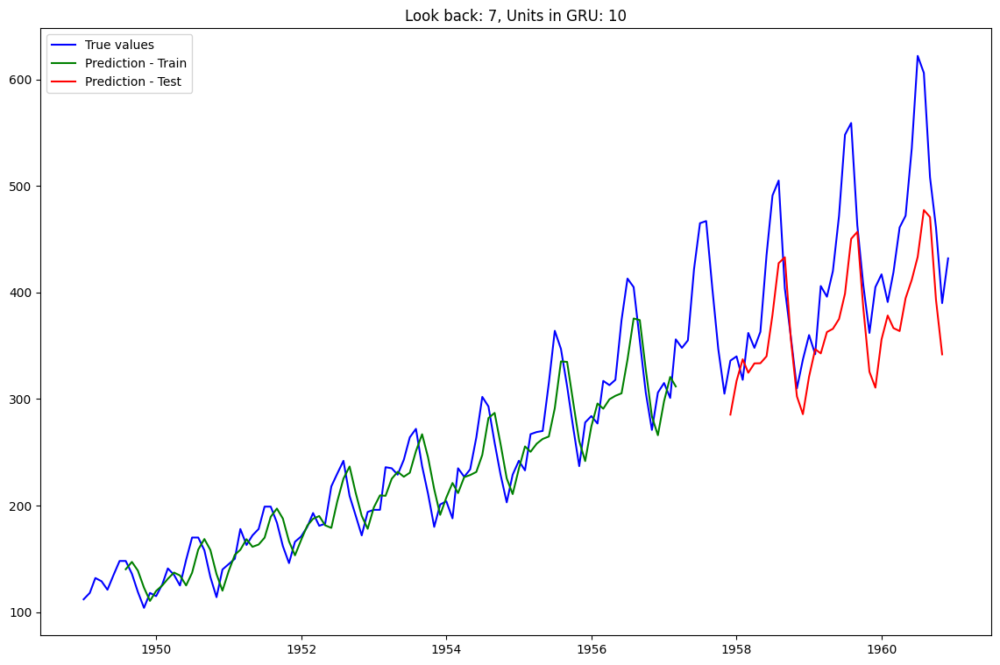

Epoch 1/100
91/91 [==============================] - 3s 3ms/step - loss: 0.0753
Epoch 2/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0210
Epoch 3/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0184
Epoch 4/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0174
Epoch 5/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0165
Epoch 6/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0156
Epoch 7/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0148
Epoch 8/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0141
Epoch 9/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0138
Epoch 10/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0129
Epoch 11/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0131
Epoch 12/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0132
Epoch 13/100
91/91 [=================

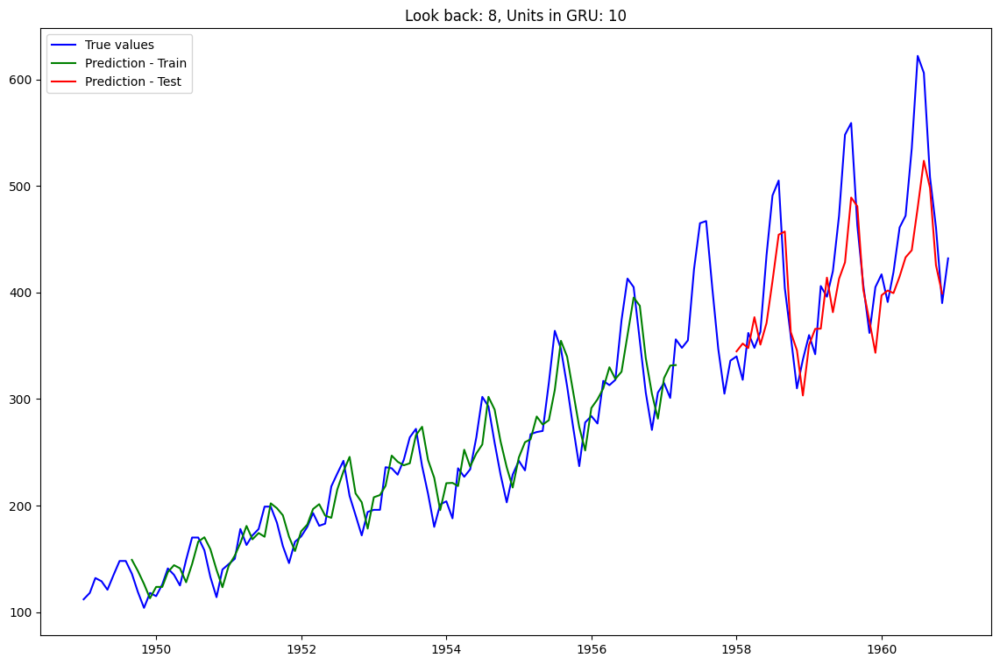

Epoch 1/100
90/90 [==============================] - 3s 4ms/step - loss: 0.0266
Epoch 2/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0173
Epoch 3/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0154
Epoch 4/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0148
Epoch 5/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0139
Epoch 6/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0133
Epoch 7/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0122
Epoch 8/100
90/90 [==============================] - 0s 5ms/step - loss: 0.0115
Epoch 9/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0107
Epoch 10/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0102
Epoch 11/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 12/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0091
Epoch 13/100
90/90 [=================

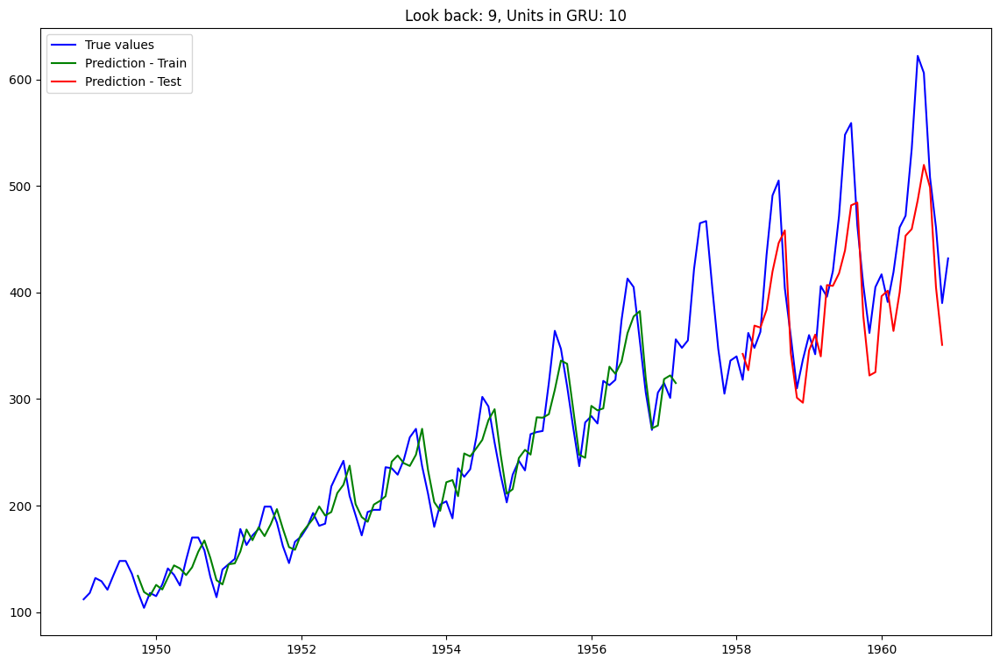

Epoch 1/100
89/89 [==============================] - 3s 4ms/step - loss: 0.0767
Epoch 2/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0193
Epoch 3/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0169
Epoch 4/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0151
Epoch 5/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0137
Epoch 6/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0126
Epoch 7/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0108
Epoch 8/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0104
Epoch 9/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 10/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0087
Epoch 11/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0083
Epoch 12/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0077
Epoch 13/100
89/89 [=================

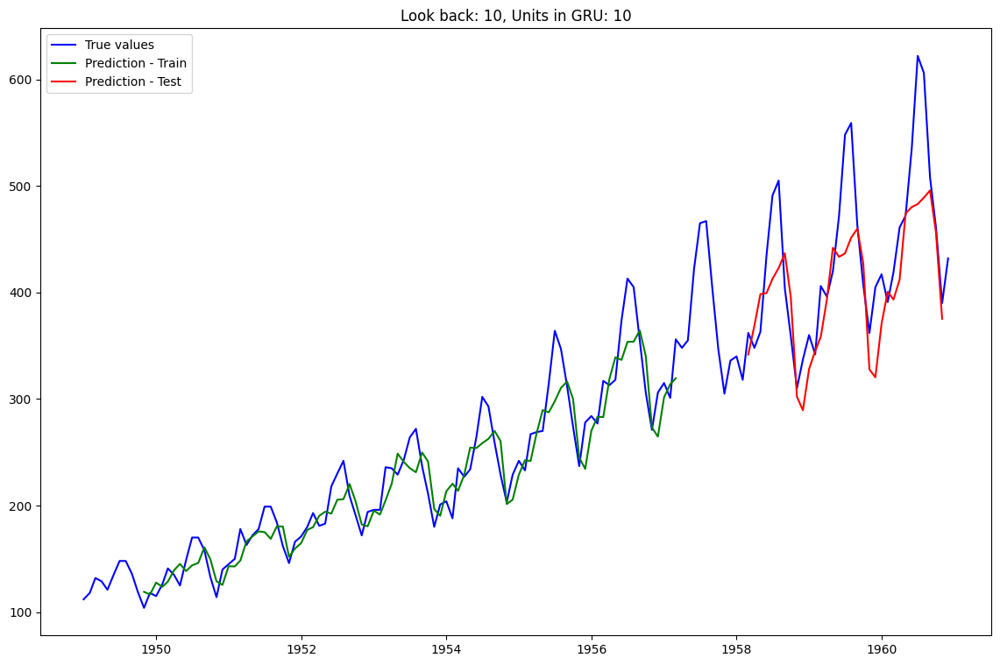

Epoch 1/100
88/88 [==============================] - 3s 4ms/step - loss: 0.0356
Epoch 2/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0179
Epoch 3/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0177
Epoch 4/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0139
Epoch 5/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0136
Epoch 6/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0104
Epoch 7/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0091
Epoch 8/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 9/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0081
Epoch 10/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0074
Epoch 11/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0060
Epoch 12/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0059
Epoch 13/100
88/88 [=================

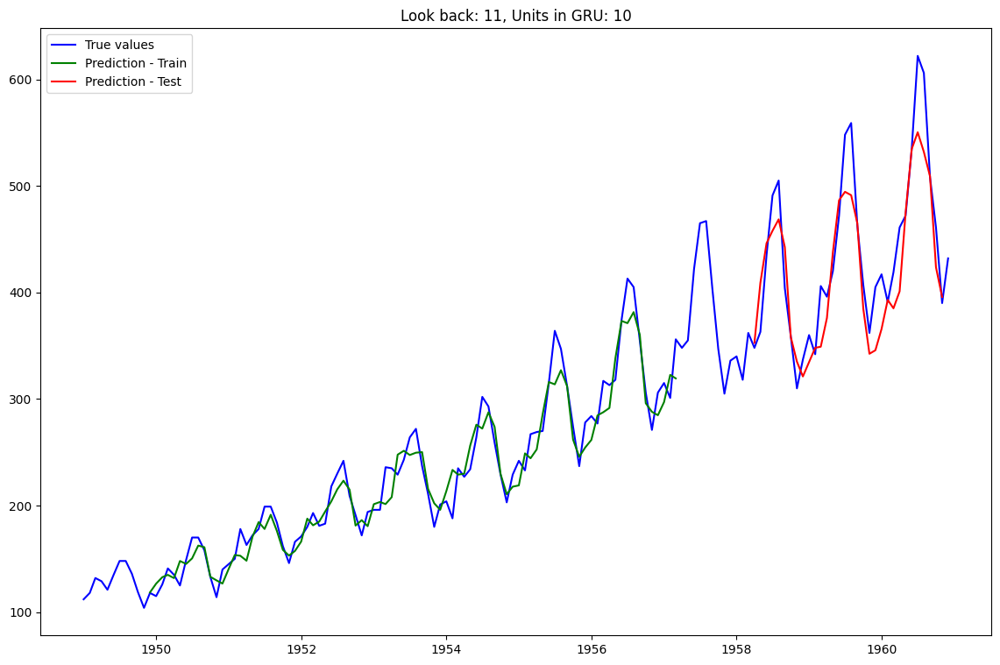

Epoch 1/100
87/87 [==============================] - 3s 4ms/step - loss: 0.1426
Epoch 2/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0156
Epoch 3/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0138
Epoch 4/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0112
Epoch 5/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0096
Epoch 6/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0081
Epoch 7/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0077
Epoch 8/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0064
Epoch 9/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0055
Epoch 10/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 11/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0043
Epoch 12/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0042
Epoch 13/100
87/87 [=================

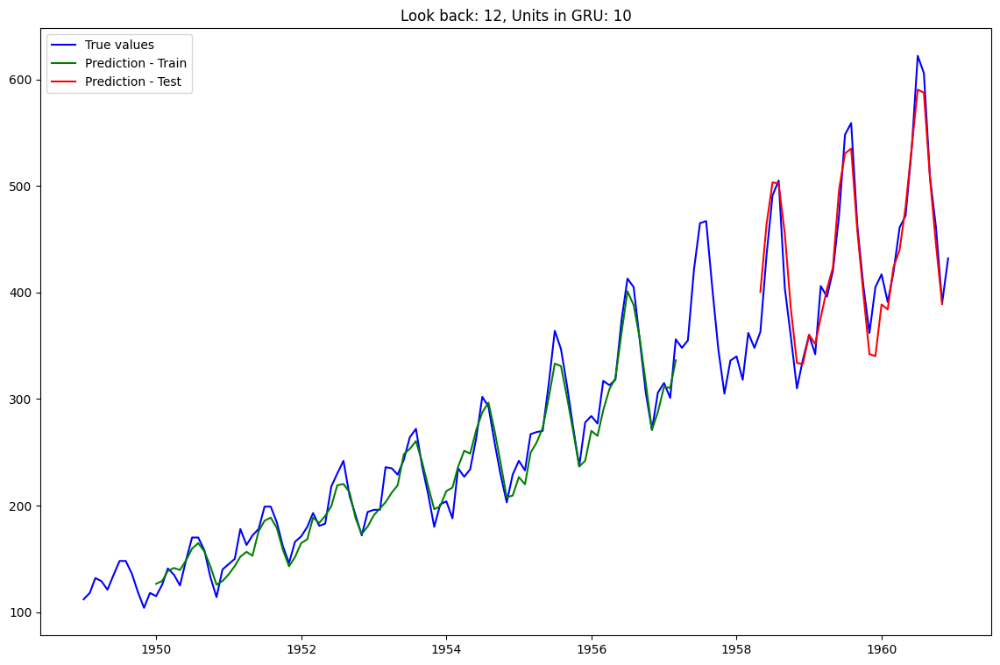

Epoch 1/100
98/98 [==============================] - 3s 3ms/step - loss: 0.0921
Epoch 2/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0363
Epoch 3/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0287
Epoch 4/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0237
Epoch 5/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0188
Epoch 6/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0154
Epoch 7/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0120
Epoch 8/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0096
Epoch 9/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0080
Epoch 10/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0069
Epoch 11/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0065
Epoch 12/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0061
Epoch 13/100
98/98 [=================

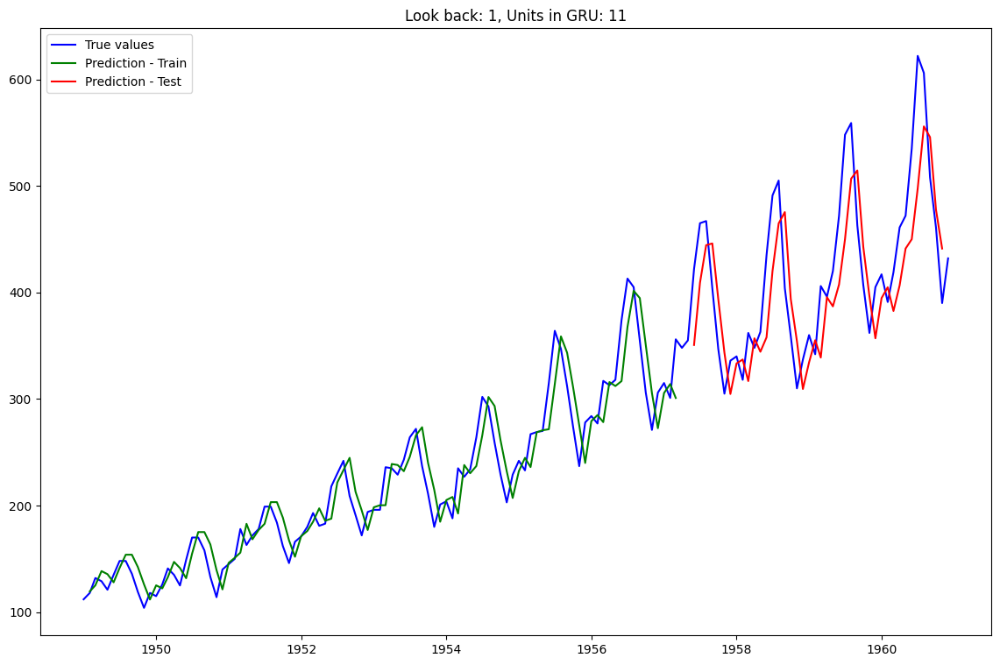

Epoch 1/100
97/97 [==============================] - 3s 4ms/step - loss: 0.1839
Epoch 2/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0532
Epoch 3/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0364
Epoch 4/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0288
Epoch 5/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0219
Epoch 6/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0168
Epoch 7/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0133
Epoch 8/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0114
Epoch 9/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 10/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0092
Epoch 11/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0090
Epoch 12/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 13/100
97/97 [=================

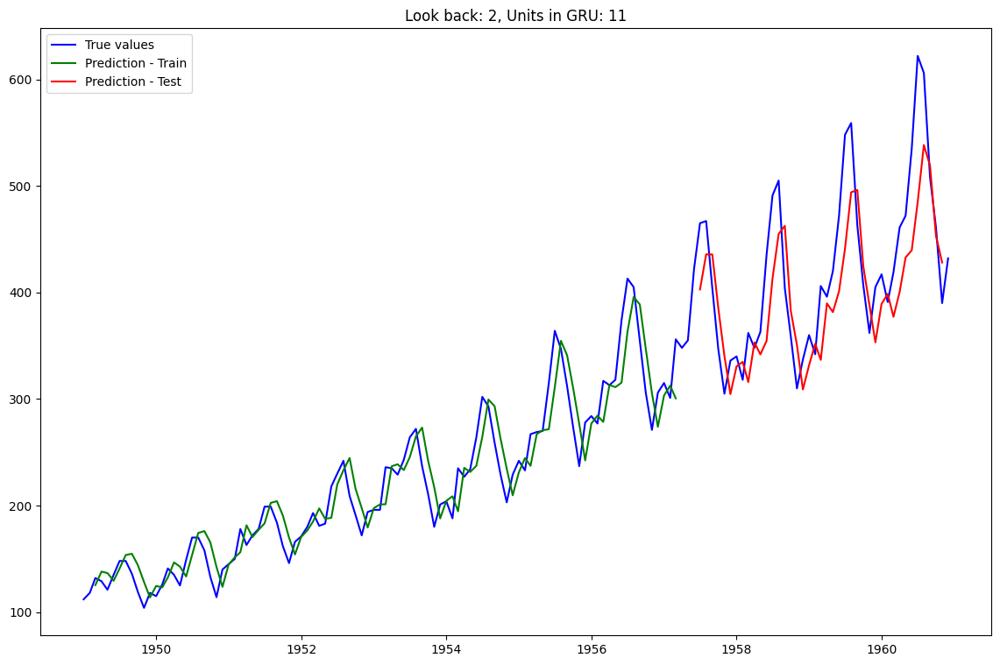

Epoch 1/100
96/96 [==============================] - 3s 3ms/step - loss: 0.0339
Epoch 2/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0168
Epoch 3/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0139
Epoch 4/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0125
Epoch 5/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0116
Epoch 6/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0110
Epoch 7/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0105
Epoch 8/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0105
Epoch 9/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0103
Epoch 10/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0096
Epoch 11/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0093
Epoch 12/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0091
Epoch 13/100
96/96 [=================

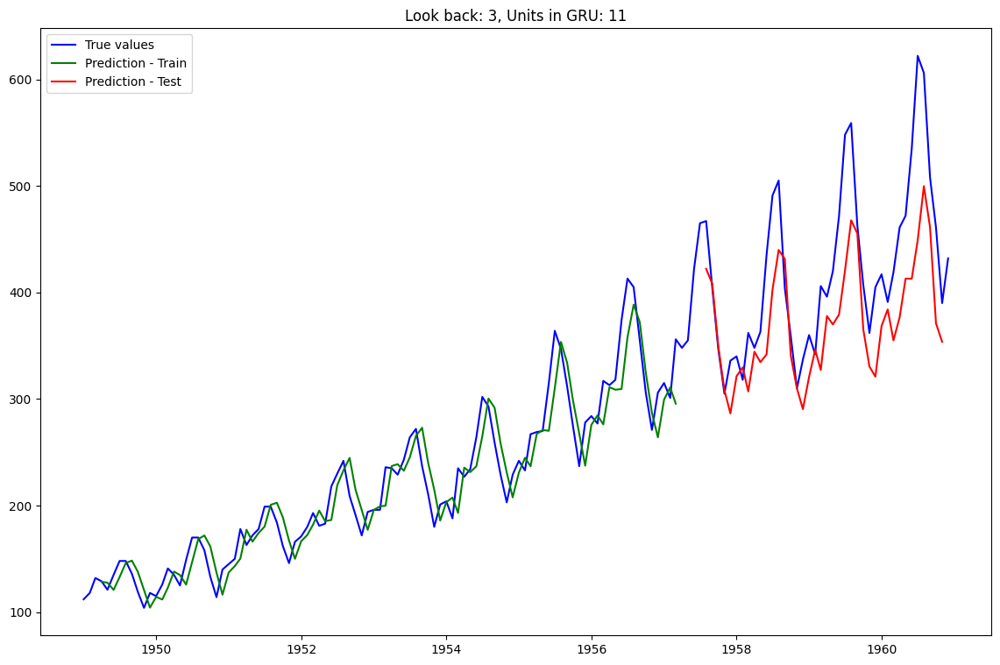

Epoch 1/100
95/95 [==============================] - 3s 4ms/step - loss: 0.0922
Epoch 2/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0245
Epoch 3/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0185
Epoch 4/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0155
Epoch 5/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0136
Epoch 6/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 7/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0113
Epoch 8/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0103
Epoch 9/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0099
Epoch 10/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0099
Epoch 11/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0096
Epoch 12/100
95/95 [==============================] - 0s 5ms/step - loss: 0.0098
Epoch 13/100
95/95 [=================

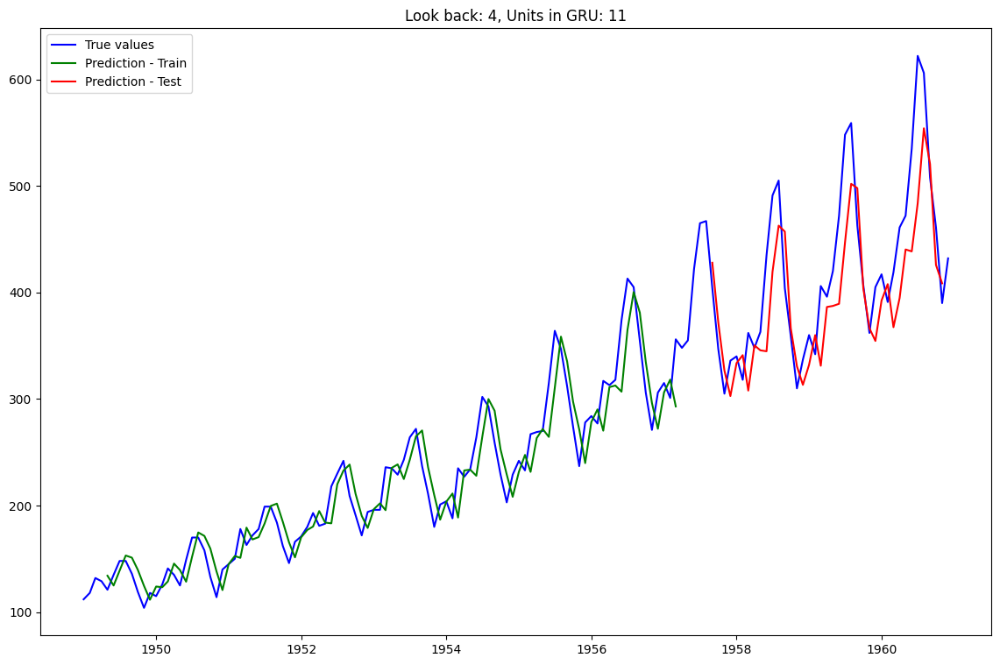

Epoch 1/100
94/94 [==============================] - 3s 4ms/step - loss: 0.0703
Epoch 2/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0227
Epoch 3/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0199
Epoch 4/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0176
Epoch 5/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0164
Epoch 6/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0151
Epoch 7/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0140
Epoch 8/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0132
Epoch 9/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0127
Epoch 10/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0123
Epoch 11/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0114
Epoch 12/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0107
Epoch 13/100
94/94 [=================

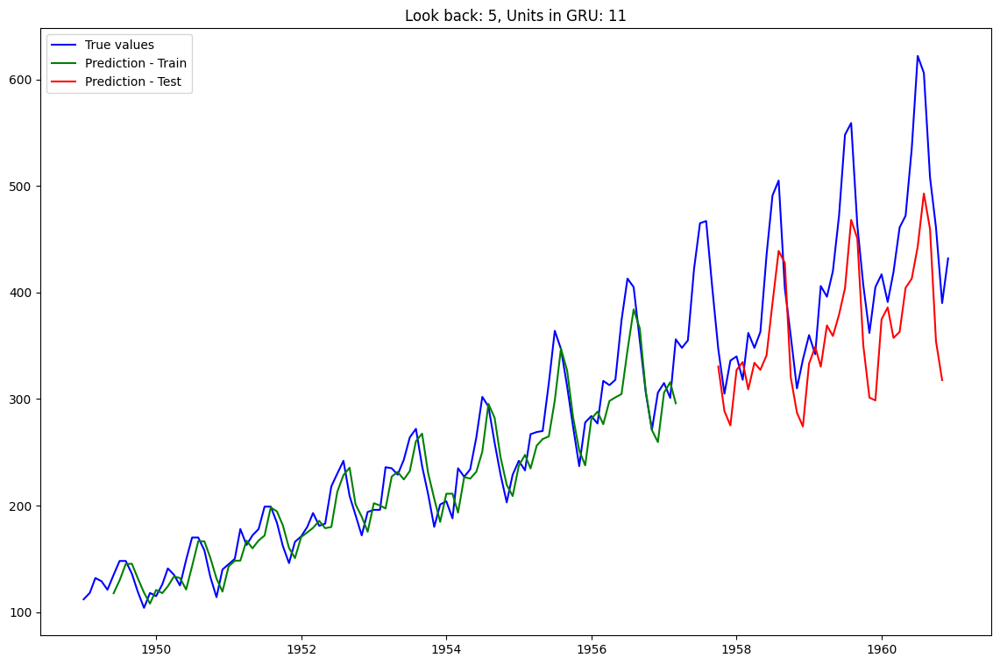

Epoch 1/100
93/93 [==============================] - 7s 4ms/step - loss: 0.0462
Epoch 2/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0127
Epoch 3/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0110
Epoch 4/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0102
Epoch 5/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0099
Epoch 6/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0096
Epoch 7/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 8/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0090
Epoch 9/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 10/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0081
Epoch 11/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0080
Epoch 12/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0077
Epoch 13/100
93/93 [=================

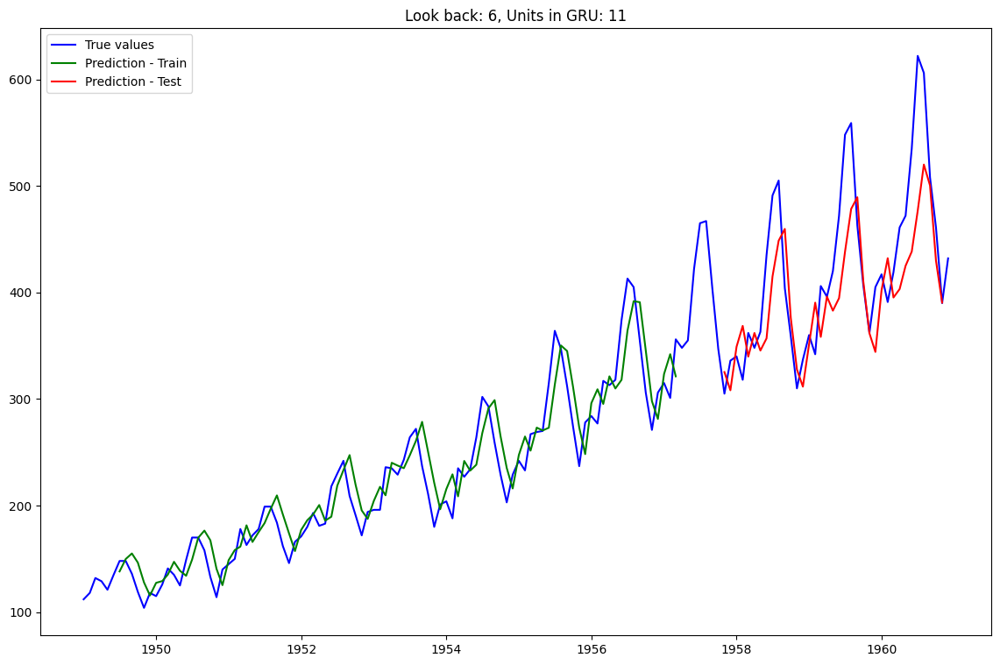

Epoch 1/100
92/92 [==============================] - 3s 5ms/step - loss: 0.1070
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0210
Epoch 3/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0172
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0148
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0131
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 7/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0119
Epoch 8/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0107
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0100
Epoch 10/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0096
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0086
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0084
Epoch 13/100
92/92 [=================

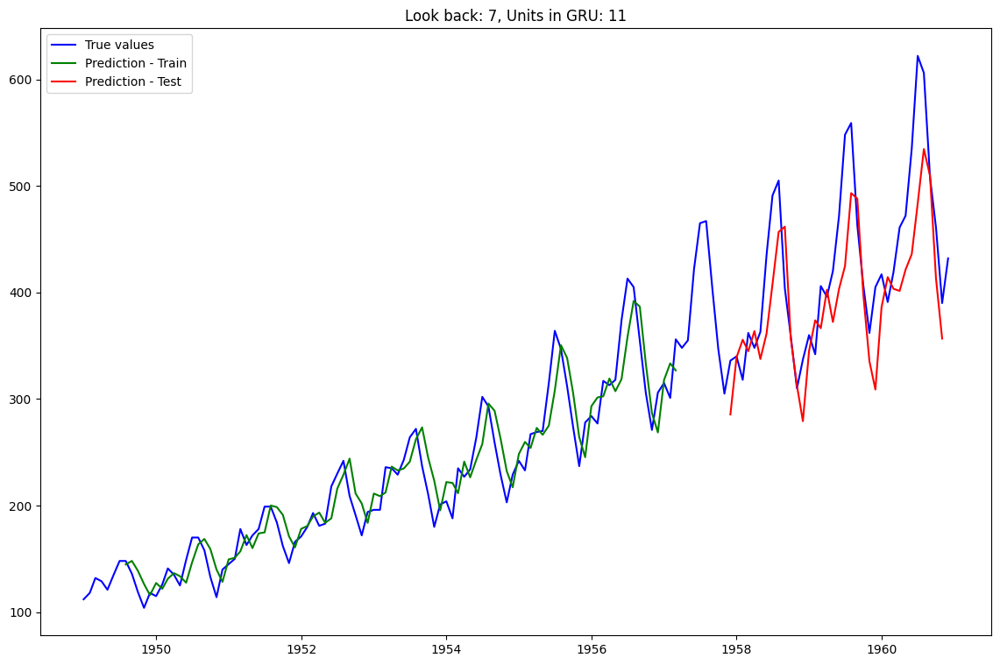

Epoch 1/100
91/91 [==============================] - 3s 4ms/step - loss: 0.0445
Epoch 2/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0174
Epoch 3/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0164
Epoch 4/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0151
Epoch 5/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0124
Epoch 6/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0124
Epoch 7/100
91/91 [==============================] - 0s 5ms/step - loss: 0.0113
Epoch 8/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0107
Epoch 9/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0099
Epoch 10/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 11/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 12/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0092
Epoch 13/100
91/91 [=================

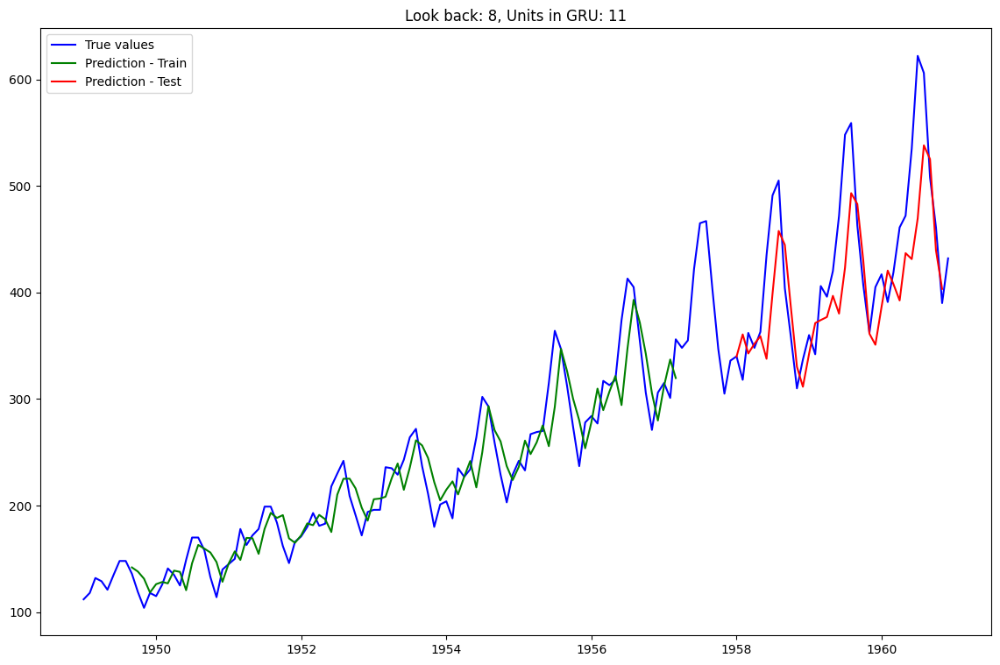

Epoch 1/100
90/90 [==============================] - 3s 4ms/step - loss: 0.0654
Epoch 2/100
90/90 [==============================] - 0s 5ms/step - loss: 0.0192
Epoch 3/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0173
Epoch 4/100
90/90 [==============================] - 0s 5ms/step - loss: 0.0148
Epoch 5/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0136
Epoch 6/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0127
Epoch 7/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0113
Epoch 8/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0105
Epoch 9/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 10/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0092
Epoch 11/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0083
Epoch 12/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0081
Epoch 13/100
90/90 [=================

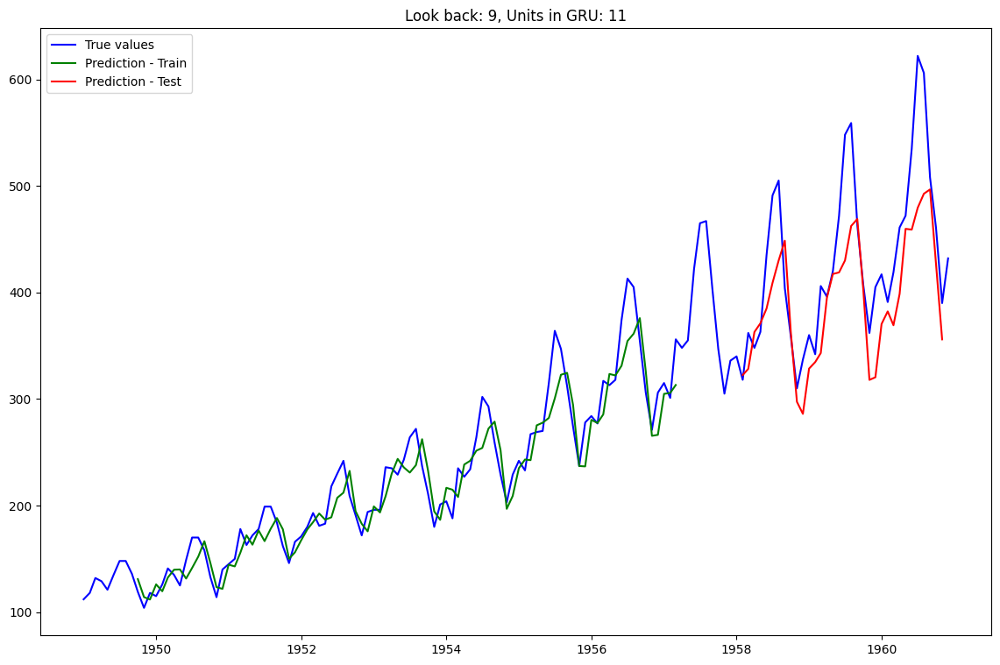

Epoch 1/100
89/89 [==============================] - 3s 3ms/step - loss: 0.0408
Epoch 2/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0141
Epoch 3/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0117
Epoch 4/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 5/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0095
Epoch 6/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0086
Epoch 7/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 8/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0070
Epoch 9/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0076
Epoch 10/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0070
Epoch 11/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0065
Epoch 12/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0069
Epoch 13/100
89/89 [=================

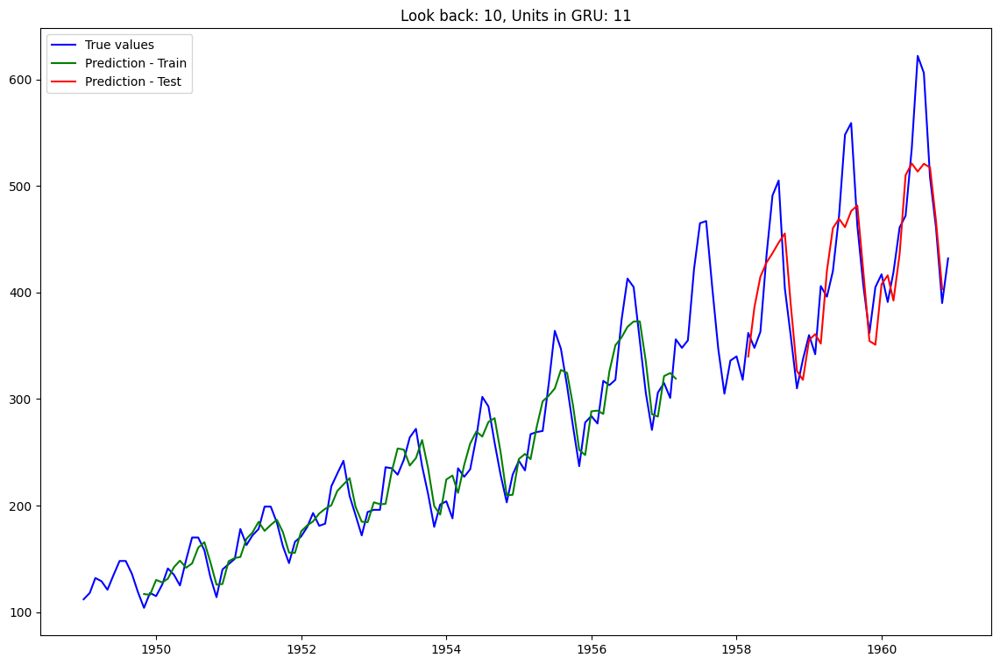

Epoch 1/100
88/88 [==============================] - 3s 4ms/step - loss: 0.0715
Epoch 2/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0173
Epoch 3/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0154
Epoch 4/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0130
Epoch 5/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0117
Epoch 6/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0103
Epoch 7/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0091
Epoch 8/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0086
Epoch 9/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0075
Epoch 10/100
88/88 [==============================] - 0s 5ms/step - loss: 0.0069
Epoch 11/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0064
Epoch 12/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0056
Epoch 13/100
88/88 [=================

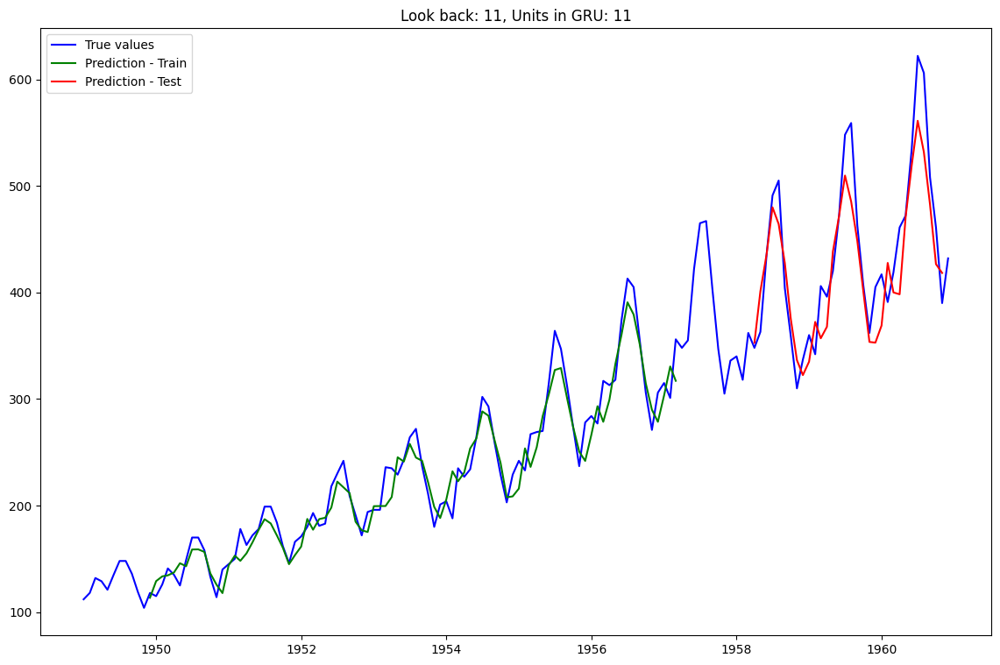

Epoch 1/100
87/87 [==============================] - 3s 3ms/step - loss: 0.2068
Epoch 2/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0212
Epoch 3/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0148
Epoch 4/100
87/87 [==============================] - 0s 5ms/step - loss: 0.0113
Epoch 5/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0084
Epoch 6/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0063
Epoch 7/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0054
Epoch 8/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 9/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0036
Epoch 10/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0033
Epoch 11/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0028
Epoch 12/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0028
Epoch 13/100
87/87 [=================

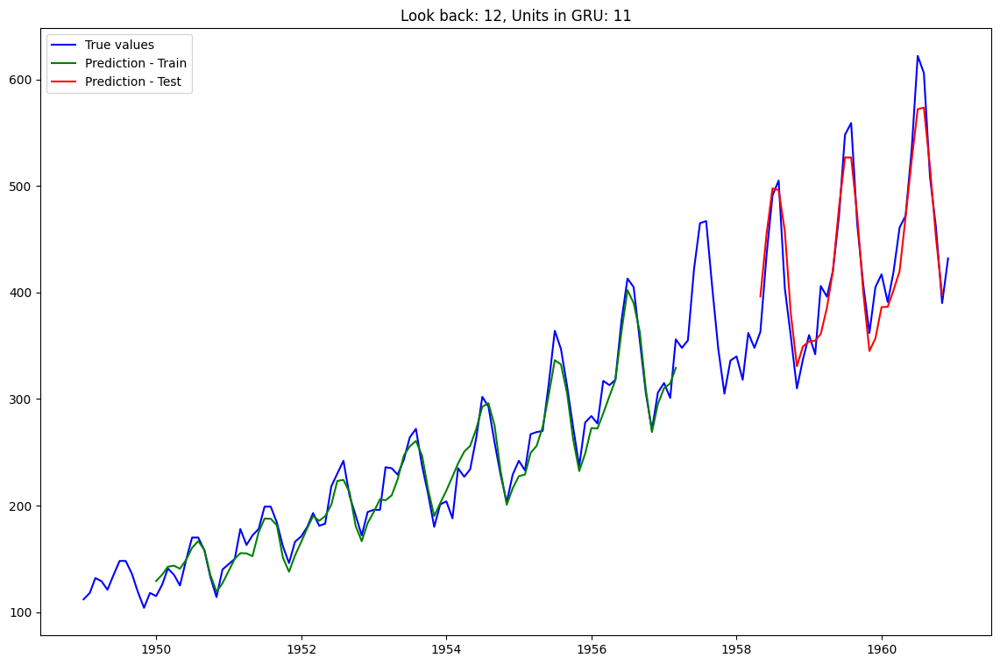

Epoch 1/100
98/98 [==============================] - 3s 4ms/step - loss: 0.0600
Epoch 2/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0238
Epoch 3/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0194
Epoch 4/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0153
Epoch 5/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0117
Epoch 6/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0091
Epoch 7/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0076
Epoch 8/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0070
Epoch 9/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0064
Epoch 10/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0060
Epoch 11/100
98/98 [==============================] - 0s 3ms/step - loss: 0.0061
Epoch 12/100
98/98 [==============================] - 0s 4ms/step - loss: 0.0063
Epoch 13/100
98/98 [=================

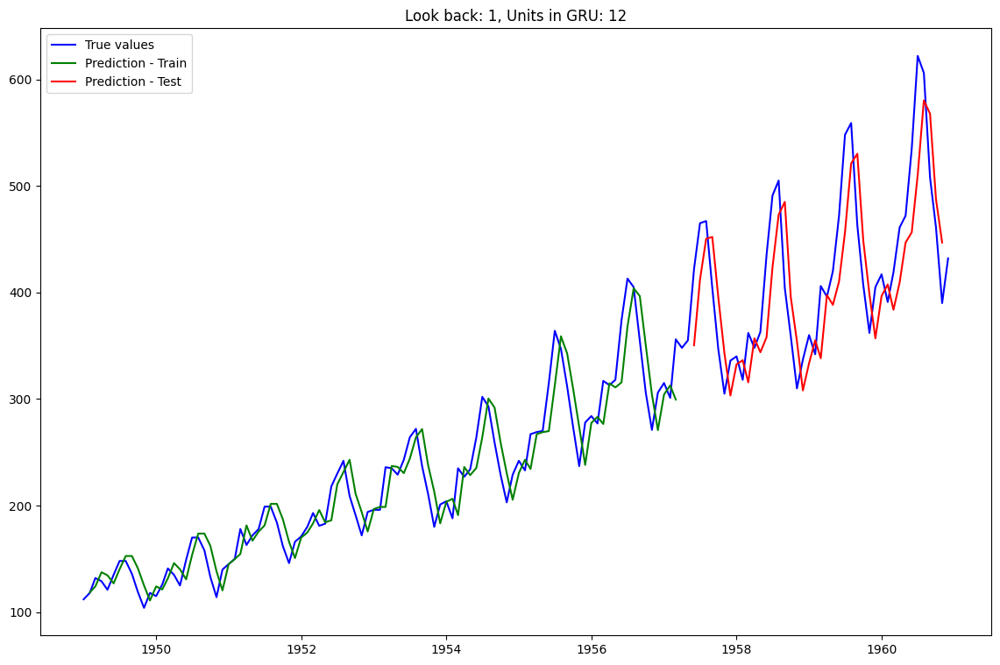

Epoch 1/100
97/97 [==============================] - 3s 3ms/step - loss: 0.1093
Epoch 2/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0324
Epoch 3/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0244
Epoch 4/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0187
Epoch 5/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0148
Epoch 6/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 7/100
97/97 [==============================] - 0s 4ms/step - loss: 0.0098
Epoch 8/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0090
Epoch 9/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0083
Epoch 10/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0078
Epoch 11/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0084
Epoch 12/100
97/97 [==============================] - 0s 3ms/step - loss: 0.0080
Epoch 13/100
97/97 [=================

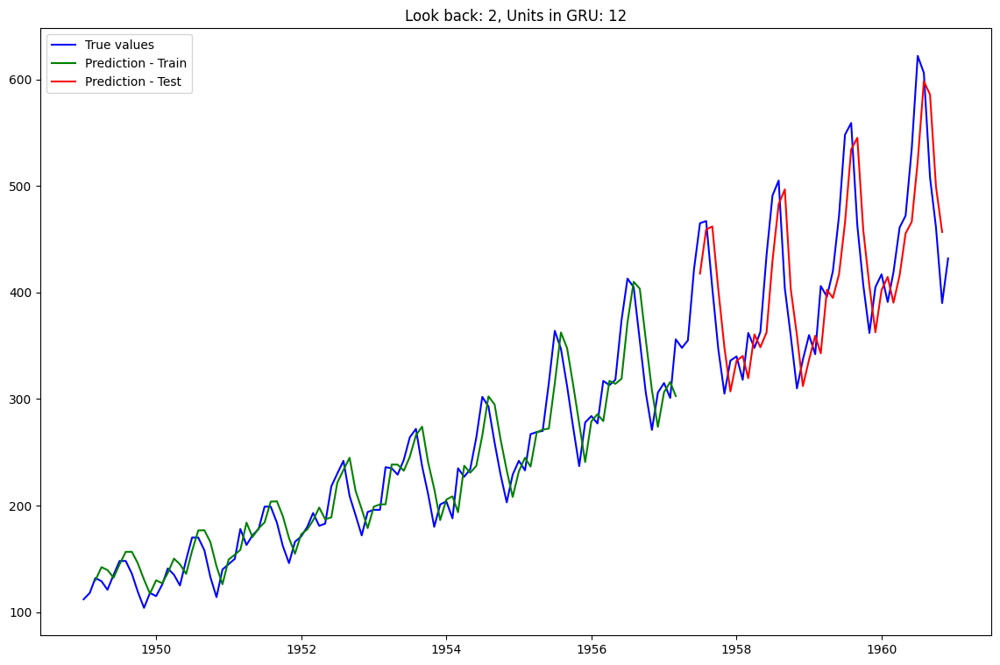

Epoch 1/100
96/96 [==============================] - 3s 4ms/step - loss: 0.0855
Epoch 2/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0224
Epoch 3/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0174
Epoch 4/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0141
Epoch 5/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0120
Epoch 6/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0106
Epoch 7/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0097
Epoch 8/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0095
Epoch 9/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 10/100
96/96 [==============================] - 0s 4ms/step - loss: 0.0090
Epoch 11/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0090
Epoch 12/100
96/96 [==============================] - 0s 3ms/step - loss: 0.0088
Epoch 13/100
96/96 [=================

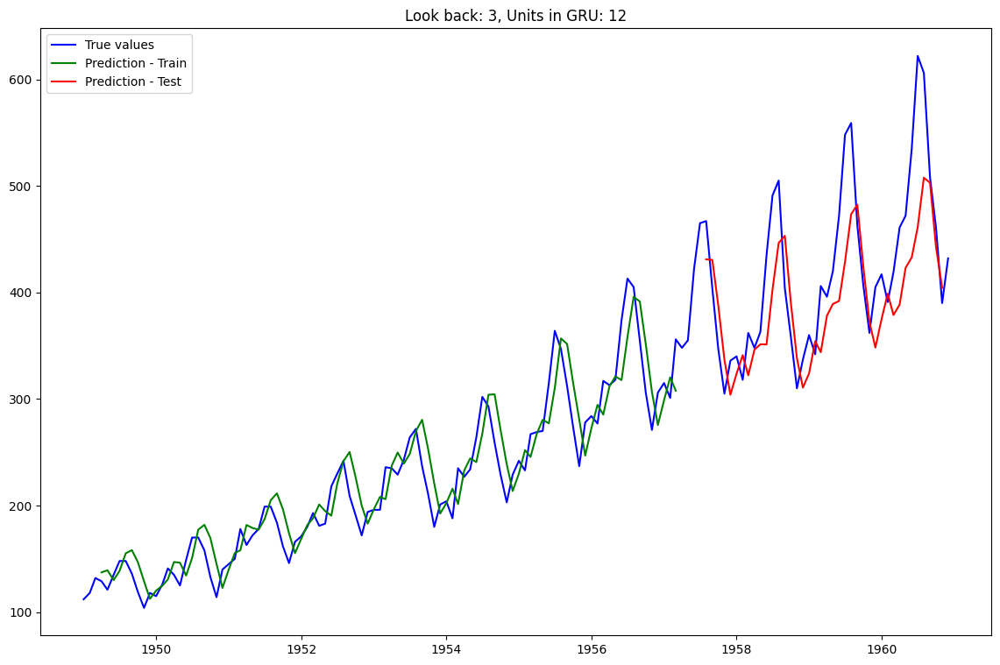

Epoch 1/100
95/95 [==============================] - 3s 3ms/step - loss: 0.1085
Epoch 2/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0232
Epoch 3/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0170
Epoch 4/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0142
Epoch 5/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0122
Epoch 6/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0107
Epoch 7/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0103
Epoch 8/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0100
Epoch 9/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0097
Epoch 10/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0091
Epoch 11/100
95/95 [==============================] - 0s 4ms/step - loss: 0.0094
Epoch 12/100
95/95 [==============================] - 0s 3ms/step - loss: 0.0089
Epoch 13/100
95/95 [=================

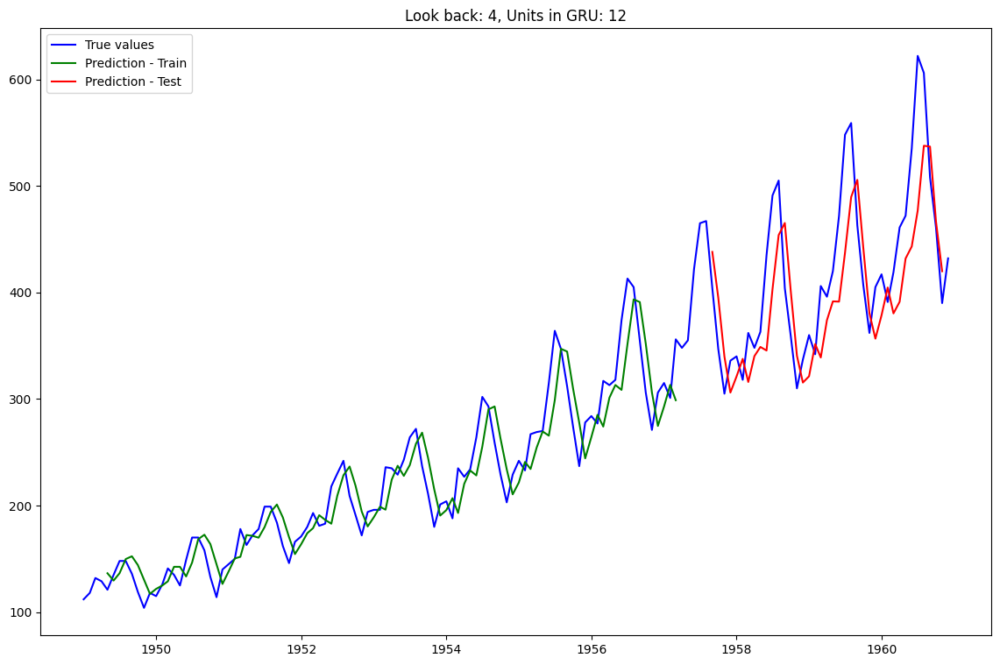

Epoch 1/100
94/94 [==============================] - 3s 4ms/step - loss: 0.0643
Epoch 2/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0215
Epoch 3/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0180
Epoch 4/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0166
Epoch 5/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0142
Epoch 6/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0143
Epoch 7/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0135
Epoch 8/100
94/94 [==============================] - 0s 4ms/step - loss: 0.0133
Epoch 9/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0124
Epoch 10/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0113
Epoch 11/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0116
Epoch 12/100
94/94 [==============================] - 0s 3ms/step - loss: 0.0109
Epoch 13/100
94/94 [=================

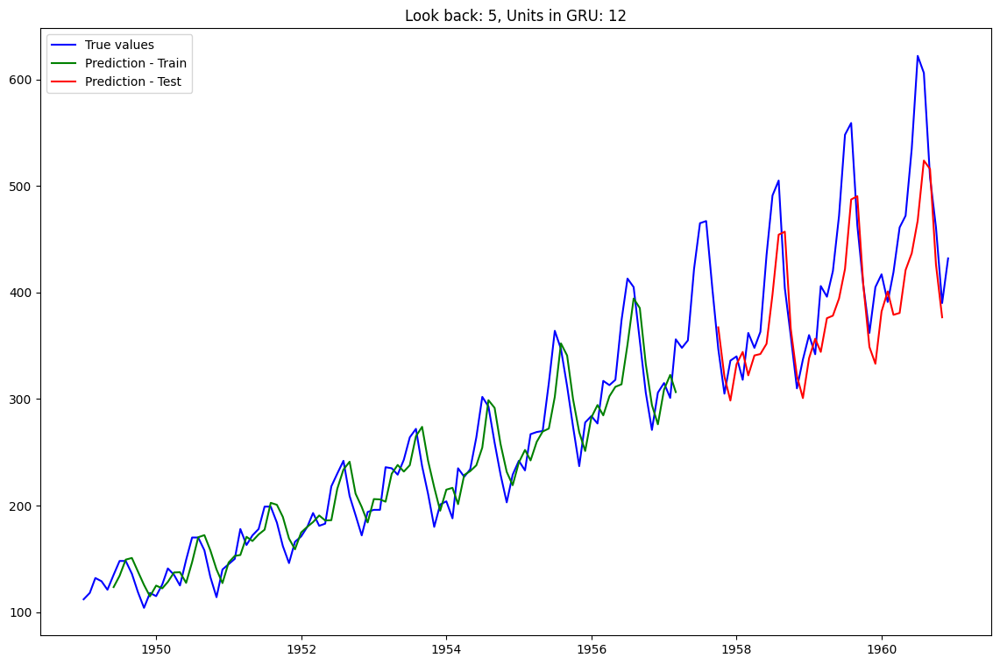

Epoch 1/100
93/93 [==============================] - 3s 4ms/step - loss: 0.0899
Epoch 2/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0207
Epoch 3/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0182
Epoch 4/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0157
Epoch 5/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0146
Epoch 6/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0133
Epoch 7/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0137
Epoch 8/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0123
Epoch 9/100
93/93 [==============================] - 0s 3ms/step - loss: 0.0116
Epoch 10/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 11/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0098
Epoch 12/100
93/93 [==============================] - 0s 4ms/step - loss: 0.0098
Epoch 13/100
93/93 [=================

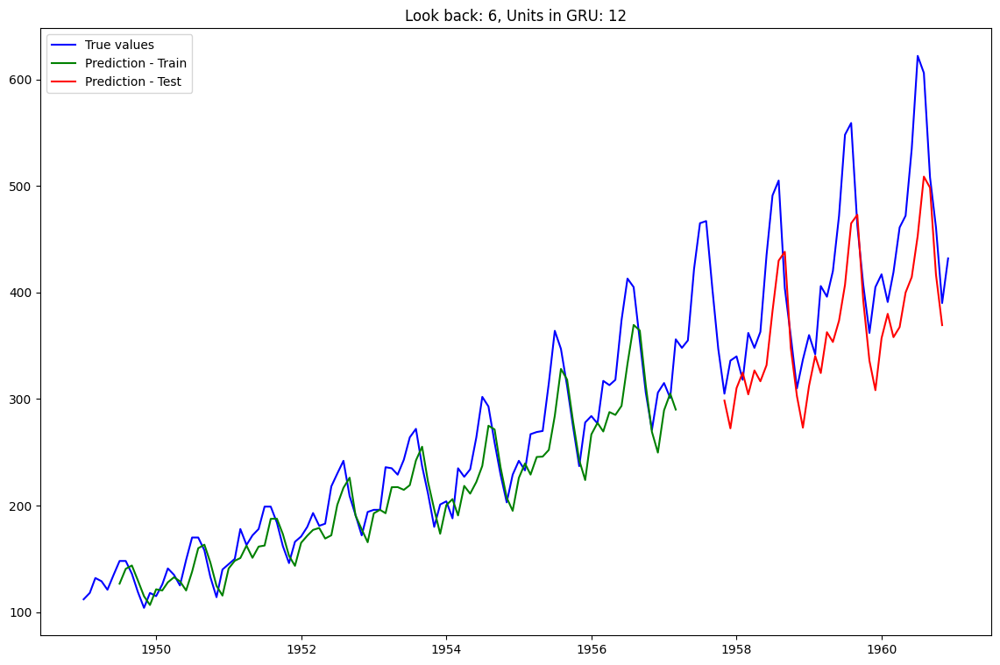

Epoch 1/100
92/92 [==============================] - 3s 4ms/step - loss: 0.1914
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0321
Epoch 3/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0267
Epoch 4/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0223
Epoch 5/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0190
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0174
Epoch 7/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0157
Epoch 8/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0147
Epoch 9/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0146
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0134
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 0.0131
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss: 0.0122
Epoch 13/100
92/92 [=================

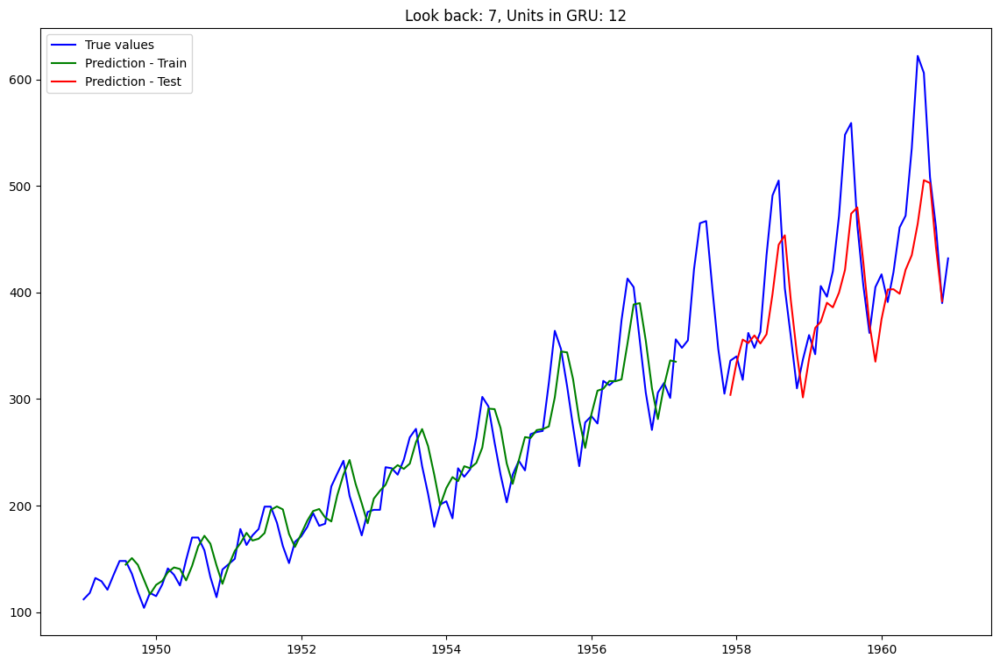

Epoch 1/100
91/91 [==============================] - 3s 3ms/step - loss: 0.0755
Epoch 2/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0172
Epoch 3/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0150
Epoch 4/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0143
Epoch 5/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0129
Epoch 6/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0122
Epoch 7/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0108
Epoch 8/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0104
Epoch 9/100
91/91 [==============================] - 0s 3ms/step - loss: 0.0106
Epoch 10/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0095
Epoch 11/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0089
Epoch 12/100
91/91 [==============================] - 0s 4ms/step - loss: 0.0085
Epoch 13/100
91/91 [=================

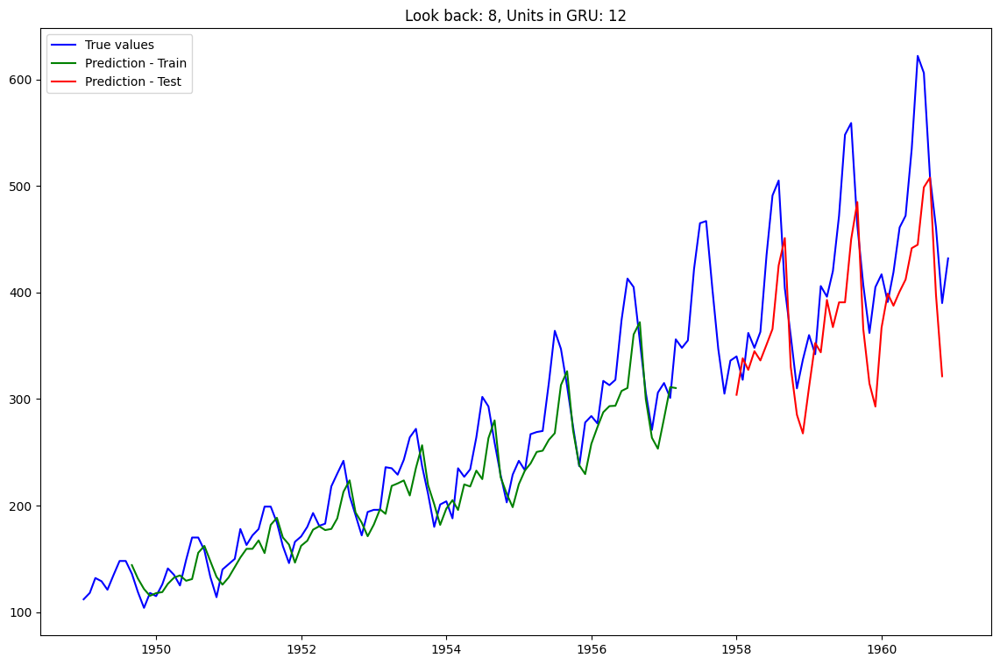

Epoch 1/100
90/90 [==============================] - 3s 4ms/step - loss: 0.1631
Epoch 2/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0285
Epoch 3/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0245
Epoch 4/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0219
Epoch 5/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0195
Epoch 6/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0188
Epoch 7/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0165
Epoch 8/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0159
Epoch 9/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0153
Epoch 10/100
90/90 [==============================] - 0s 4ms/step - loss: 0.0141
Epoch 11/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0125
Epoch 12/100
90/90 [==============================] - 0s 3ms/step - loss: 0.0120
Epoch 13/100
90/90 [=================

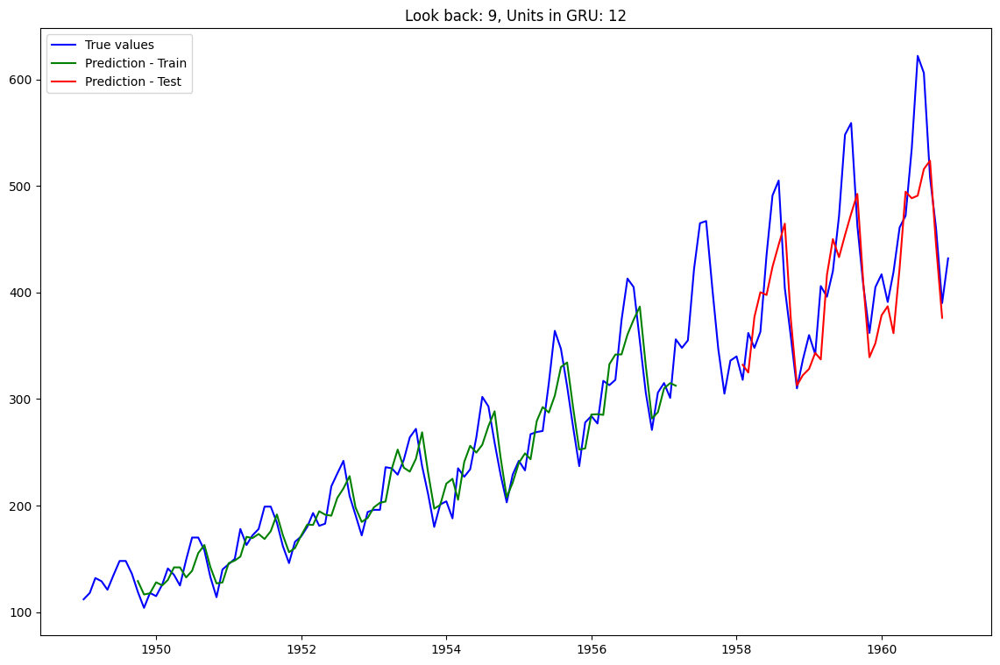

Epoch 1/100
89/89 [==============================] - 3s 3ms/step - loss: 0.1011
Epoch 2/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0201
Epoch 3/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0172
Epoch 4/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0147
Epoch 5/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0128
Epoch 6/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0116
Epoch 7/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0101
Epoch 8/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0094
Epoch 9/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0086
Epoch 10/100
89/89 [==============================] - 0s 3ms/step - loss: 0.0078
Epoch 11/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0069
Epoch 12/100
89/89 [==============================] - 0s 4ms/step - loss: 0.0067
Epoch 13/100
89/89 [=================

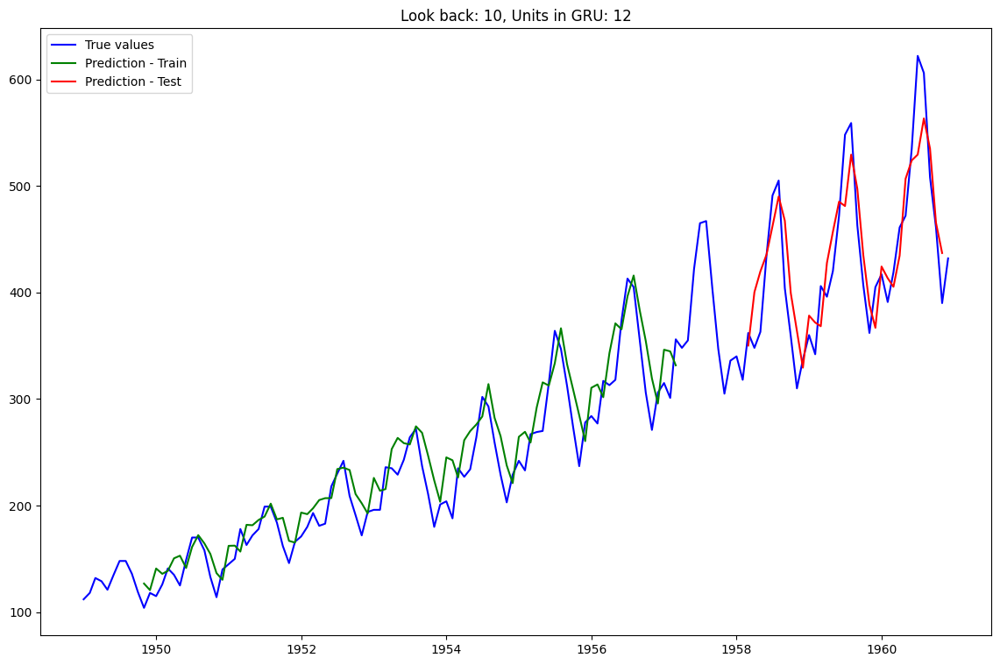

Epoch 1/100
88/88 [==============================] - 3s 4ms/step - loss: 0.0196
Epoch 2/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0146
Epoch 3/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0130
Epoch 4/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0113
Epoch 5/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0101
Epoch 6/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0085
Epoch 7/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0078
Epoch 8/100
88/88 [==============================] - 0s 3ms/step - loss: 0.0068
Epoch 9/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0067
Epoch 10/100
88/88 [==============================] - 0s 5ms/step - loss: 0.0060
Epoch 11/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0055
Epoch 12/100
88/88 [==============================] - 0s 4ms/step - loss: 0.0053
Epoch 13/100
88/88 [=================

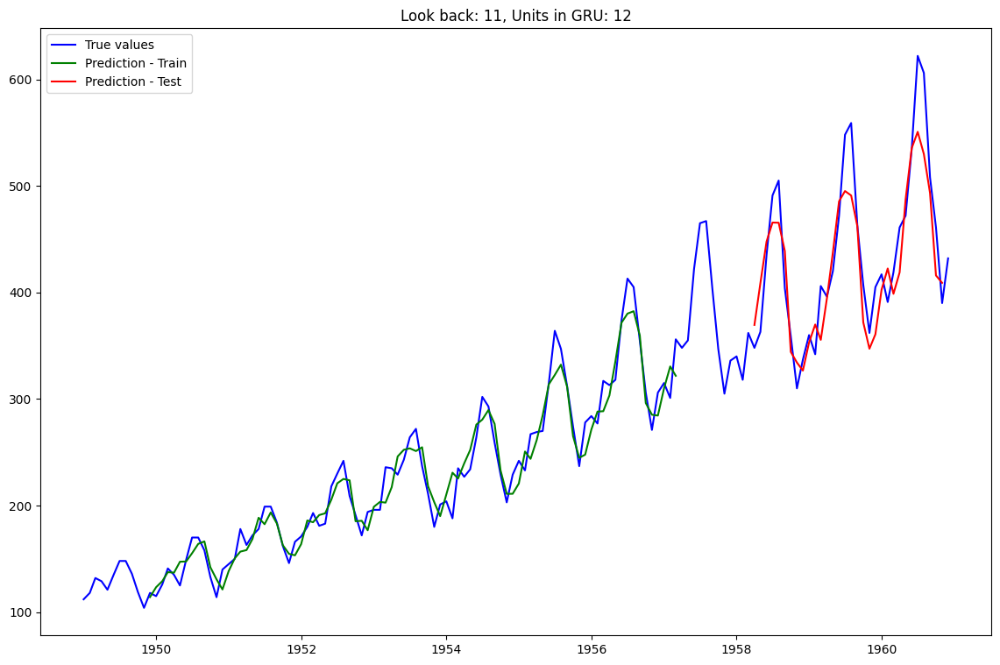

Epoch 1/100
87/87 [==============================] - 3s 4ms/step - loss: 0.0492
Epoch 2/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0160
Epoch 3/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0139
Epoch 4/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0117
Epoch 5/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0106
Epoch 6/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0083
Epoch 7/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0070
Epoch 8/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0061
Epoch 9/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0053
Epoch 10/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0044
Epoch 11/100
87/87 [==============================] - 0s 4ms/step - loss: 0.0039
Epoch 12/100
87/87 [==============================] - 0s 3ms/step - loss: 0.0038
Epoch 13/100
87/87 [=================

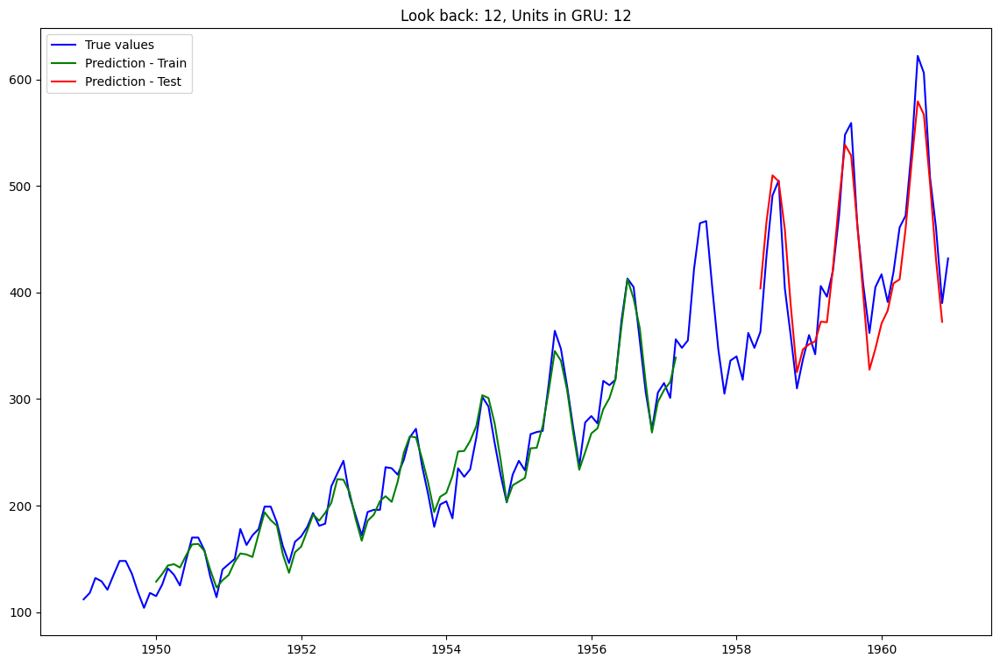

In [ ]:
from keras.callbacks import EarlyStopping
scores = []
for k in range(1,13):
  for j in range(1,13):
    look_back = j
    def create_dataset(df, train_size, lback=look_back, scaler_function=scaler):
      test_size = len(df) - train_size
      train, test = df[0:train_size,:].copy(), df[train_size:len(df),:].copy()
      train = scaler_function.fit_transform(train)
      test = scaler_function.transform(test)
      X_train, X_test, y_train, y_test = [], [], [], []

      # Tworzenie zbioru treninowego
      for i in range(len(train)-lback-1):
        a = train[i:(i+lback), 0]
        X_train.append(a)
        y_train.append(train[i + lback, 0])

      # Tworzenie zbioru testowego
      for i in range(len(test)-lback-1):
        a = test[i:(i+lback), 0]
        X_test.append(a)
        y_test.append(test[i + lback, 0])

      X_train, X_test = np.array(X_train), np.array(X_test)
      X_train, X_test = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1])), np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
      y_train, y_test = np.array(y_train), np.array(y_test)
      return X_train, X_test, y_train, y_test

    X_train, X_test, y_train, y_test = create_dataset(df=np.array(dataset), train_size=train_size, lback=look_back)
    def backtests(model, lback=look_back):

      # predykcja - train
      prediction_train = scaler.inverse_transform(model.predict(X_train))
      prediction_train = pd.Series(prediction_train.flatten(),
                                index=dataset.index[lback:len(prediction_train)+lback])

    # predykcja - test
      prediction_test = scaler.inverse_transform(model.predict(X_test))
      prediction_test = pd.Series(prediction_test.flatten(),
                                index=dataset.index[len(prediction_train)+(2*lback)+1:len(dataset)-1])

    # wizualizacja prognozy
      plt.figure(figsize=(14,9))
      plt.plot(dataset['Passengers'], color='blue', label='True values')
      plt.plot(prediction_train, color='green', label='Prediction - Train')
      plt.plot(prediction_test, color='red', label='Prediction - Test')
      plt.legend(loc='upper left')
      plt.title(str(f"Look back: {j}, Units in GRU: {k}"))
      plt.show()

    # obliczenie RMSE
      rmse = mean_squared_error(dataset.loc[prediction_test.index, :], prediction_test) ** 0.5
      scores.append([j,k,rmse])
    es = EarlyStopping(monitor='loss', patience=5)
    model_gru = Sequential()
    model_gru.add(GRU(k, input_shape=(1, look_back)))
    model_gru.add(Dense(1))
    model_gru.compile(loss='mean_squared_error', optimizer='adam')
    model_gru.fit(X_train, y_train, epochs=100, batch_size=1, verbose=1, callbacks=[es])
    backtests(model_gru)

In [ ]:
df_rmse = pd.DataFrame(scores, columns=['look_back', 'units', 'RMSE'])
df_rmse

,look_back,units,RMSE
0,1,1,79.541807
1,2,1,80.632867
2,3,1,64.711987
3,4,1,70.179144
4,5,1,86.240344
...,...,...,...
139,8,12,72.057986
140,9,12,48.883421
141,10,12,37.553519
142,11,12,34.852924


In [ ]:
df_rmse.iloc[df_rmse['RMSE'].idxmin()]

look_back    12.00000
units        10.00000
RMSE         23.03497
Name: 119, dtype: float64